In [1]:
# 0. Import

import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

In [2]:
import celloracle as co
co.__version__

/home/tamalika/.local/lib/python3.10/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/tamalika/.local/lib/python3.10/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/home/tamalika/.local/lib/python3.10/s

'0.16.0'

In [3]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [4]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

In [5]:
# Load the Anndata object from the h5ad file
adata = sc.read_h5ad("./write/PBMC_withoutX.h5ad")
adata

AnnData object with n_obs × n_vars = 1108 × 25286
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [6]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :1108
Gene number is :25286


In [7]:
#load base GRN info
base_GRN = co.data.load_human_promoter_base_GRN()

Loading prebuilt promoter base-GRN. Version: hg19_gimmemotifsv5_fpr2


In [8]:
# Check data
base_GRN.head()

,peak_id,gene_short_name,9430076C15RIK,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,ZNF784,ZNF8,ZNF816,ZNF85,ZSCAN10,ZSCAN16,ZSCAN22,ZSCAN26,ZSCAN31,ZSCAN4
0,chr10_100027907_100029007,LOXL4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100154964_100156064,MIR1287,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr10_100174878_100175978,PYROXD2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,chr10_100191017_100192117,MIR4685,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_100205078_100206178,LOC101927278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
# Instantiate Oracle object
oracle = co.Oracle()

In [10]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden']
Dimensional reduction:  ['X_pca', 'X_umap']


In [11]:
# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="leiden",
                                   embedding_name="X_umap")

25286 genes were found in the adata. Note that Celloracle is intended to use around 1000-3000 genes, so the behavior with this number of genes may differ from what is expected.


In [12]:
adata.X.max()

7.2946177

In [15]:
oracle.import_TF_data(TF_info_matrix=base_GRN)

TF dict already exists. The old TF dict data was deleted. 



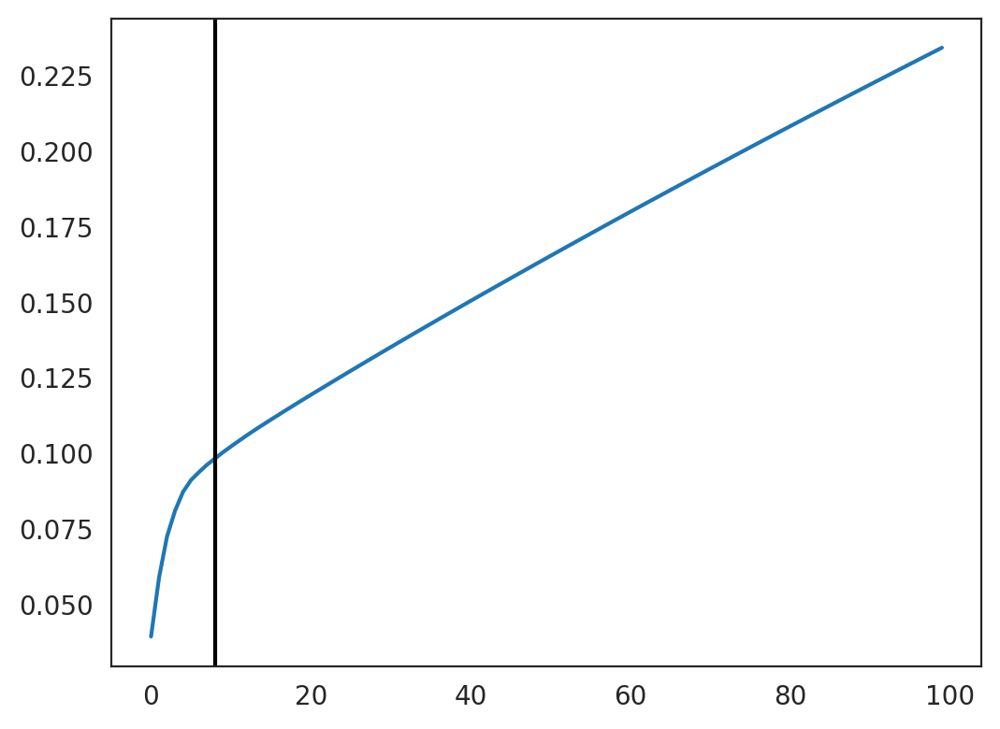

8


In [16]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :1108


In [17]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :27


In [18]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

In [19]:
%%time
#GRN CALCULATION
links = oracle.get_links(cluster_name_for_GRN_unit="leiden", alpha=10,
                         verbose_level=10)

  0%|          | 0/8 [00:00<?, ?it/s]

Inferring GRN for B...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for CD14+ Monocytes...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for CD4 T...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for CD8 T...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for Dendritic...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for FCGR3A+ Monocytes...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for Megakaryocytes...


  0%|          | 0/17199 [00:00<?, ?it/s]

Inferring GRN for NK...


  0%|          | 0/17199 [00:00<?, ?it/s]

CPU times: user 2h 38min 12s, sys: 7min 13s, total: 2h 45min 26s
Wall time: 2h 36min 42s


In [20]:
links.links_dict.keys()

dict_keys(['B', 'CD14+ Monocytes', 'CD4 T', 'CD8 T', 'Dendritic', 'FCGR3A+ Monocytes', 'Megakaryocytes', 'NK'])

In [21]:
links.links_dict["B"]

,source,target,coef_mean,coef_abs,p,-logp
0,TFAP2E,A1BG,0.000385,0.000385,4.692424e-01,0.328603
1,SP1,A1BG,0.002511,0.002511,1.058173e-03,2.975443
2,YY1,A1BG,0.001148,0.001148,2.223890e-03,2.652887
3,THRA,A1BG,0.000670,0.000670,2.025090e-01,0.693556
4,SREBF1,A1BG,0.005823,0.005823,2.996802e-06,5.523342
...,...,...,...,...,...,...
2173480,SP6,ZZZ3,0.000000,0.000000,NaN,-0.000000
2173481,SIN3A,ZZZ3,0.008718,0.008718,2.088773e-08,7.680109
2173482,ZBTB49,ZZZ3,-0.001618,0.001618,7.439992e-02,1.128428
2173483,CLOCK,ZZZ3,0.010560,0.010560,3.531838e-10,9.451999


In [22]:
#filter network edges
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [23]:
plt.rcParams["figure.figsize"] = [9, 4.5]

B


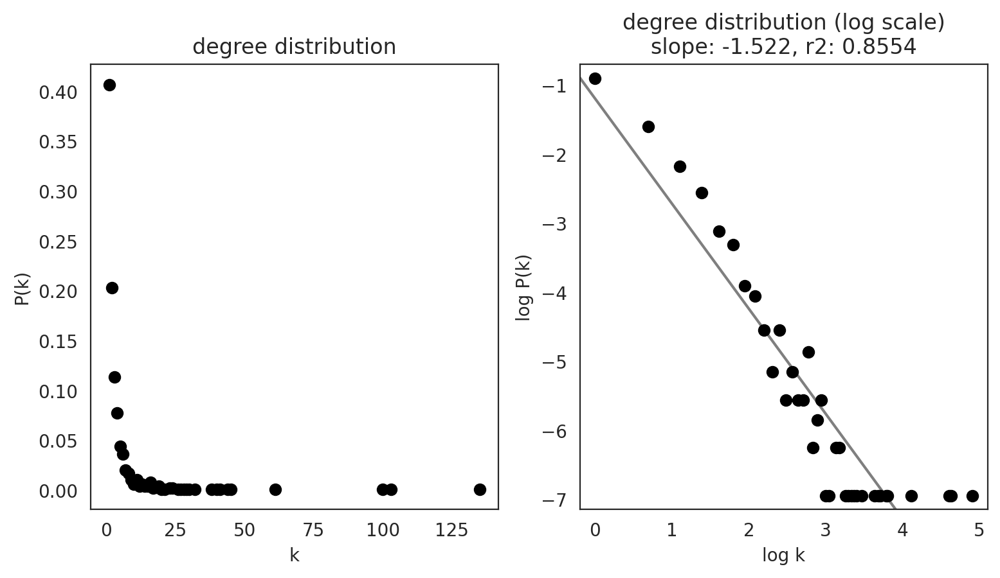

CD14+ Monocytes


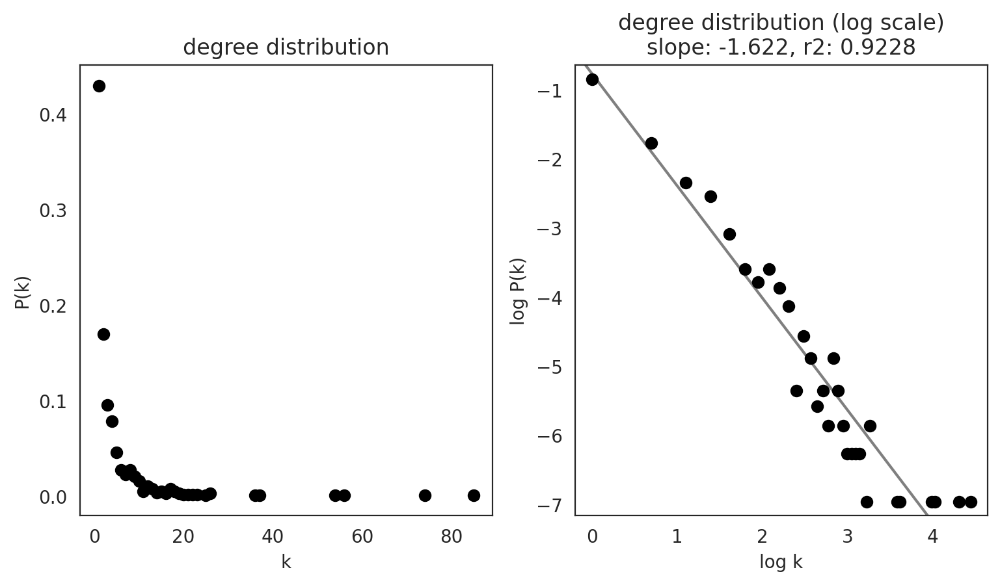

CD4 T


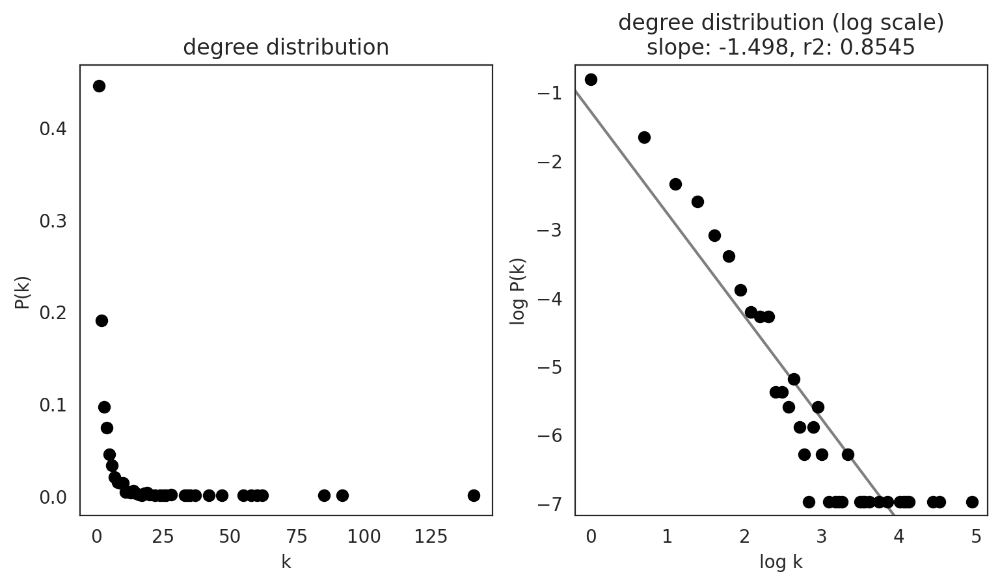

CD8 T


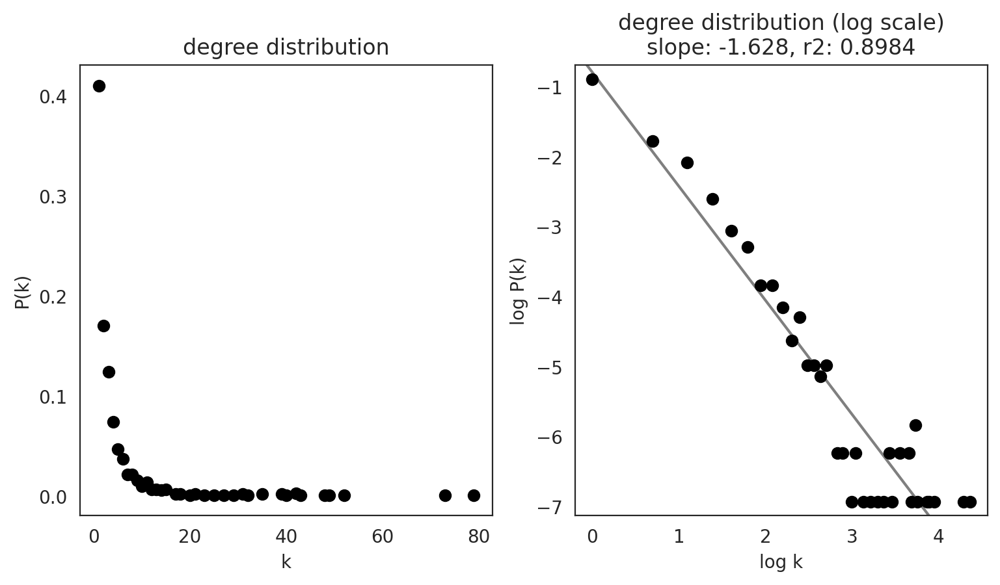

Dendritic


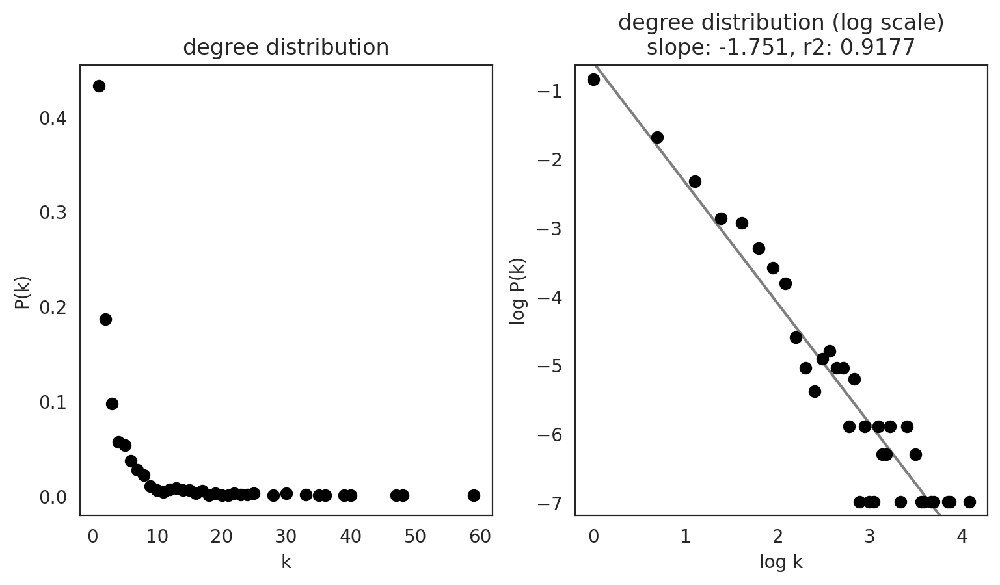

FCGR3A+ Monocytes


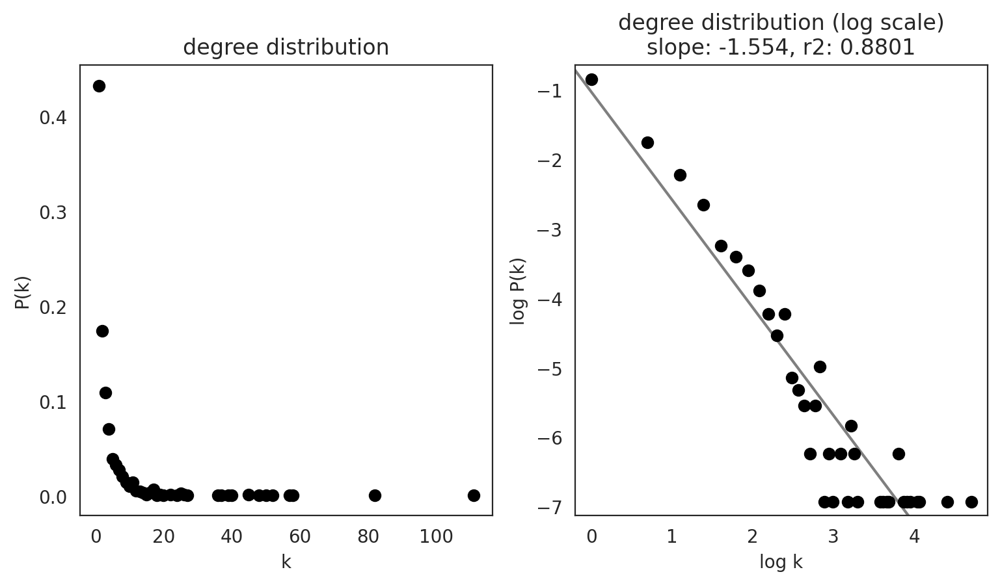

Megakaryocytes


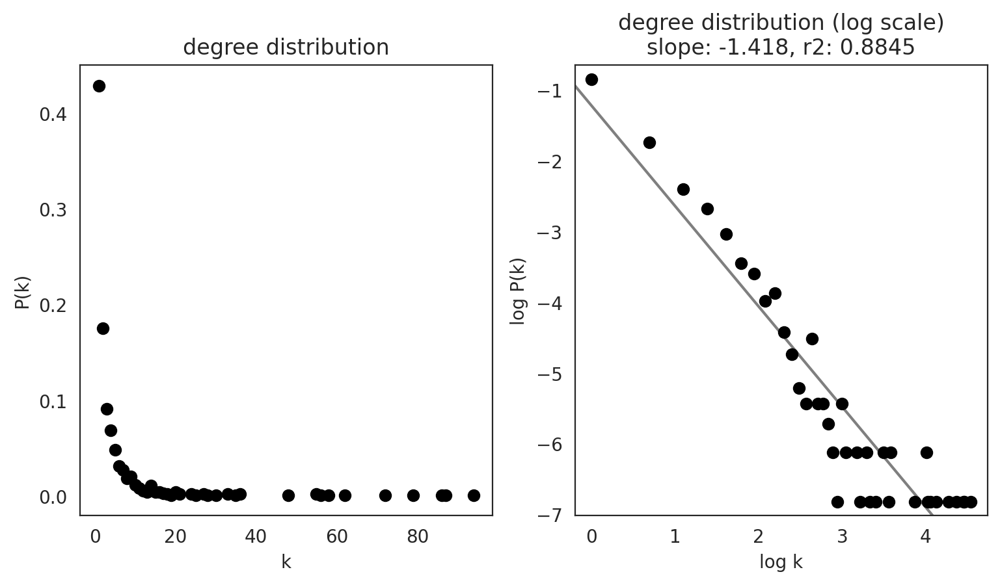

NK


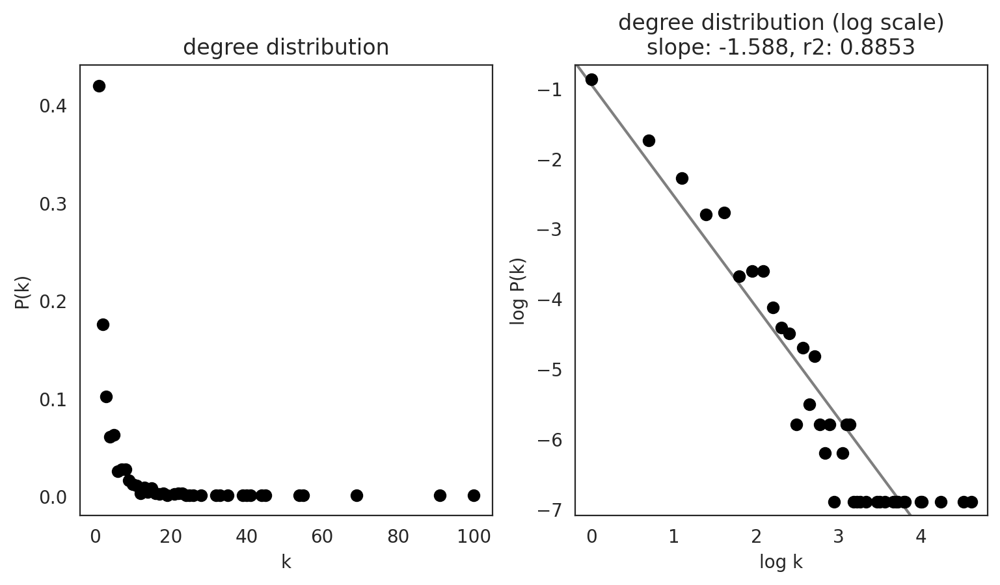

In [24]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [25]:
plt.rcParams["figure.figsize"] = [6, 4.5]

In [26]:
# Calculate network scores.
links.get_network_score()

In [27]:
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
ZBTB16,5,0.004812,0,0.000000,5,0.004812,0.0,0.010704,B
AOAH,14,0.013474,14,0.013474,0,0.000000,0.0,0.028598,B
NR2C2,11,0.010587,0,0.000000,11,0.010587,0.0,0.018383,B
GZMK,24,0.023099,24,0.023099,0,0.000000,0.0,0.032198,B
RFX7,7,0.006737,0,0.000000,7,0.006737,0.0,0.011715,B


In [28]:
links.filtered_links['B']

,source,target,coef_mean,coef_abs,p,-logp
91139,ZBTB16,AOAH,0.159514,0.159514,1.212914e-15,14.916170
754957,NR2C2,GZMK,-0.112891,0.112891,5.309980e-15,14.274907
754962,RFX7,GZMK,0.109853,0.109853,1.147424e-12,11.940276
278322,MYBL1,CCL5,0.101809,0.101809,1.975637e-15,14.704293
91119,IRF3,AOAH,0.094439,0.094439,4.002778e-13,12.397638
...,...,...,...,...,...,...
789702,CHD2,HNRNPH1,0.025943,0.025943,8.805699e-09,8.055236
1510424,FOSB,RASGRP1,0.025941,0.025941,1.589848e-11,10.798644
1504089,FOSL1,RAP1B,0.025937,0.025937,2.114676e-10,9.674756
108221,RUNX2,ARHGAP15,0.025934,0.025934,4.019467e-08,7.395832


In [29]:
#filter network edges
links.filter_links(p=0.001, weight="coef_abs", threshold_number=50)

In [30]:
plt.rcParams["figure.figsize"] = [9, 4.5]

B


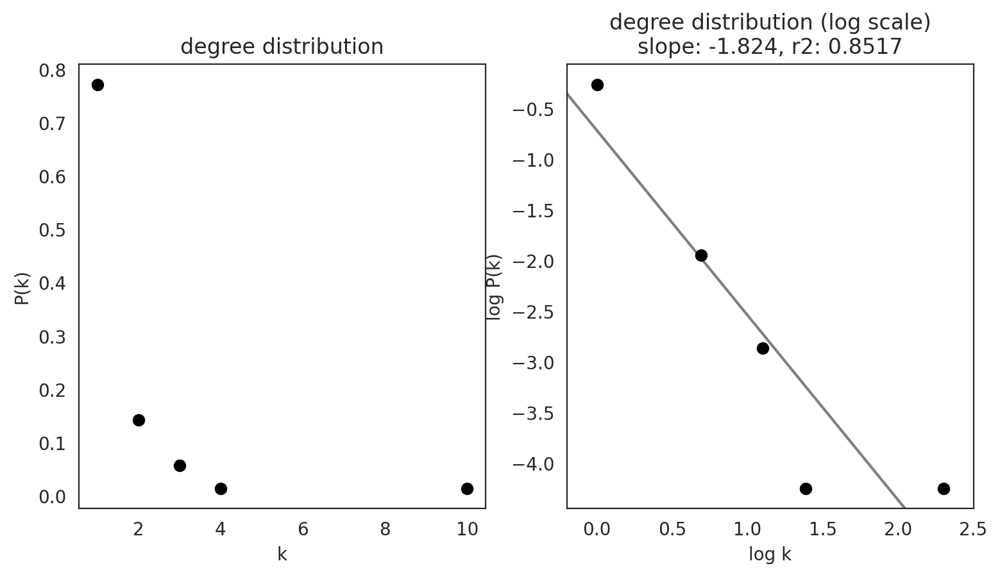

CD14+ Monocytes


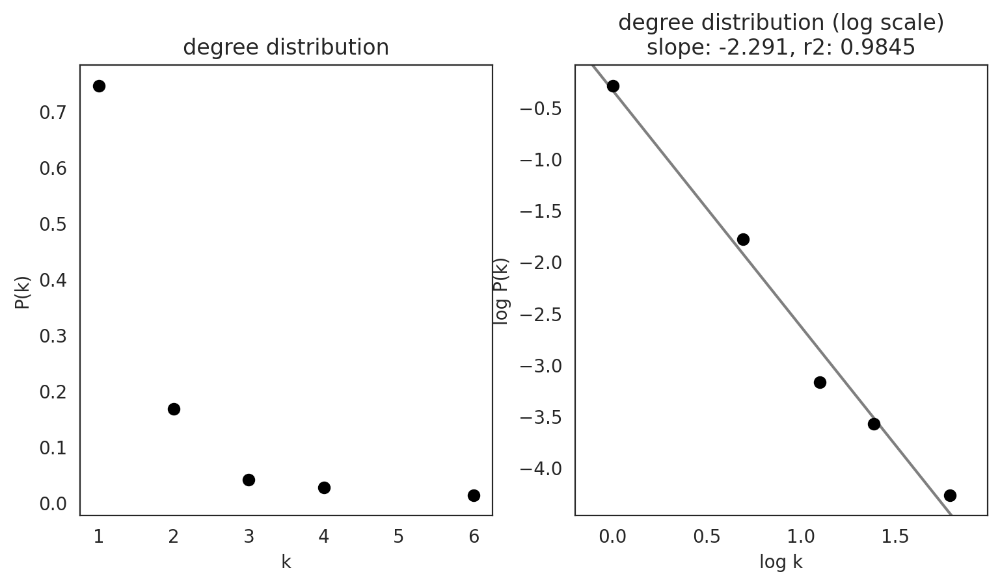

CD4 T


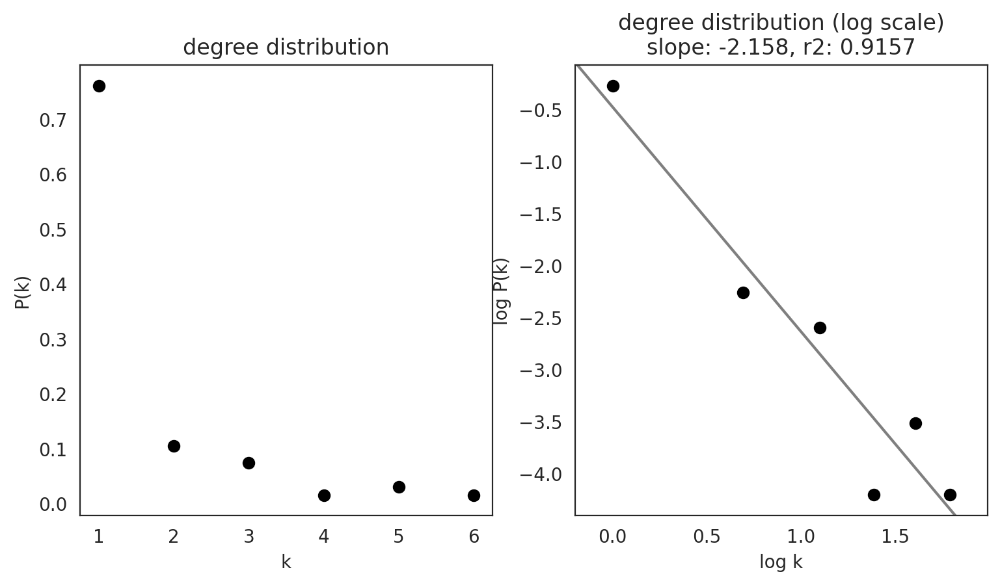

CD8 T


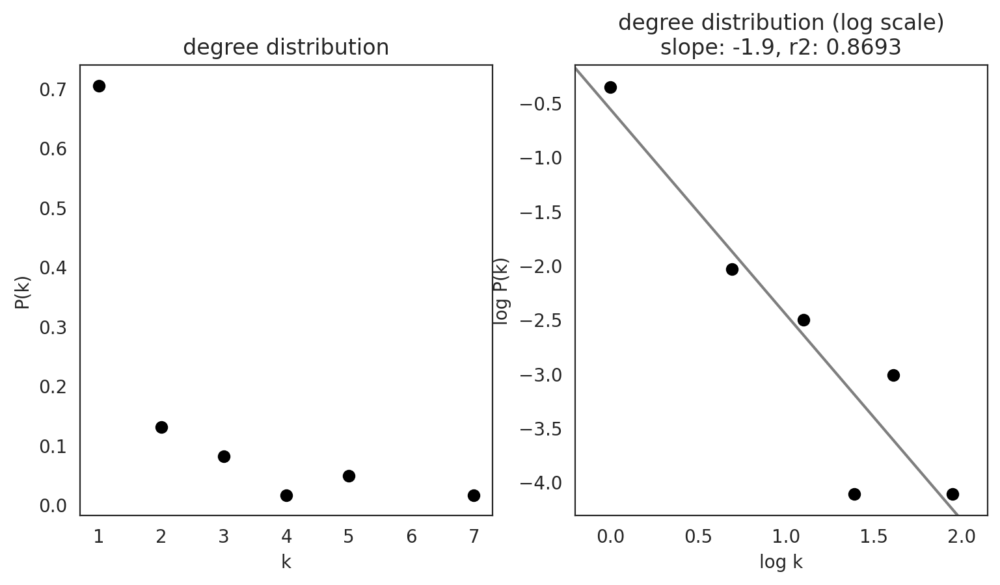

Dendritic


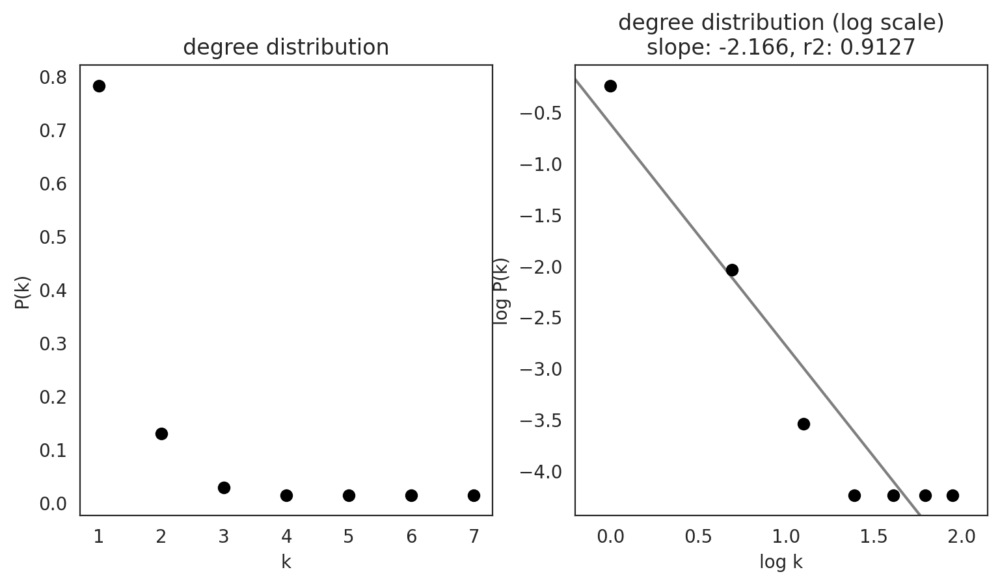

FCGR3A+ Monocytes


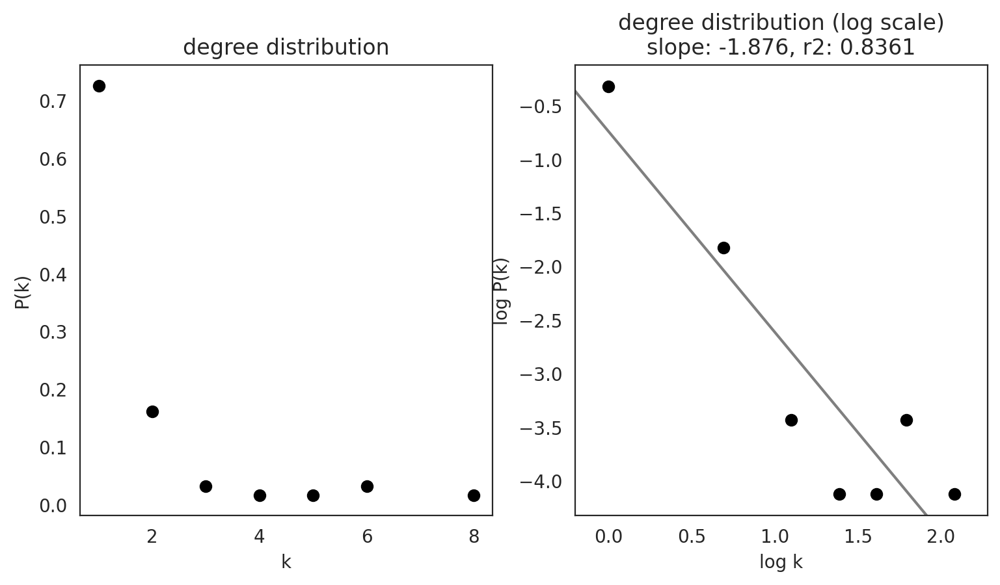

Megakaryocytes


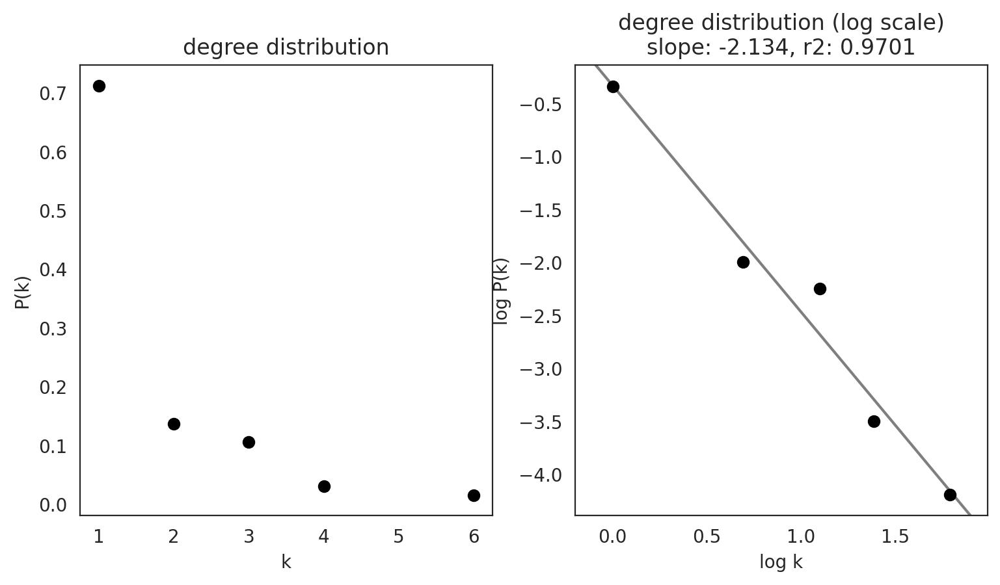

NK


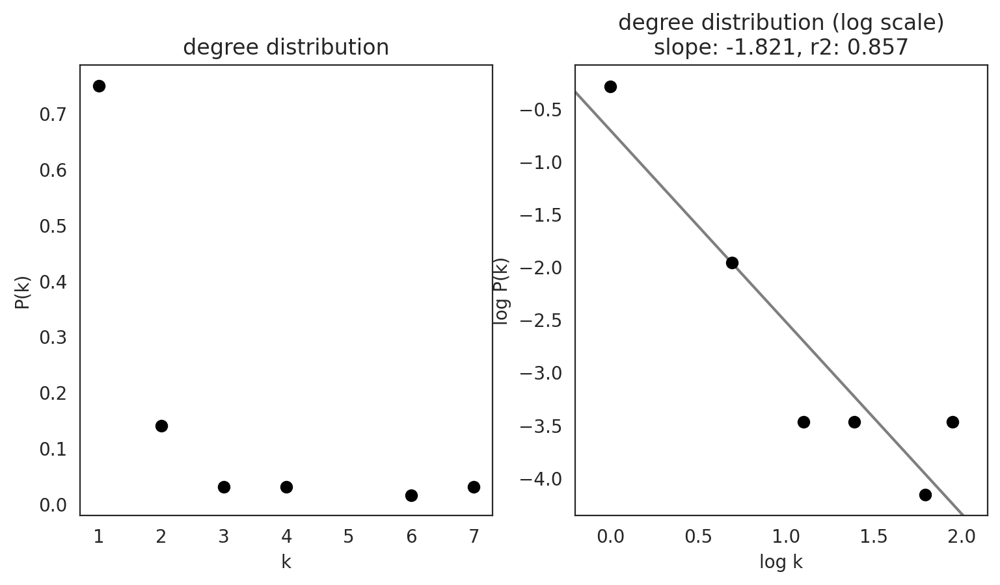

In [31]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [32]:
plt.rcParams["figure.figsize"] = [6, 4.5]

In [33]:
# Calculate network scores.
links.get_network_score()

In [34]:
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
ZBTB16,1,0.014493,0,0.000000,1,0.014493,0.0,0.0,B
AOAH,3,0.043478,3,0.043478,0,0.000000,0.0,0.0,B
NR2C2,1,0.014493,0,0.000000,1,0.014493,0.0,0.0,B
GZMK,4,0.057971,4,0.057971,0,0.000000,0.0,0.0,B
RFX7,1,0.014493,0,0.000000,1,0.014493,0.0,0.0,B


In [35]:
links.filtered_links['B']

,source,target,coef_mean,coef_abs,p,-logp
91139,ZBTB16,AOAH,0.159514,0.159514,1.212914e-15,14.916170
754957,NR2C2,GZMK,-0.112891,0.112891,5.309980e-15,14.274907
754962,RFX7,GZMK,0.109853,0.109853,1.147424e-12,11.940276
278322,MYBL1,CCL5,0.101809,0.101809,1.975637e-15,14.704293
91119,IRF3,AOAH,0.094439,0.094439,4.002778e-13,12.397638
391321,JUND,COX7A2,0.088724,0.088724,6.958653e-17,16.157475
278300,ID2,CCL5,0.088157,0.088157,2.070209e-14,13.683986
1598654,PLAG1,S100A4,-0.087058,0.087058,1.720434e-18,17.764362
1573947,JUND,RPL36,0.086690,0.086690,6.042546e-15,14.218780
201799,JUND,BTG1,0.085027,0.085027,1.855789e-12,11.731471


In [36]:
links.filtered_links['CD14+ Monocytes']

,source,target,coef_mean,coef_abs,p,-logp
913797,MXI1,KLRF1,-0.102985,0.102985,1.700711e-17,16.769369
291175,HOXB2,CD3E,-0.076196,0.076196,1.337445e-14,13.873724
788869,HDAC2,HNRNPA3,0.073350,0.073350,8.001360e-07,6.096836
1200344,TFDP1,NDUFA11,0.067556,0.067556,1.278647e-11,10.893249
291193,FOXO4,CD3E,0.066402,0.066402,3.148035e-07,6.501960
291183,STAT1,CD3E,0.065677,0.065677,3.272539e-13,12.485115
1481273,NFATC2,PYHIN1,0.064148,0.064148,2.232767e-12,11.651157
754771,ZEB1,GZMB,-0.063994,0.063994,1.939051e-17,16.712411
635949,TBX21,FGFBP2,0.061068,0.061068,1.045956e-11,10.980486
1195798,FOXN3,NCOA1,0.057335,0.057335,1.518374e-12,11.818621


In [37]:
links.filtered_links['CD4 T']

,source,target,coef_mean,coef_abs,p,-logp
859700,FOXN3,ITK,0.124736,0.124736,4.924499e-15,14.307638
869425,JUND,JUN,0.108271,0.108271,1.208057e-14,13.917912
391321,JUND,COX7A2,0.099604,0.099604,7.454121e-13,12.127604
1052054,MAF,MACF1,0.096656,0.096656,8.546000e-15,14.068237
1573638,LEF1,RPL34,0.093574,0.093574,7.720245e-10,9.112369
1050394,FOXN3,LYZ,-0.090353,0.090353,7.339065e-10,9.134359
540150,BACH2,EIF3K,0.089612,0.089612,2.032784e-13,12.691909
1050369,JUN,LYZ,-0.089228,0.089228,1.306645e-14,13.883842
788711,MYC,HNRNPA1,0.086881,0.086881,2.946718e-14,13.530661
1574801,ETS1,RPL4,0.085643,0.085643,2.260072e-11,10.645878


In [38]:
links.filtered_links['CD8 T']

,source,target,coef_mean,coef_abs,p,-logp
859700,FOXN3,ITK,0.118932,0.118932,9.968288e-13,12.001379
869425,JUND,JUN,0.113526,0.113526,5.996700e-12,11.222088
788869,HDAC2,HNRNPA3,0.109264,0.109264,5.299138e-09,8.275795
85170,RUNX1,ANKRD55,0.093129,0.093129,3.982443e-13,12.399850
1050394,FOXN3,LYZ,-0.088309,0.088309,4.972541e-12,11.303422
1237921,PLAGL1,NOSIP,-0.084728,0.084728,5.081759e-09,8.293986
1050400,PLAGL1,LYZ,0.077676,0.077676,5.895144e-13,12.229506
1796402,ETS1,STK4,0.076918,0.076918,3.223868e-14,13.491623
391321,JUND,COX7A2,0.076009,0.076009,2.518961e-16,15.598779
869420,XBP1,JUN,0.075952,0.075952,1.194490e-07,6.922817


In [39]:
links.filtered_links['Dendritic']

,source,target,coef_mean,coef_abs,p,-logp
520411,ELF1,EBF1,0.085608,0.085608,1.705935e-11,10.768038
788868,PAX5,HNRNPA3,0.084473,0.084473,9.300322e-08,7.031502
520388,RUNX1,EBF1,0.072327,0.072327,4.949505e-12,11.305438
377906,NR3C1,COL19A1,0.065847,0.065847,1.393131e-11,10.856008
1858167,SP3,TEX14,0.065110,0.065110,1.721270e-11,10.764151
788712,MEF2A,HNRNPA1,0.064559,0.064559,1.082954e-14,13.965390
788703,SMC3,HNRNPA1,0.058869,0.058869,8.250645e-16,15.083512
520403,MYC,EBF1,0.057005,0.057005,1.009440e-08,7.995920
520408,MAX,EBF1,0.055162,0.055162,2.882100e-13,12.540291
788700,YY1,HNRNPA1,0.054480,0.054480,1.066962e-15,14.971851


In [40]:
links.filtered_links['FCGR3A+ Monocytes']

,source,target,coef_mean,coef_abs,p,-logp
788869,HDAC2,HNRNPA3,0.133992,0.133992,1.760168e-12,11.754446
288611,ETS1,CD247,0.132644,0.132644,1.066309e-16,15.972117
85170,RUNX1,ANKRD55,0.100355,0.100355,2.406478e-13,12.618618
859700,FOXN3,ITK,0.095732,0.095732,7.024330e-10,9.153395
777704,PLAGL1,HINT1,-0.089874,0.089874,1.119074e-15,14.951141
788708,RAD21,HNRNPA1,0.085454,0.085454,8.859835e-10,9.052574
869425,JUND,JUN,0.084939,0.084939,1.688080e-11,10.772607
1050369,JUN,LYZ,-0.079925,0.079925,1.108769e-08,7.955159
1580423,PLAGL1,RPS3,-0.077630,0.077630,1.197117e-11,10.921864
391321,JUND,COX7A2,0.077566,0.077566,6.725815e-13,12.172255


In [41]:
links.filtered_links['Megakaryocytes']

,source,target,coef_mean,coef_abs,p,-logp
1323890,SP2,PDCD10,0.051175,0.051175,3.159984e-08,7.500315
409706,EP300,CSF3R,0.047979,0.047979,9.063677e-14,13.042696
1050395,FOXD2,LYZ,-0.038019,0.038019,3.388480e-05,4.469995
1323889,SP1,PDCD10,0.037793,0.037793,5.571318e-06,5.254042
91114,MAFB,AOAH,0.037218,0.037218,7.340215e-16,15.134291
285677,ZNF143,CCT7,0.035422,0.035422,3.622352e-10,9.441009
637231,MAFB,FGL2,0.033760,0.033760,1.112121e-11,10.953848
1050386,ZNF140,LYZ,-0.032033,0.032033,1.101695e-06,5.957939
409707,ELF1,CSF3R,0.031725,0.031725,2.097657e-11,10.678265
420152,RXRA,CTSS,0.031644,0.031644,1.802897e-13,12.744029


In [42]:
links.filtered_links['NK']

,source,target,coef_mean,coef_abs,p,-logp
391321,JUND,COX7A2,0.115634,0.115634,1.790358e-18,17.747060
291150,CTCF,CD3E,0.089518,0.089518,4.201258e-16,15.376621
788869,HDAC2,HNRNPA3,0.089340,0.089340,5.600546e-11,10.251770
1237921,PLAGL1,NOSIP,-0.088479,0.088479,2.011118e-10,9.696563
1050400,PLAGL1,LYZ,0.087044,0.087044,1.949387e-13,12.710102
788711,MYC,HNRNPA1,0.084993,0.084993,8.162252e-16,15.088190
788867,KLF2,HNRNPA2B1,0.084559,0.084559,7.996090e-14,13.097122
914078,IKZF3,KLRK1,0.080053,0.080053,1.812709e-13,12.741672
1237927,PBX2,NOSIP,0.079659,0.079659,6.991335e-11,10.155440
788708,RAD21,HNRNPA1,0.078259,0.078259,8.716042e-11,10.059681


In [43]:
# Check cluster name
links.cluster

['B',
 'CD14+ Monocytes',
 'CD4 T',
 'CD8 T',
 'Dendritic',
 'FCGR3A+ Monocytes',
 'Megakaryocytes',
 'NK']

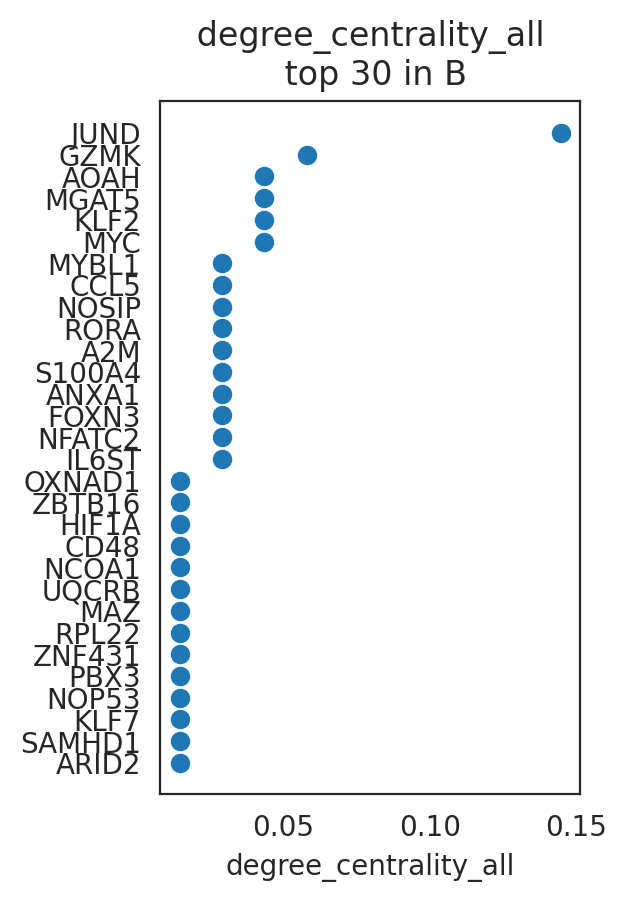

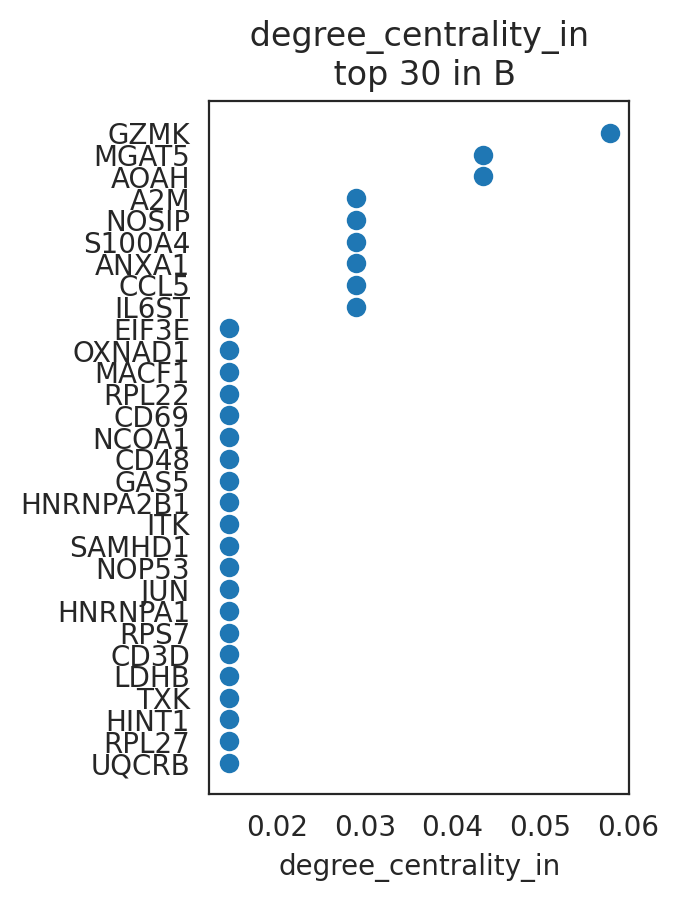

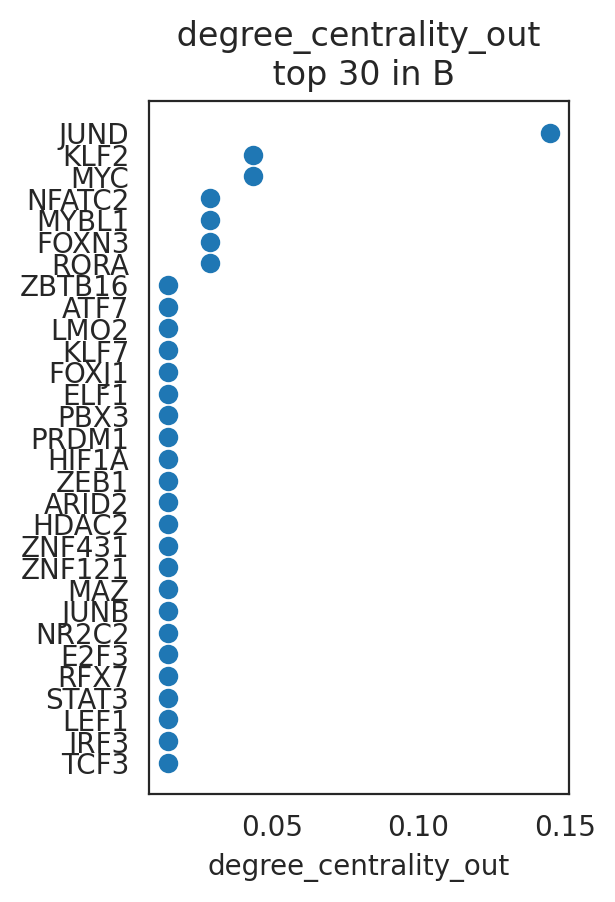

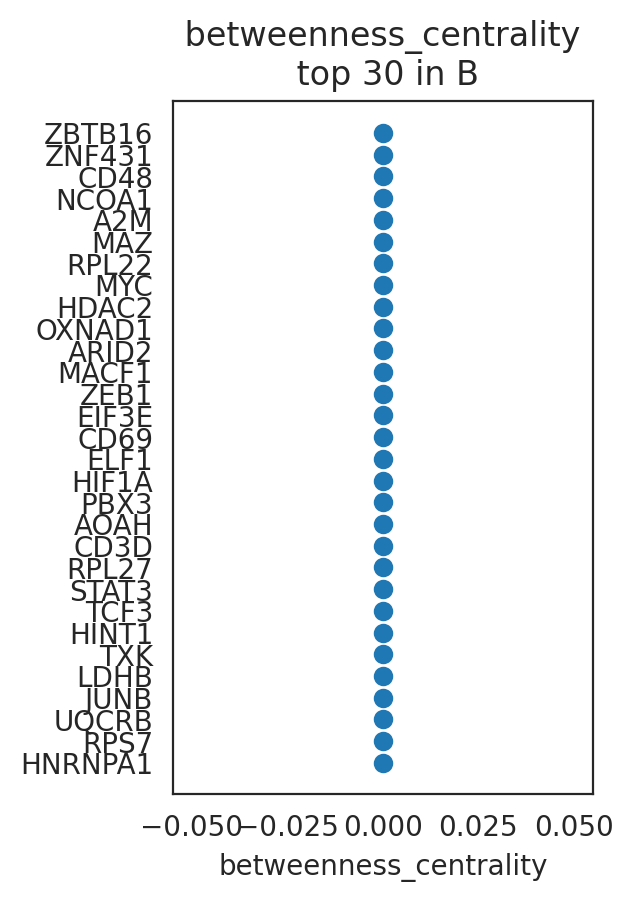

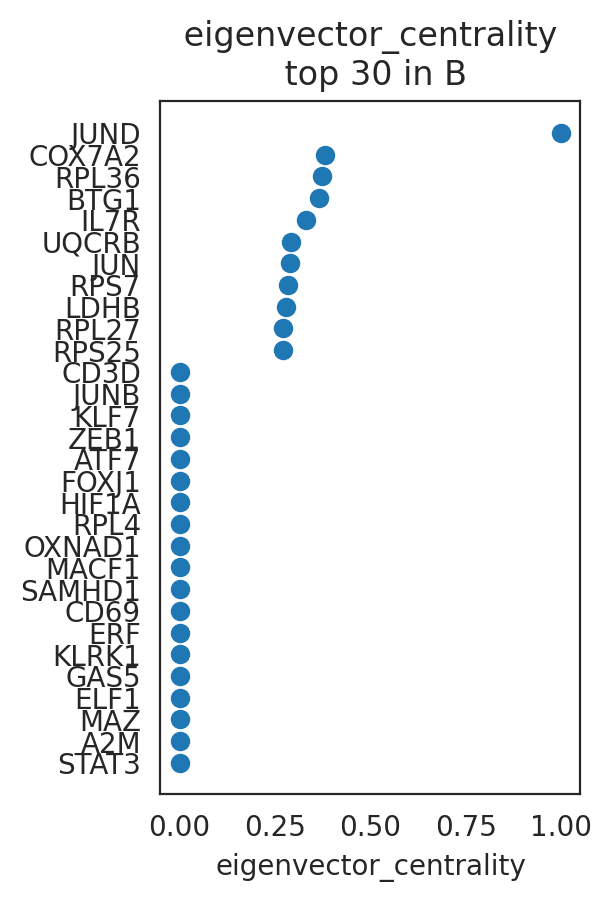

In [44]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="B", n_gene=30,save=f"{save_folder}/ranked_score")

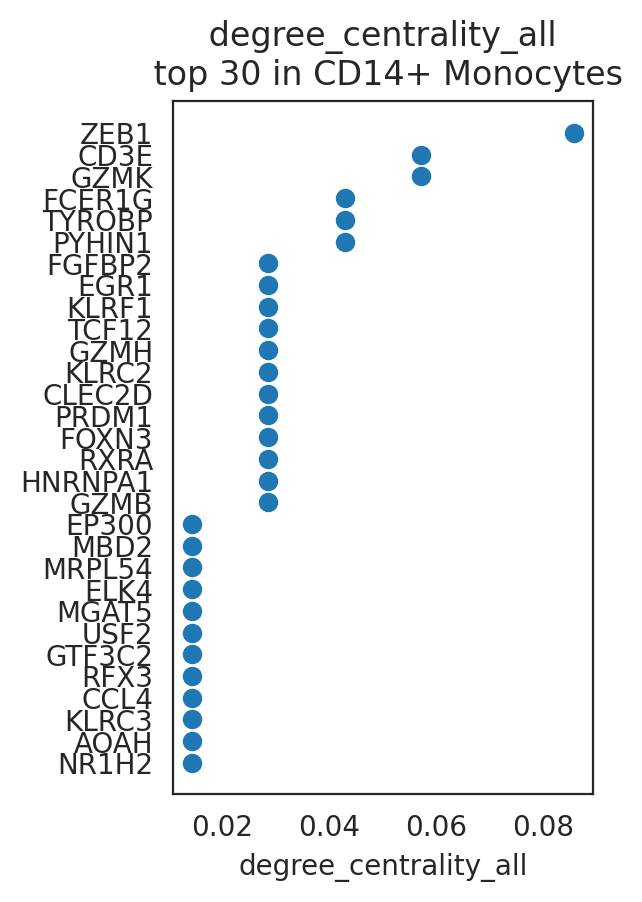

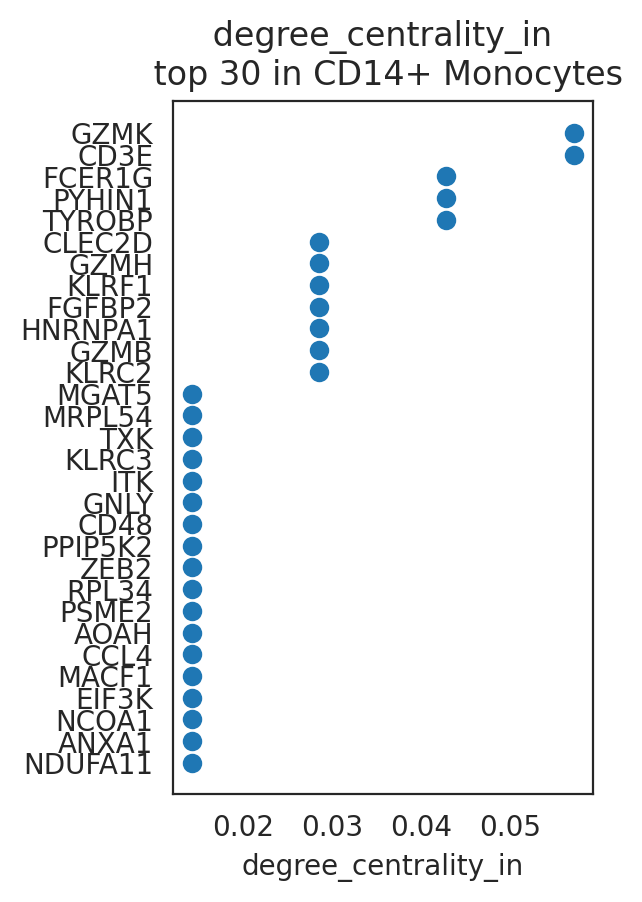

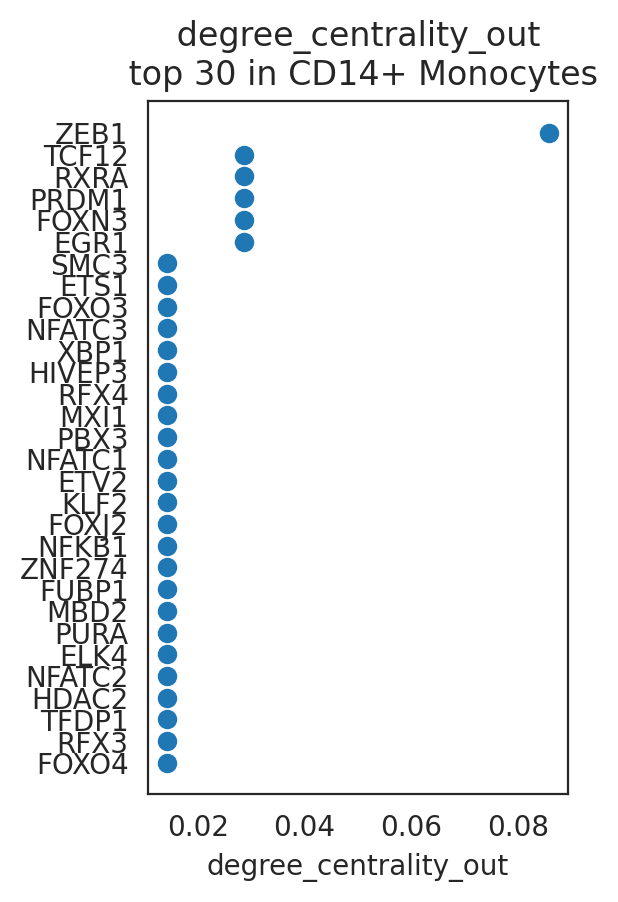

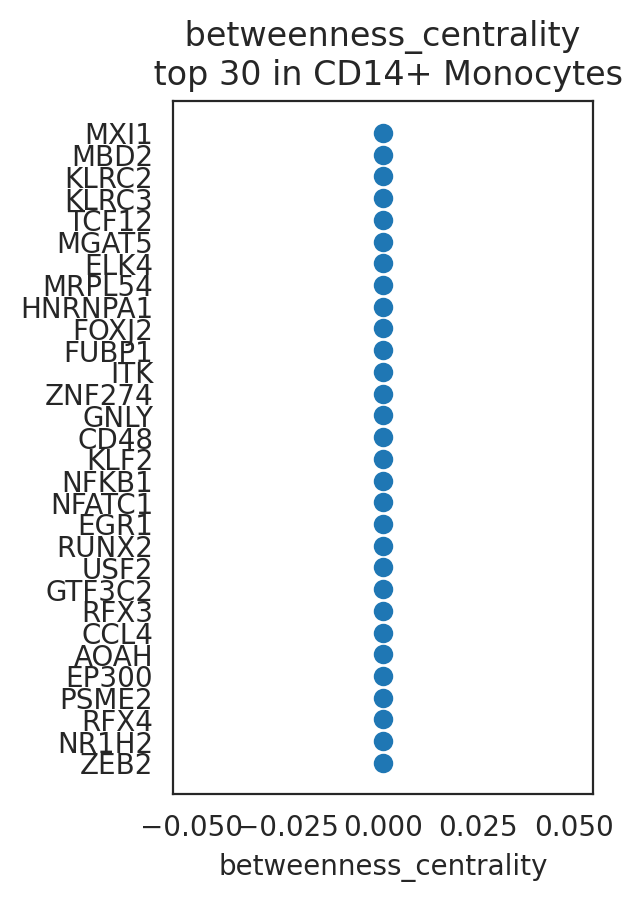

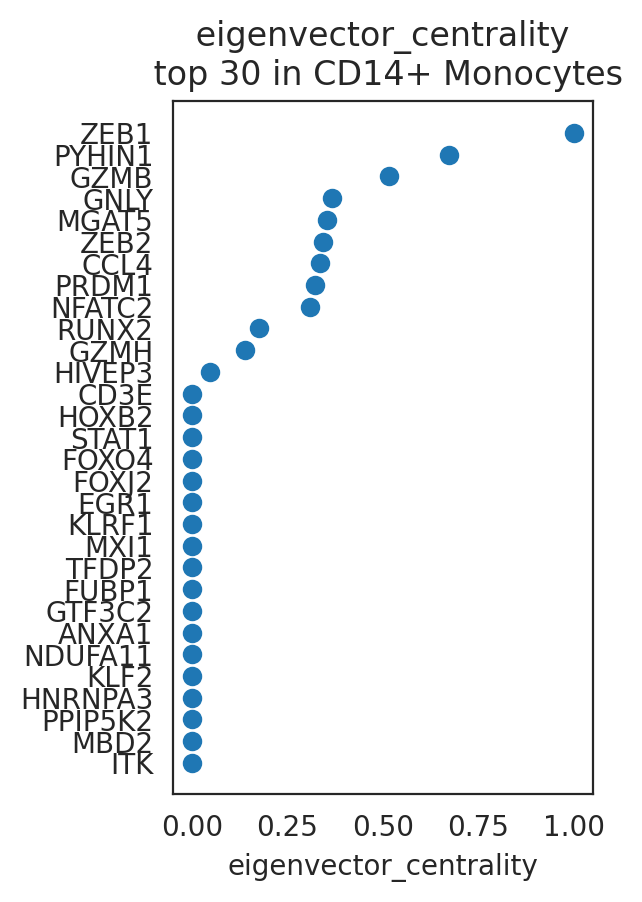

In [45]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="CD14+ Monocytes", n_gene=30,save=f"{save_folder}/ranked_score")

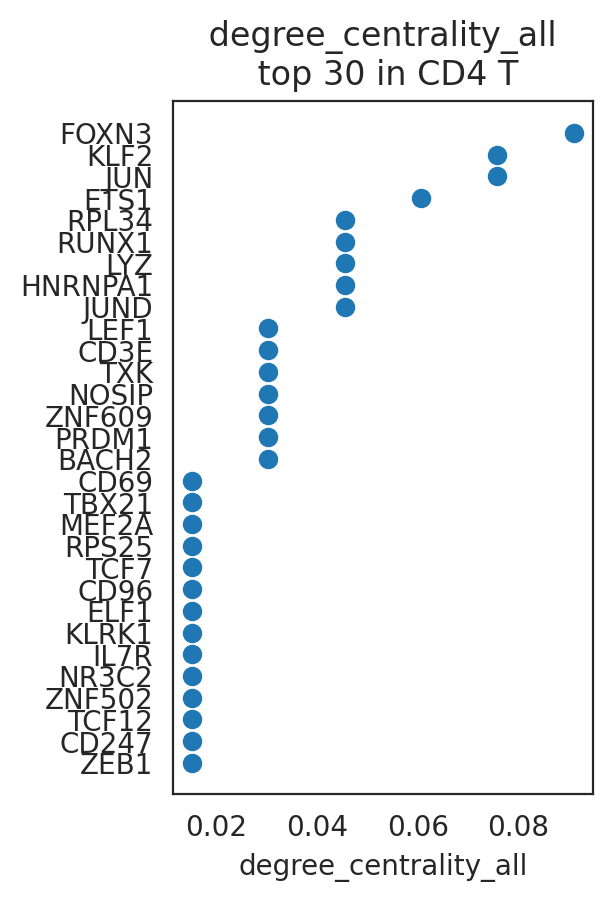

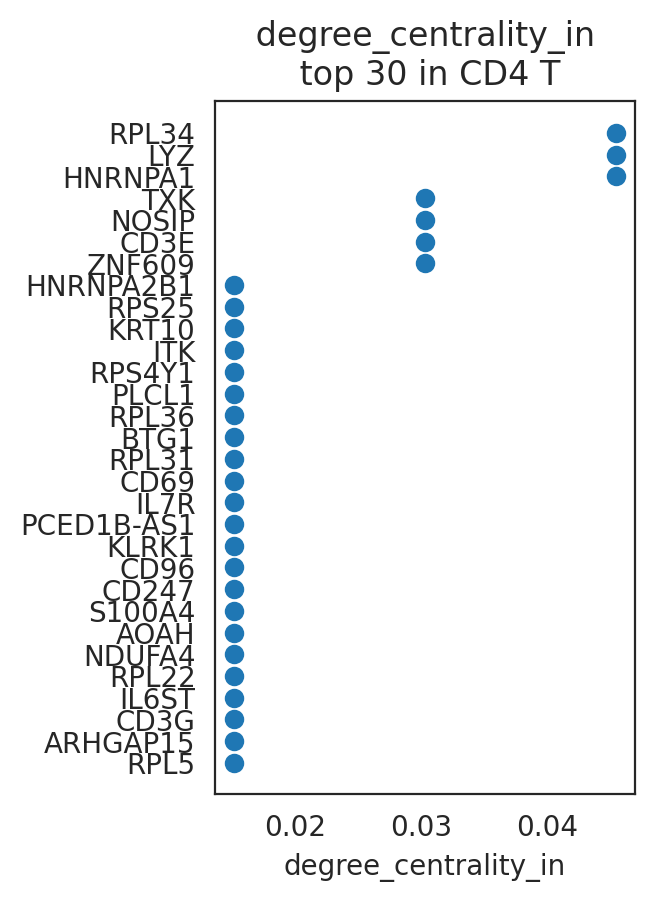

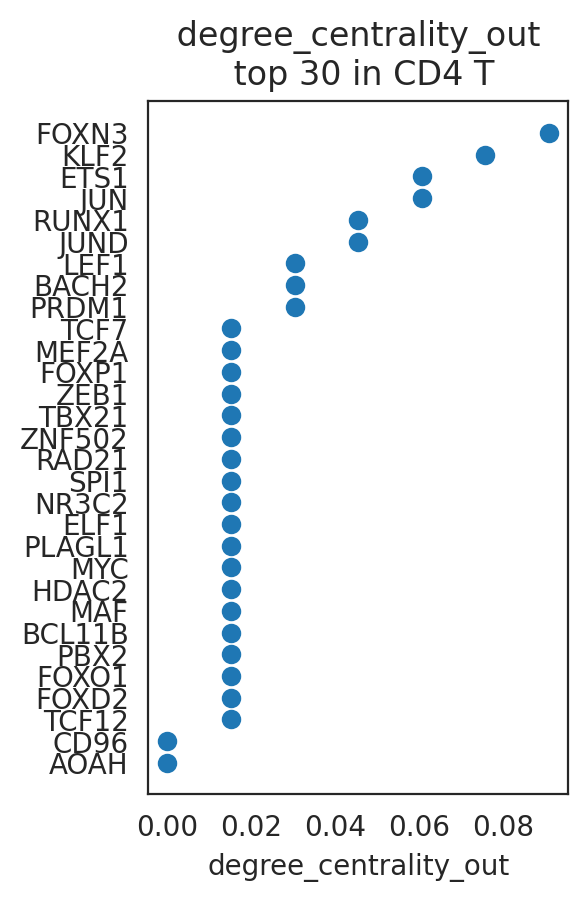

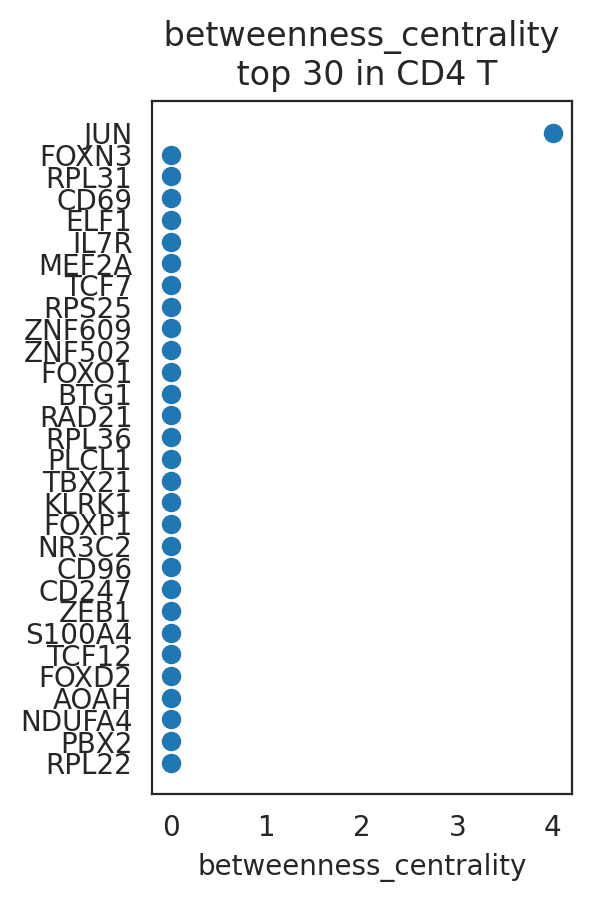

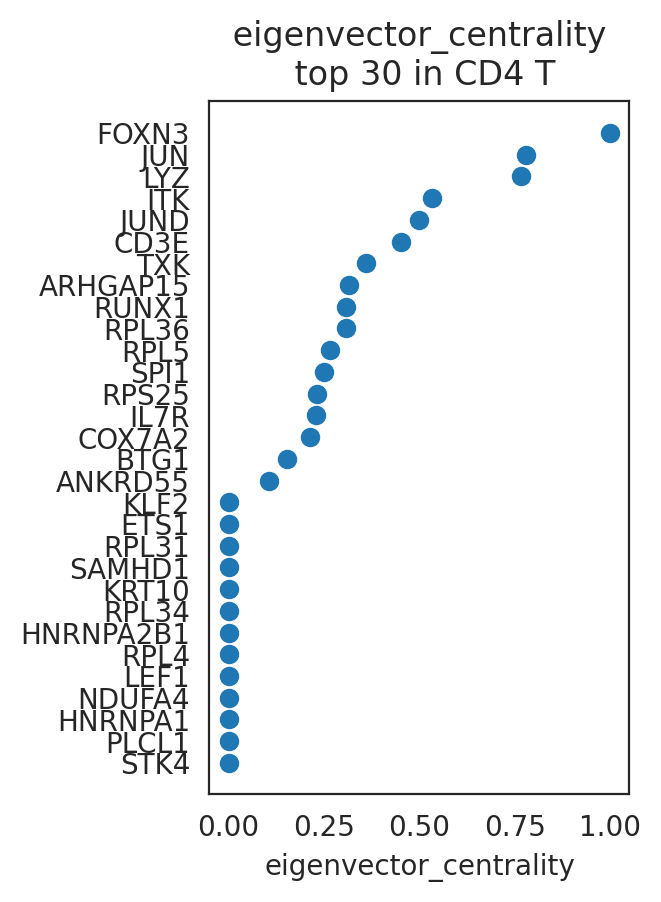

In [46]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="CD4 T", n_gene=30,save=f"{save_folder}/ranked_score")

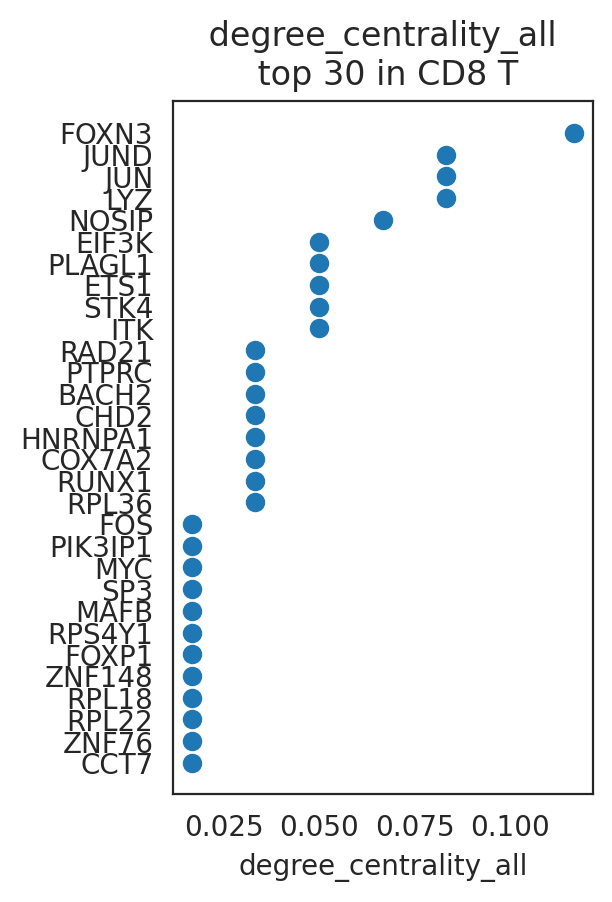

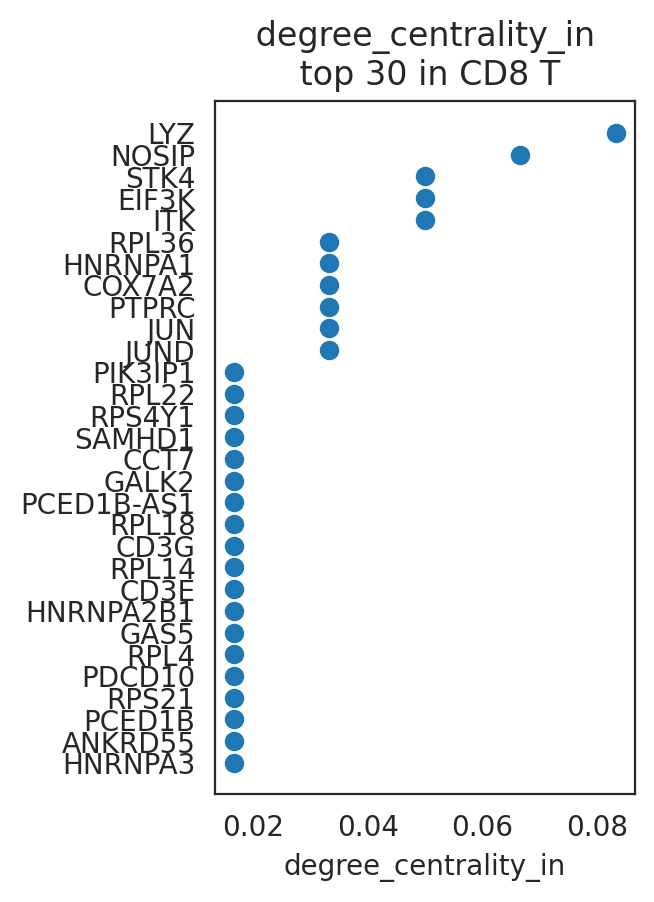

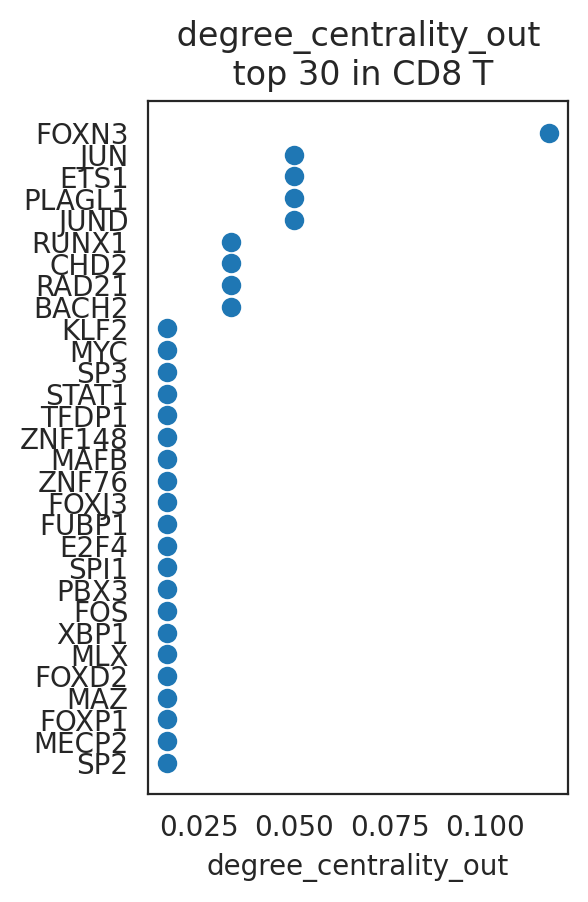

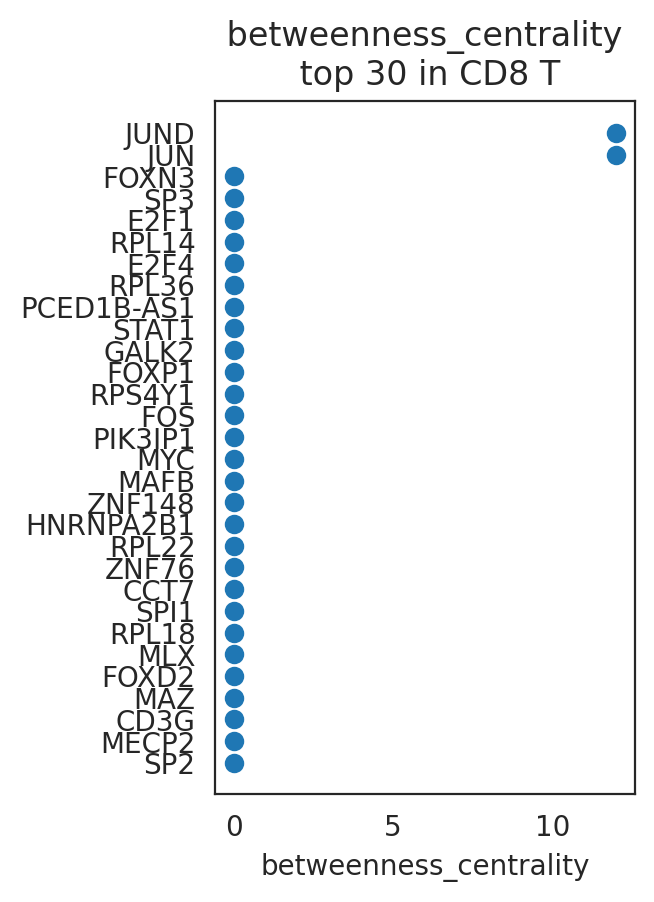

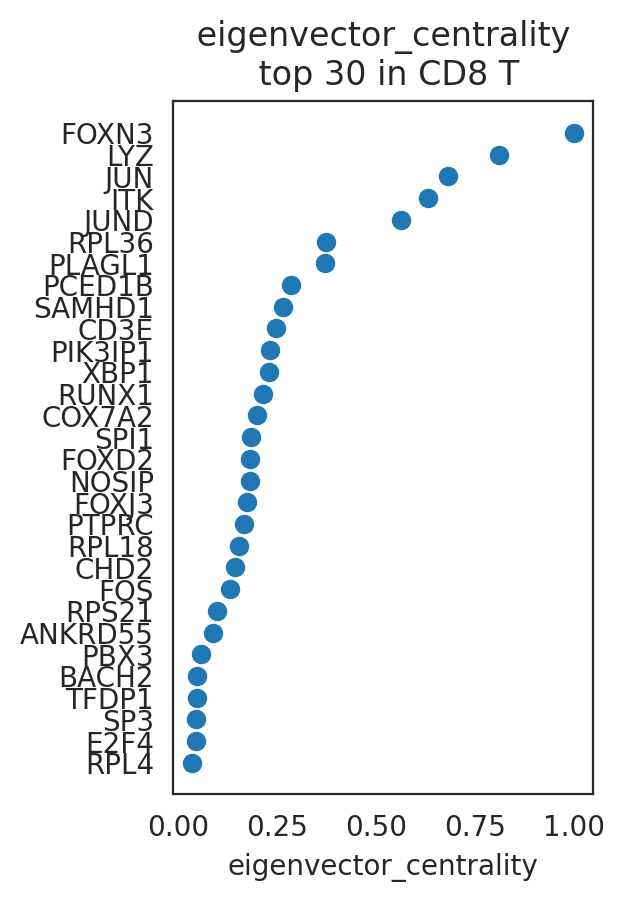

In [47]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="CD8 T", n_gene=30,save=f"{save_folder}/ranked_score")

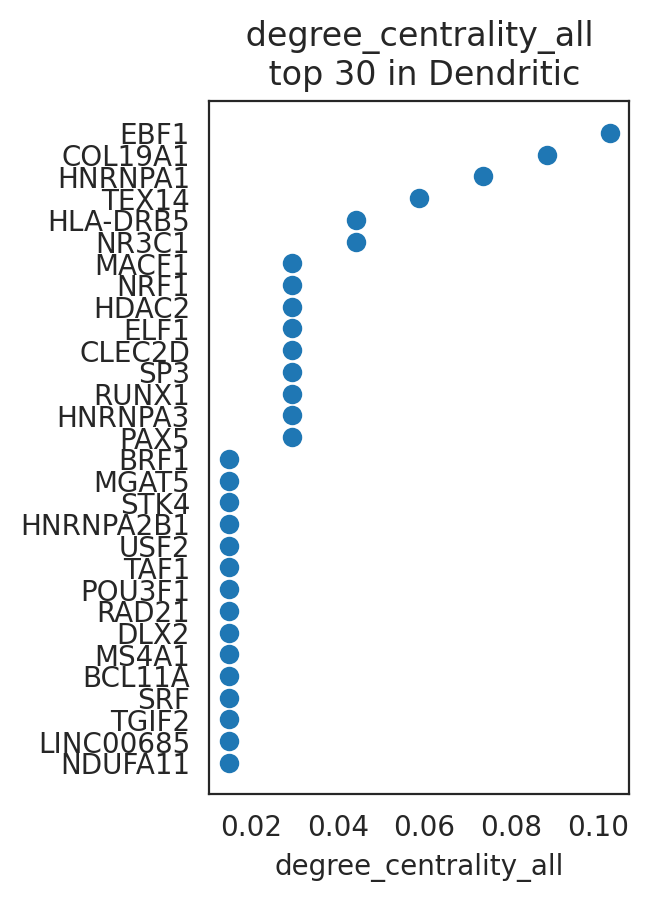

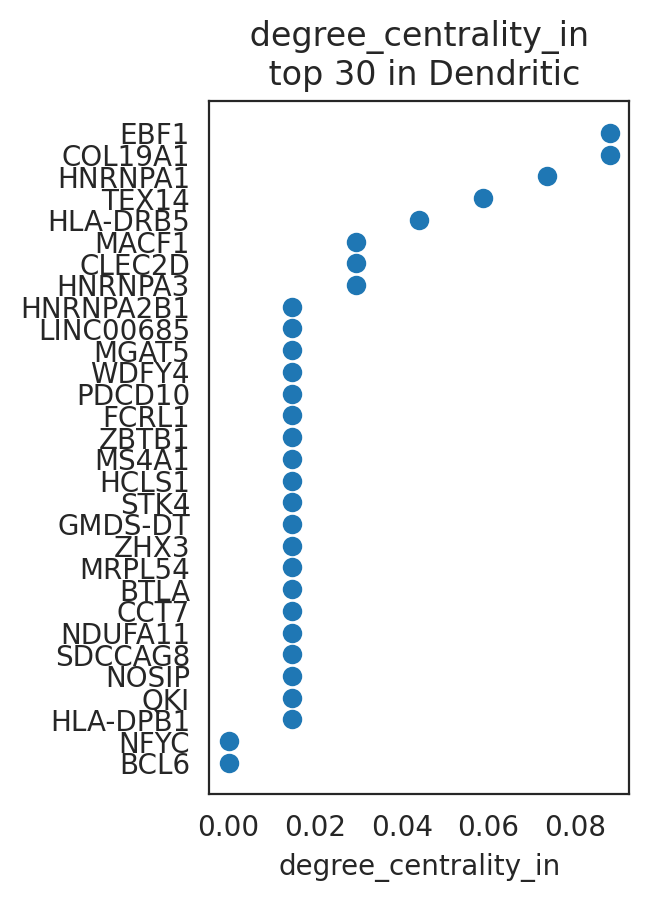

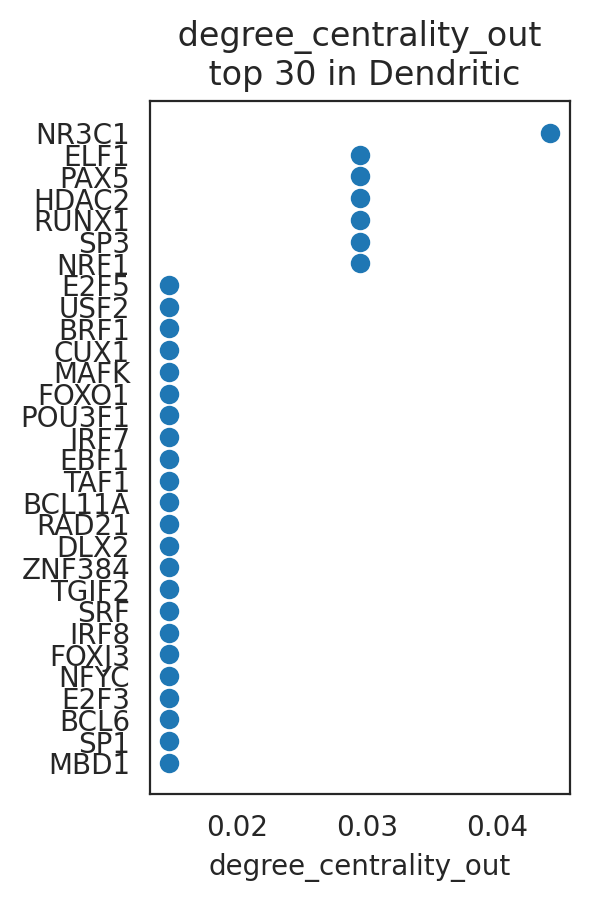

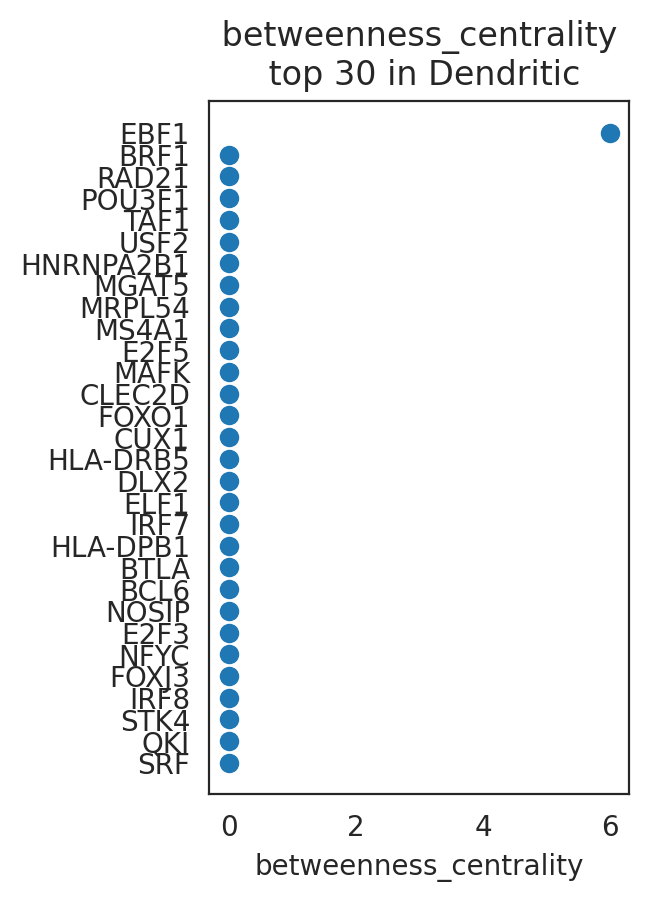

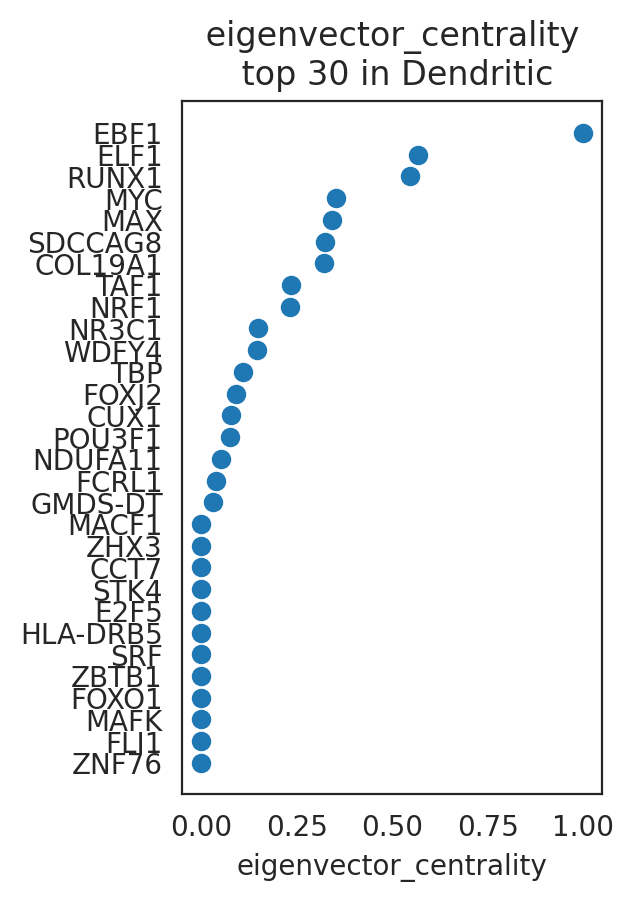

In [48]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="Dendritic", n_gene=30,save=f"{save_folder}/ranked_score")

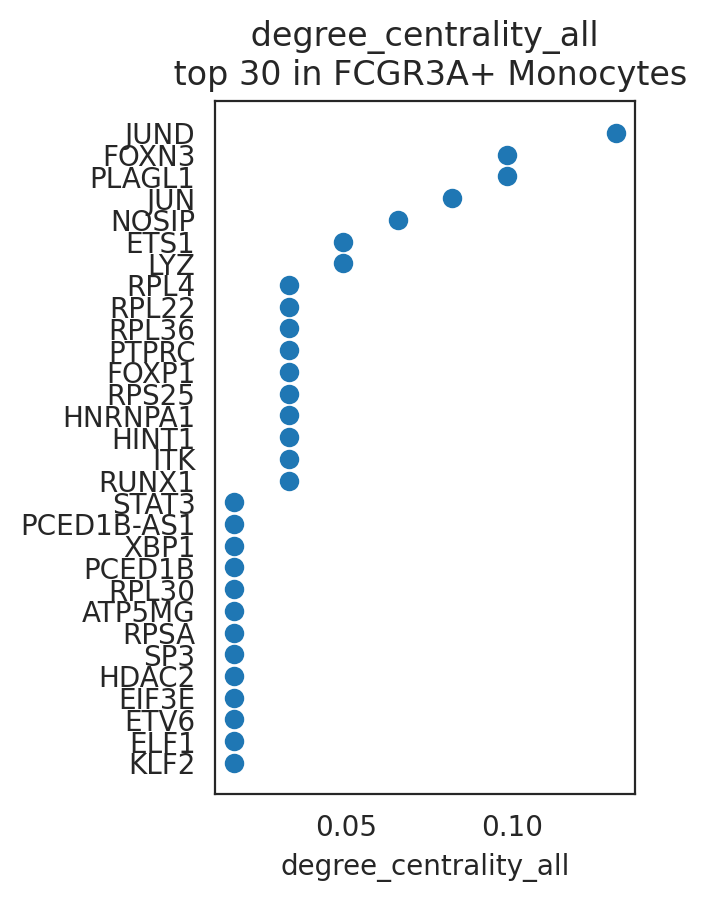

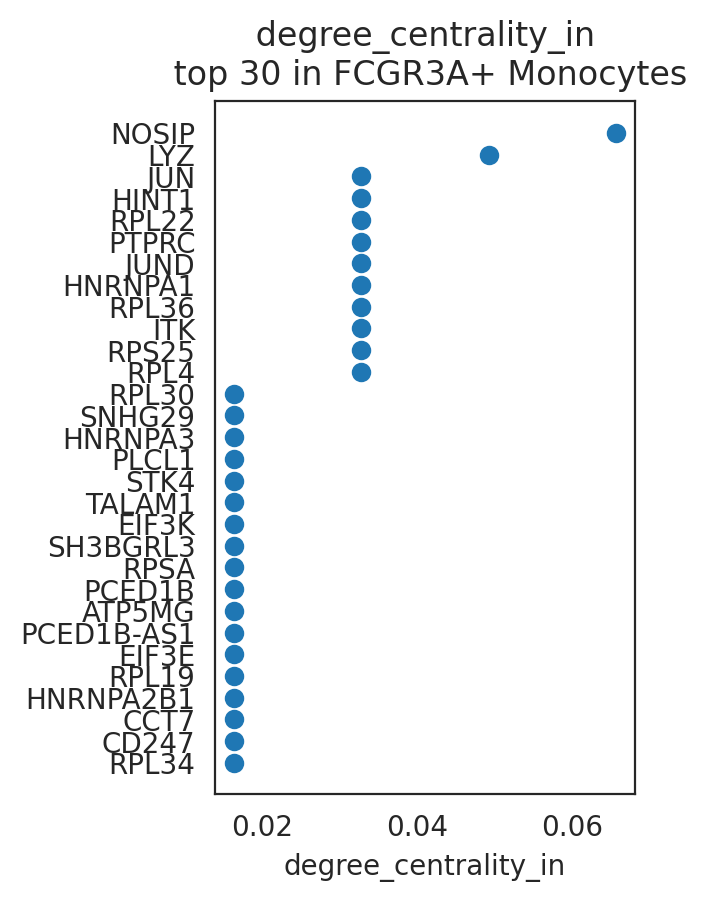

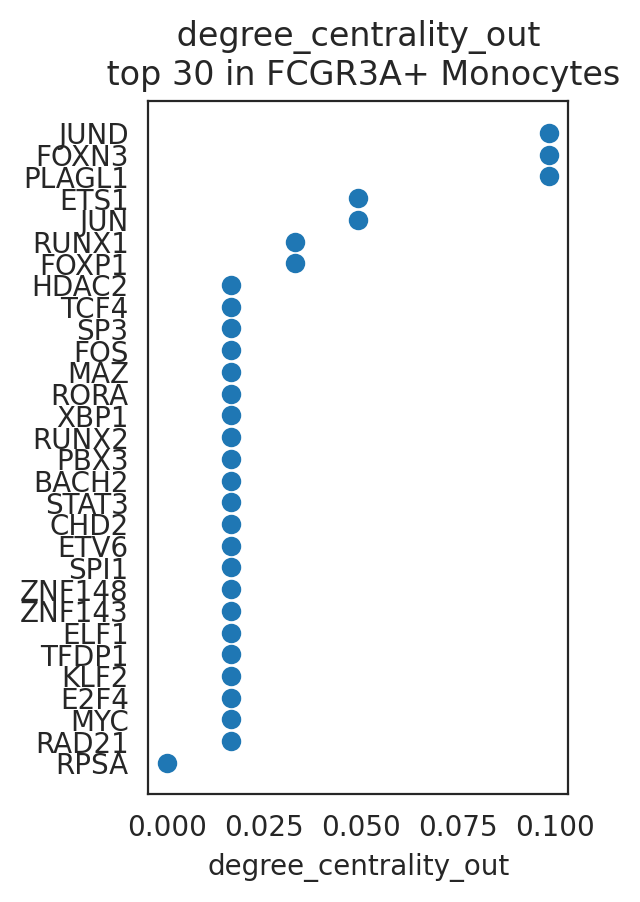

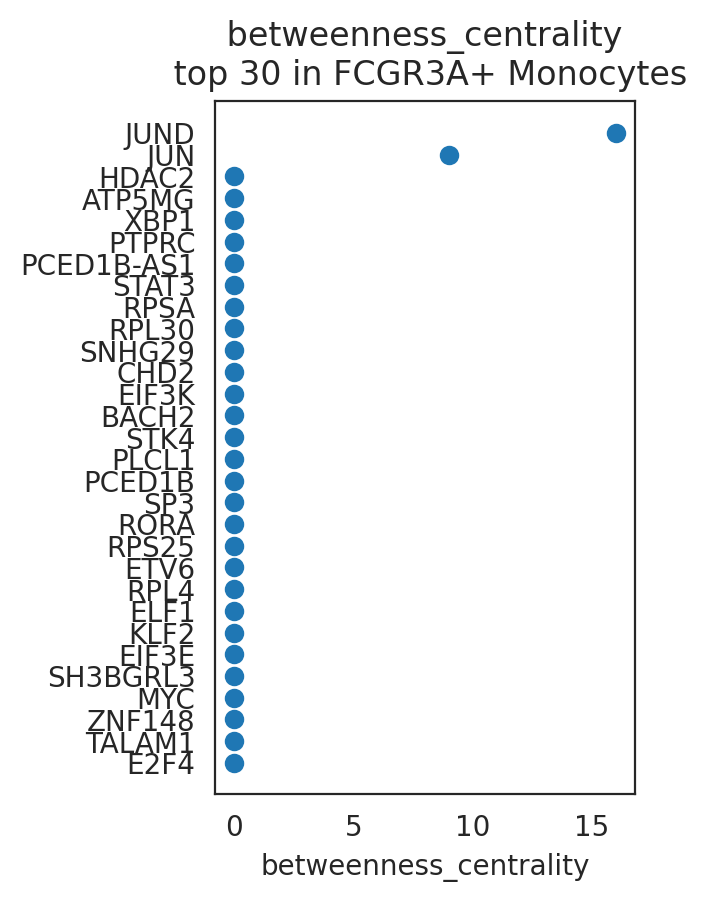

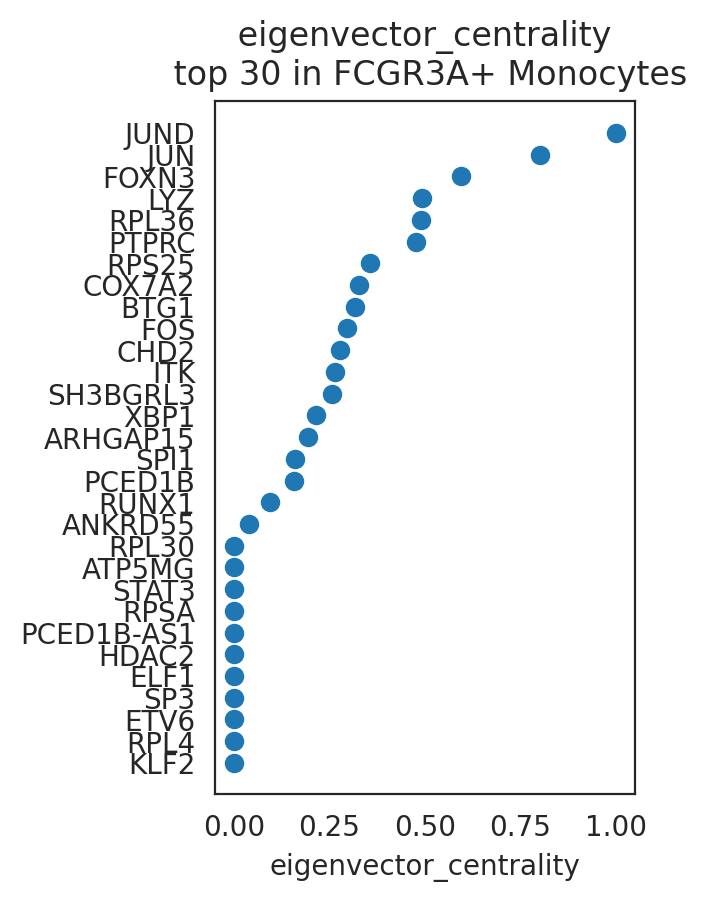

In [49]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="FCGR3A+ Monocytes", n_gene=30,save=f"{save_folder}/ranked_score")

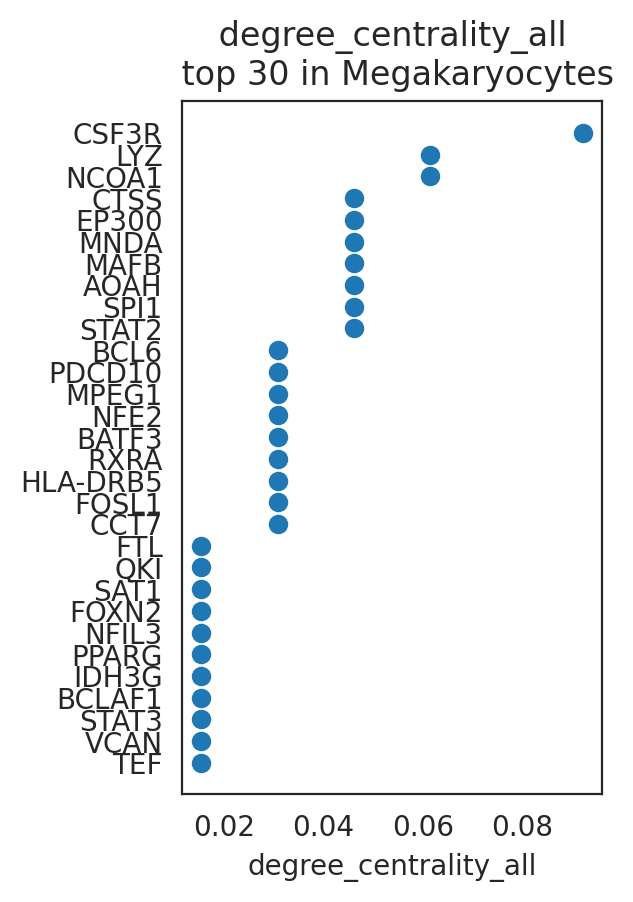

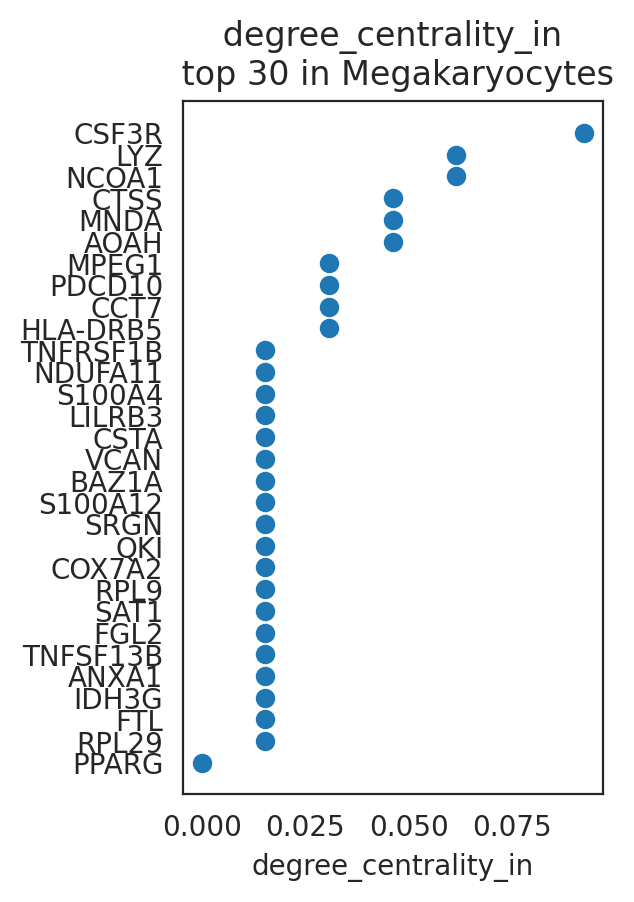

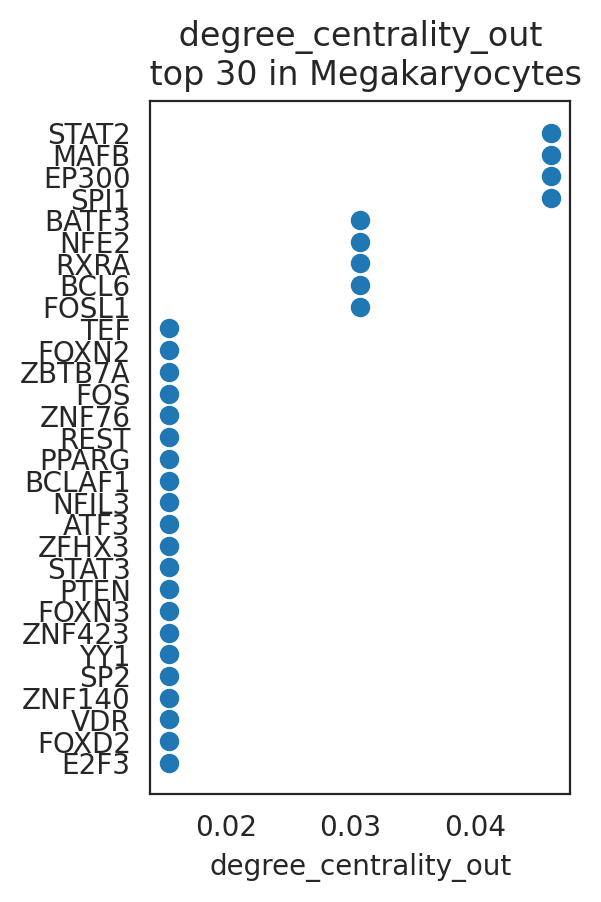

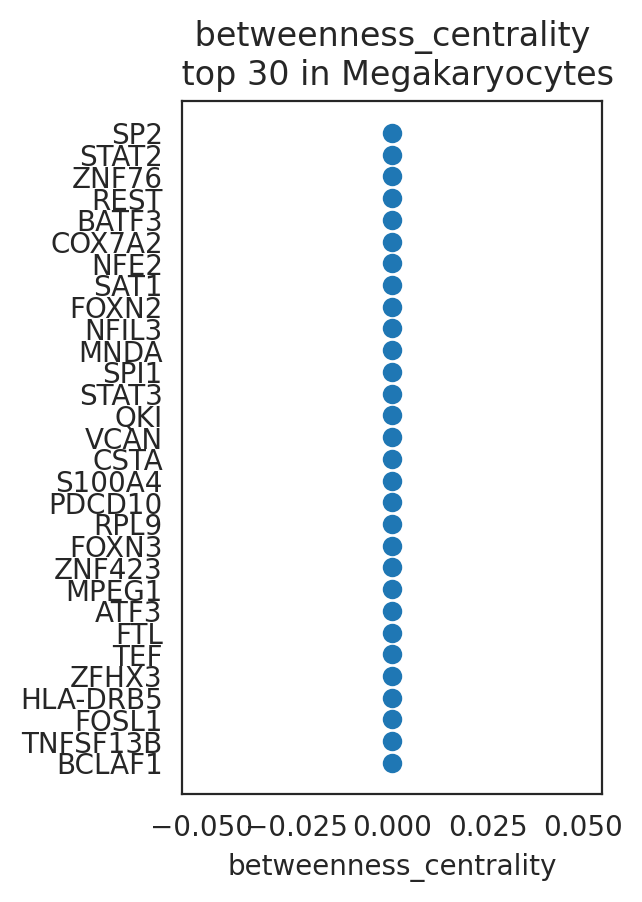

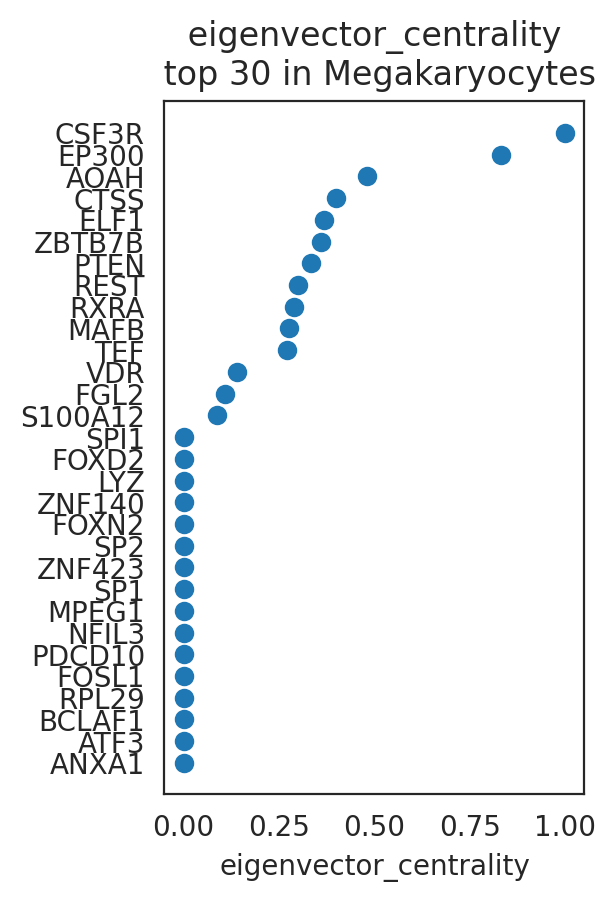

In [50]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="Megakaryocytes", n_gene=30,save=f"{save_folder}/ranked_score")

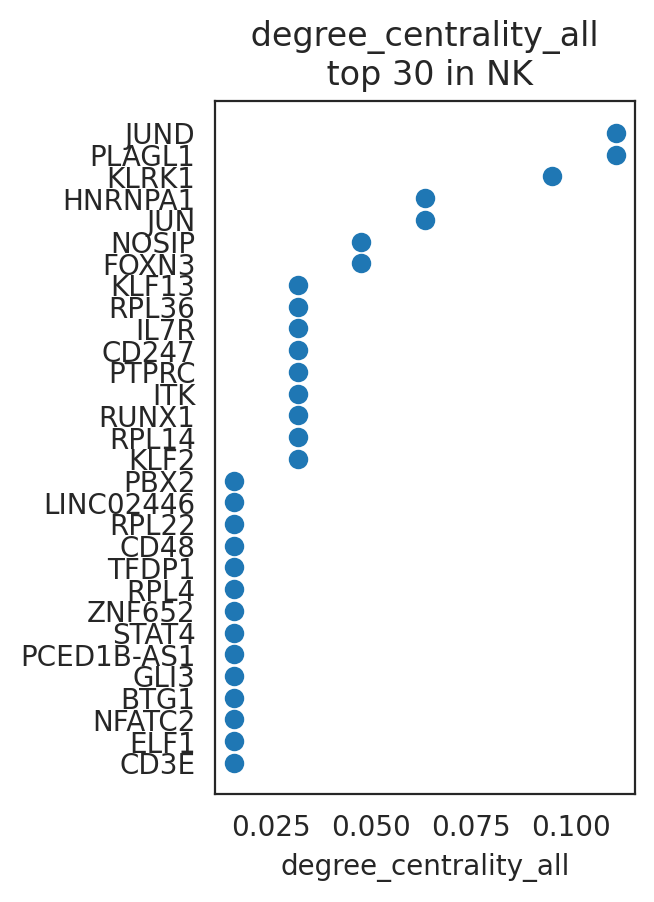

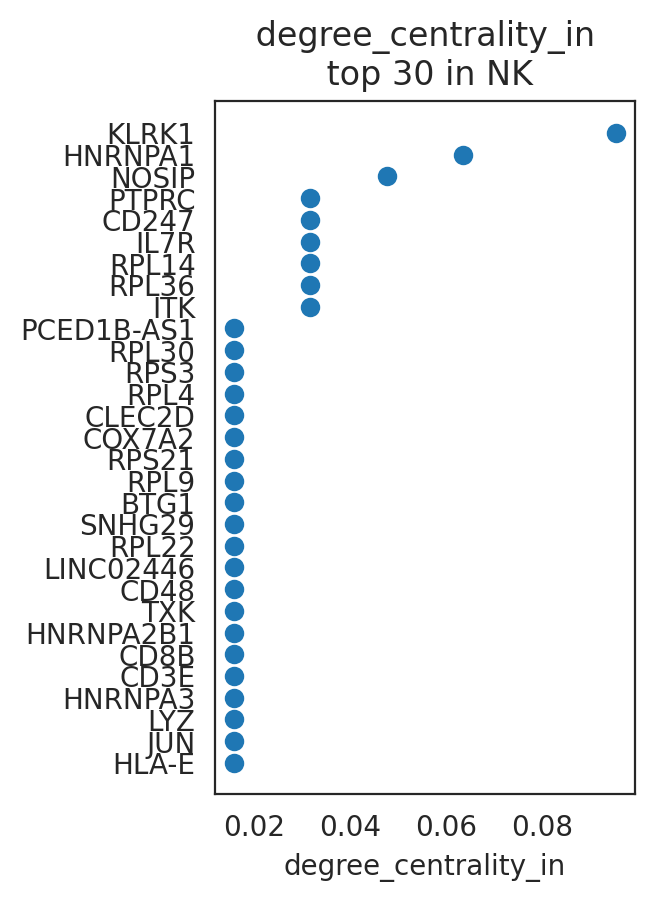

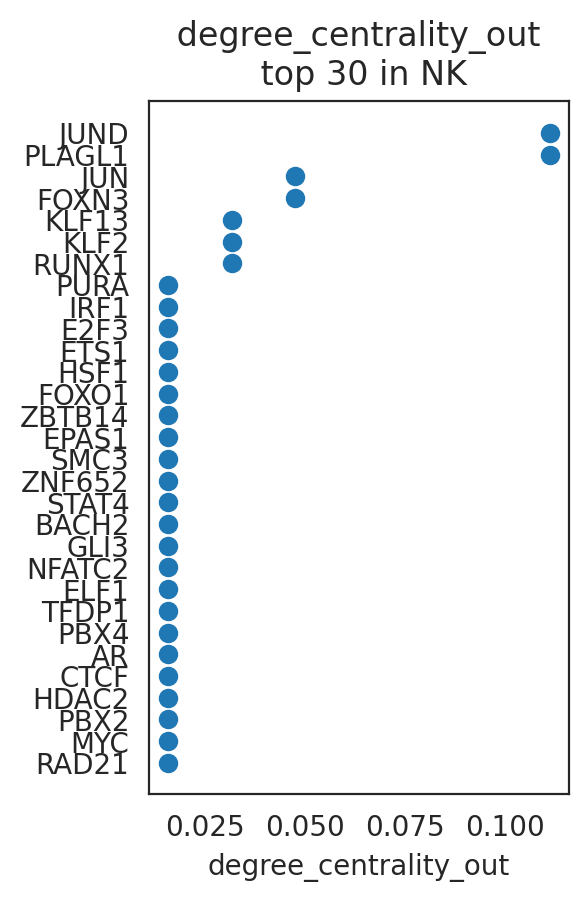

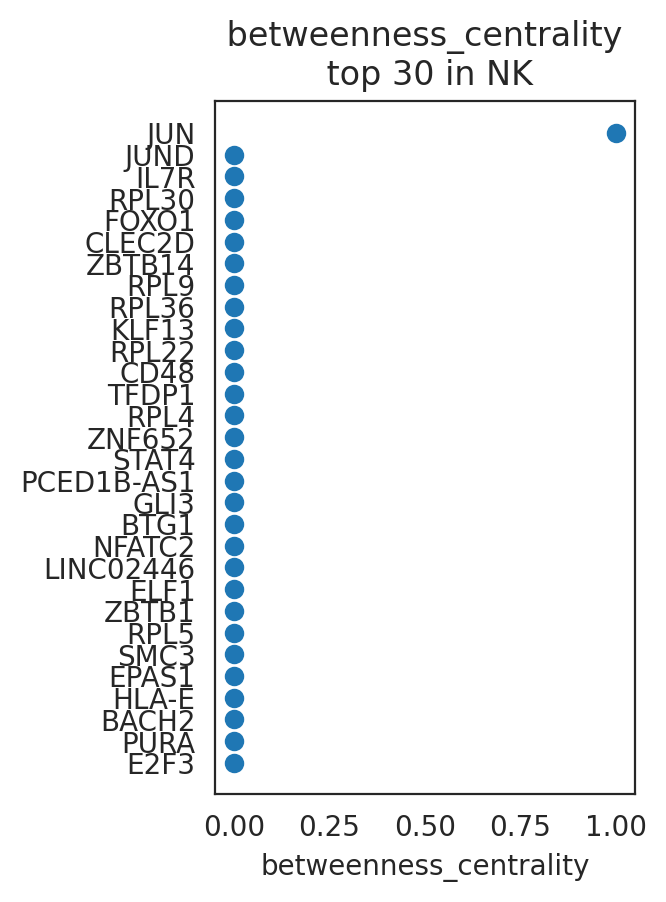

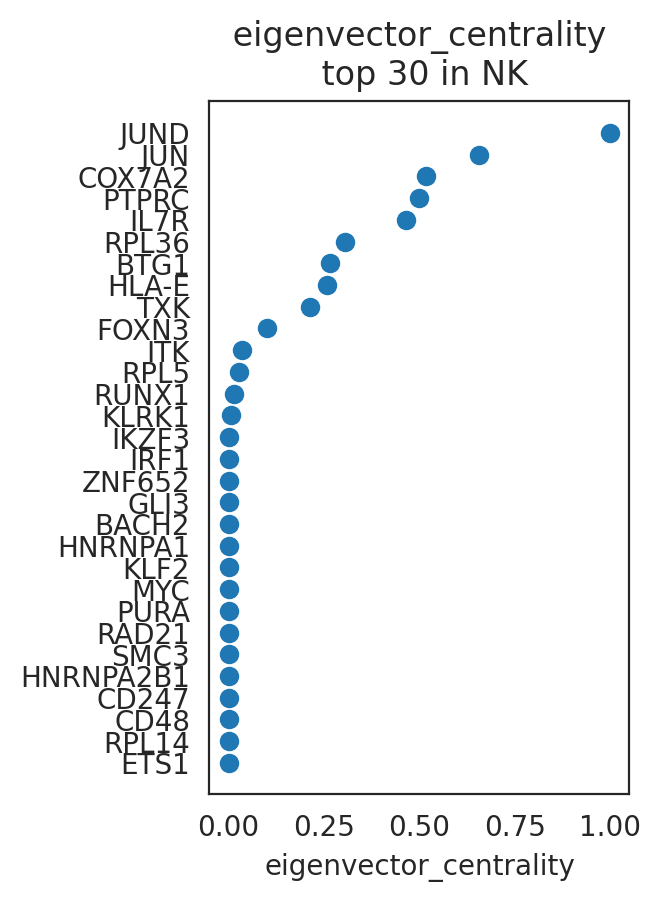

In [51]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="NK", n_gene=30,save=f"{save_folder}/ranked_score")

In [52]:
#filter network edges
links.filter_links(p=0.001, weight="coef_abs", threshold_number=500)

In [53]:
plt.rcParams["figure.figsize"] = [9, 4.5]

B


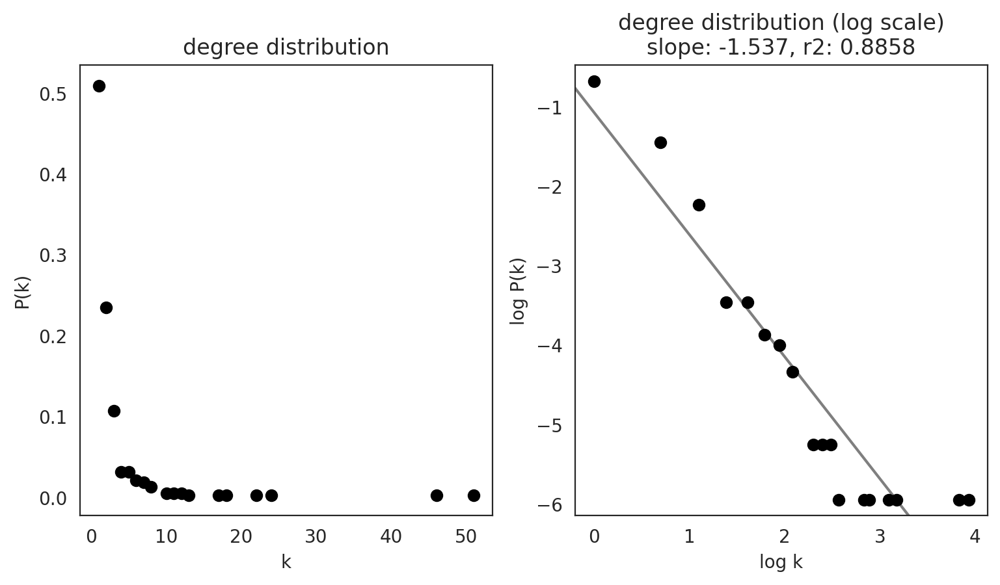

CD14+ Monocytes


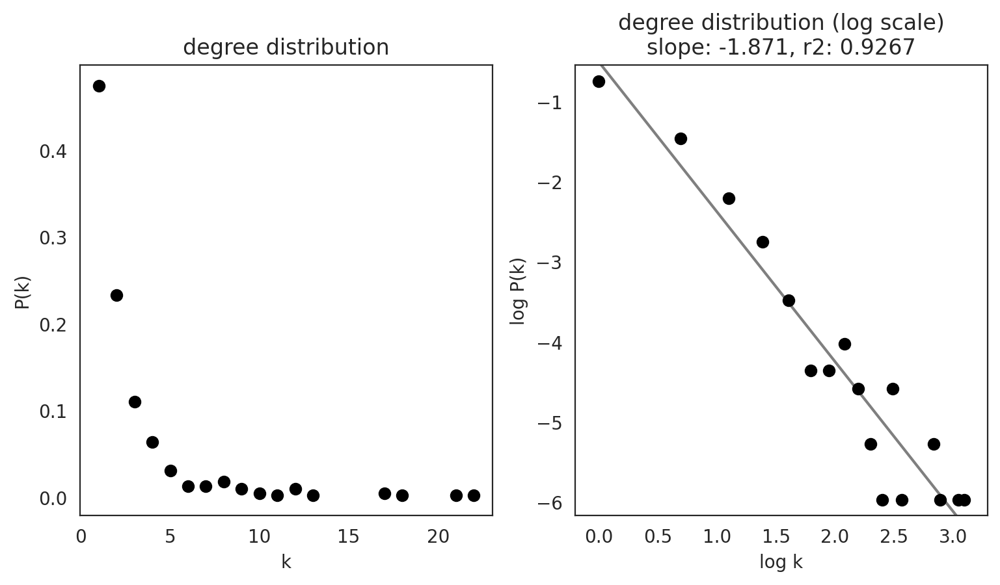

CD4 T


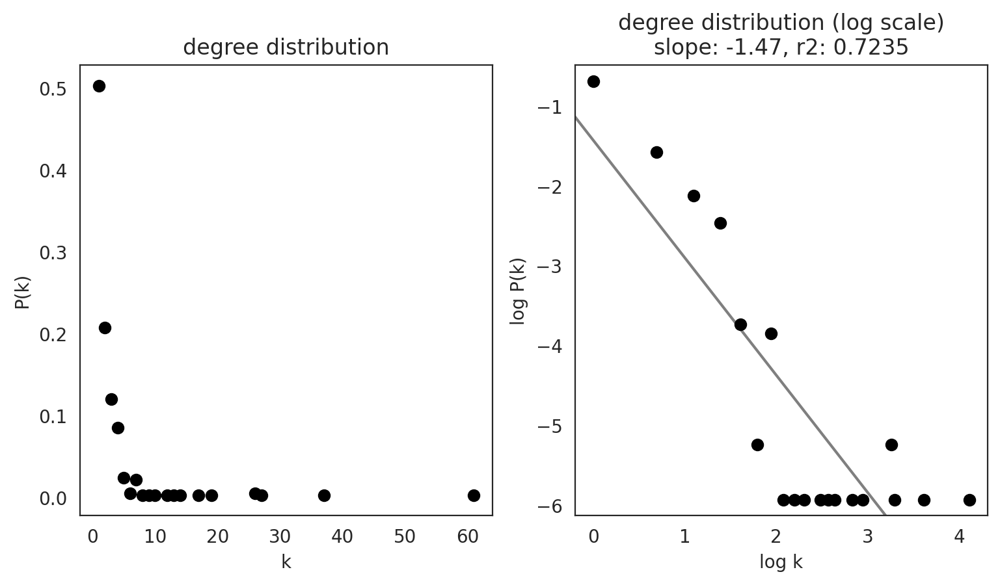

CD8 T


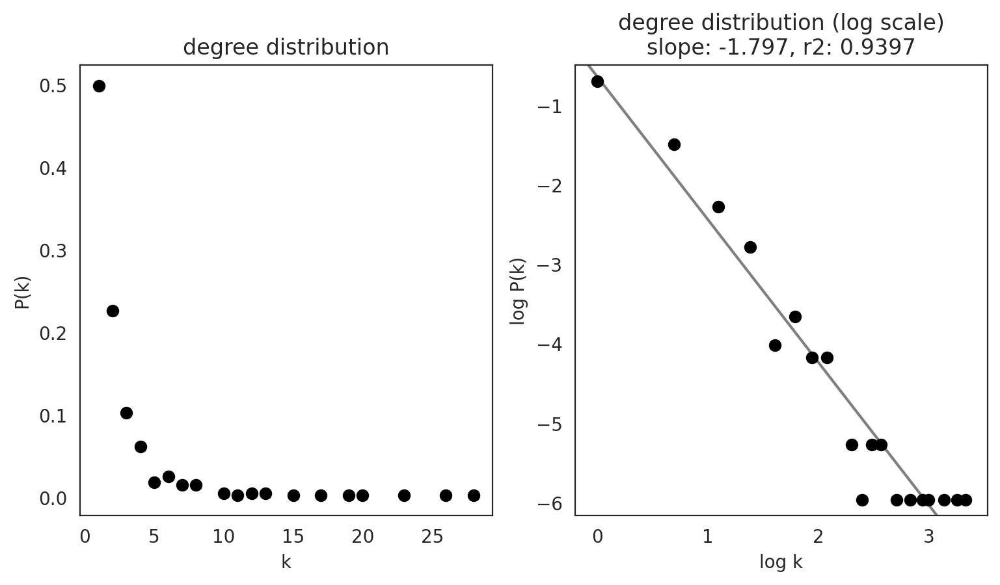

Dendritic


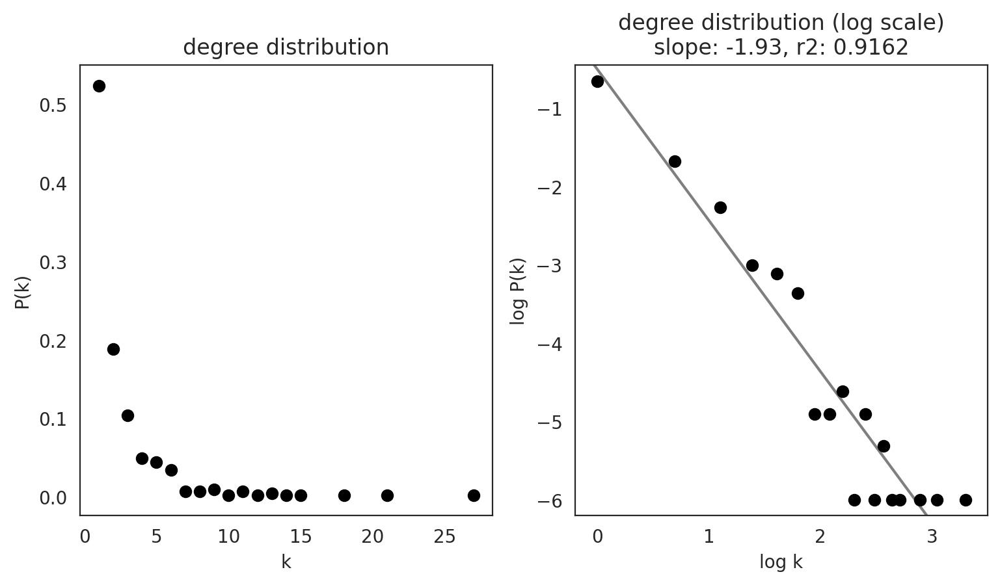

FCGR3A+ Monocytes


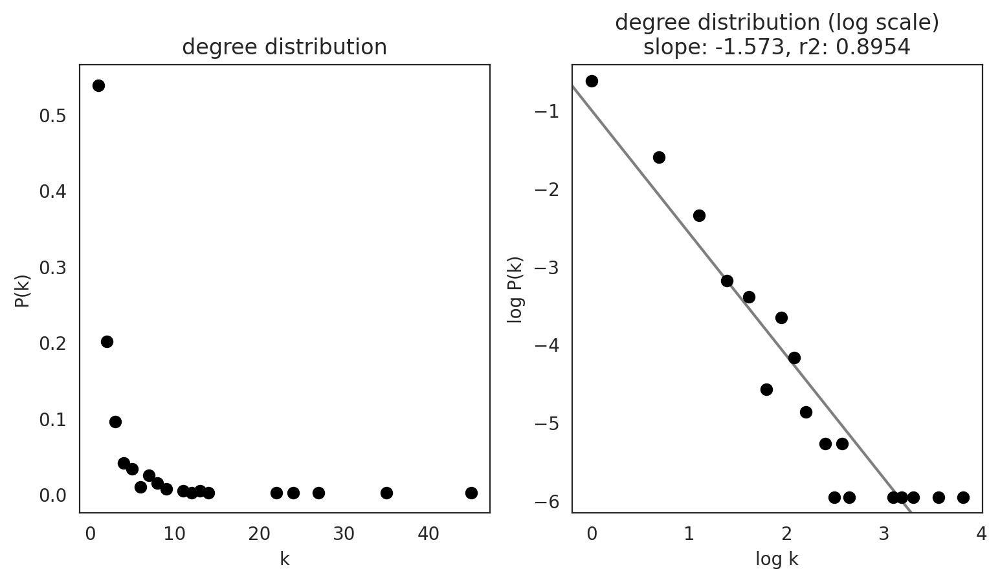

Megakaryocytes


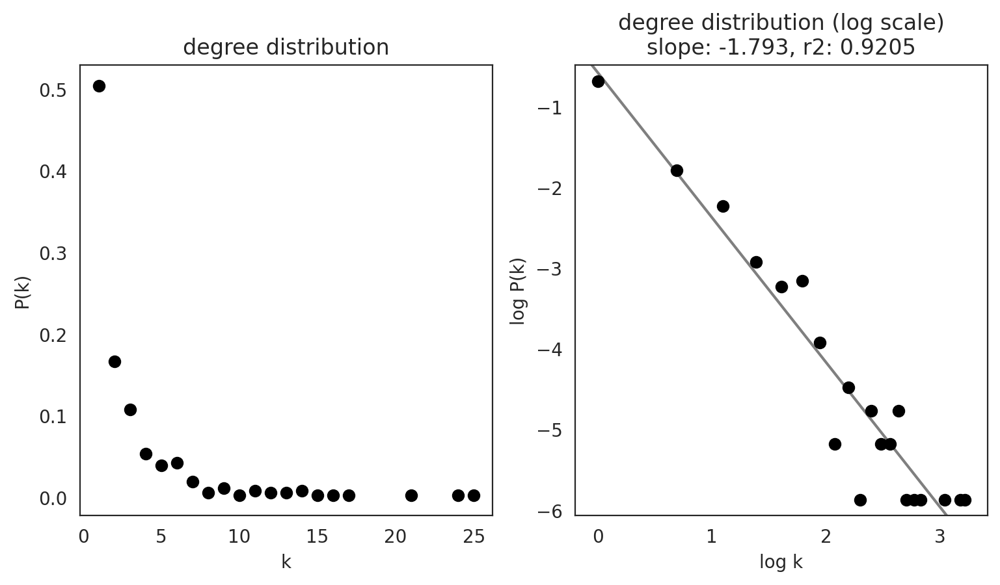

NK


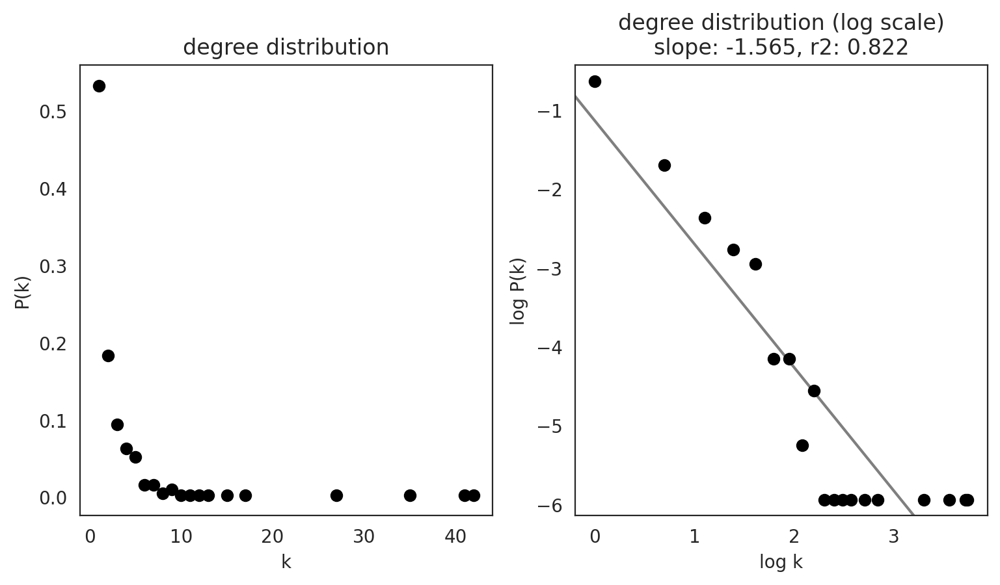

In [54]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [55]:
plt.rcParams["figure.figsize"] = [6, 4.5]

In [56]:
# Calculate network scores.
links.get_network_score()

In [57]:
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
ZBTB16,1,0.002618,0,0.000000,1,0.002618,0.0,0.001902,B
AOAH,12,0.031414,12,0.031414,0,0.000000,0.0,0.004819,B
NR2C2,4,0.010471,0,0.000000,4,0.010471,0.0,0.003793,B
GZMK,17,0.044503,17,0.044503,0,0.000000,0.0,0.009602,B
RFX7,2,0.005236,0,0.000000,2,0.005236,0.0,0.003285,B


In [58]:
links.filtered_links['B']

,source,target,coef_mean,coef_abs,p,-logp
91139,ZBTB16,AOAH,0.159514,0.159514,1.212914e-15,14.916170
754957,NR2C2,GZMK,-0.112891,0.112891,5.309980e-15,14.274907
754962,RFX7,GZMK,0.109853,0.109853,1.147424e-12,11.940276
278322,MYBL1,CCL5,0.101809,0.101809,1.975637e-15,14.704293
91119,IRF3,AOAH,0.094439,0.094439,4.002778e-13,12.397638
...,...,...,...,...,...,...
408875,JUND,CSDE1,0.037037,0.037037,6.292804e-14,13.201156
1203628,YY1,NDUFB9,0.036948,0.036948,9.418961e-09,8.025997
1378690,STAT3,PLCL1,0.036946,0.036946,1.537745e-12,11.813116
835142,RXRA,IL7R,-0.036935,0.036935,1.820573e-09,8.739792


In [59]:
links.filtered_links['CD14+ Monocytes']

,source,target,coef_mean,coef_abs,p,-logp
913797,MXI1,KLRF1,-0.102985,0.102985,1.700711e-17,16.769369
291175,HOXB2,CD3E,-0.076196,0.076196,1.337445e-14,13.873724
788869,HDAC2,HNRNPA3,0.073350,0.073350,8.001360e-07,6.096836
1200344,TFDP1,NDUFA11,0.067556,0.067556,1.278647e-11,10.893249
291193,FOXO4,CD3E,0.066402,0.066402,3.148035e-07,6.501960
...,...,...,...,...,...,...
1255237,MEF2B,NSMCE2,0.026488,0.026488,1.084904e-12,11.964609
835184,IKZF3,IL7R,-0.026480,0.026480,3.446620e-10,9.462607
818363,USF2,IFITM1,0.026475,0.026475,1.044591e-10,9.981054
1718070,MYBL1,SLIRP,0.026470,0.026470,3.479234e-08,7.458516


In [60]:
links.filtered_links['CD4 T']

,source,target,coef_mean,coef_abs,p,-logp
859700,FOXN3,ITK,0.124736,0.124736,4.924499e-15,14.307638
869425,JUND,JUN,0.108271,0.108271,1.208057e-14,13.917912
391321,JUND,COX7A2,0.099604,0.099604,7.454121e-13,12.127604
1052054,MAF,MACF1,0.096656,0.096656,8.546000e-15,14.068237
1573638,LEF1,RPL34,0.093574,0.093574,7.720245e-10,9.112369
...,...,...,...,...,...,...
1828839,ZNF148,TALAM1,0.036009,0.036009,9.522326e-09,8.021257
13178,KLF2,ABRACL,0.036004,0.036004,4.056087e-10,9.391893
992027,NR3C2,LINC01934,0.035985,0.035985,4.548148e-12,11.342165
201517,ETS1,BTF3,0.035984,0.035984,8.800473e-12,11.055494


In [61]:
links.filtered_links['CD8 T']

,source,target,coef_mean,coef_abs,p,-logp
859700,FOXN3,ITK,0.118932,0.118932,9.968288e-13,12.001379
869425,JUND,JUN,0.113526,0.113526,5.996700e-12,11.222088
788869,HDAC2,HNRNPA3,0.109264,0.109264,5.299138e-09,8.275795
85170,RUNX1,ANKRD55,0.093129,0.093129,3.982443e-13,12.399850
1050394,FOXN3,LYZ,-0.088309,0.088309,4.972541e-12,11.303422
...,...,...,...,...,...,...
213007,KLF6,C19orf53,0.030924,0.030924,2.131383e-11,10.671338
1571624,SP3,RPL22,0.030908,0.030908,2.876188e-09,8.541183
1571074,JUN,RPL17,0.030888,0.030888,4.881150e-11,10.311478
1317730,MECP2,PCED1B,0.030877,0.030877,2.129081e-11,10.671808


In [62]:
links.filtered_links['Dendritic']

,source,target,coef_mean,coef_abs,p,-logp
520411,ELF1,EBF1,0.085608,0.085608,1.705935e-11,10.768038
788868,PAX5,HNRNPA3,0.084473,0.084473,9.300322e-08,7.031502
520388,RUNX1,EBF1,0.072327,0.072327,4.949505e-12,11.305438
377906,NR3C1,COL19A1,0.065847,0.065847,1.393131e-11,10.856008
1858167,SP3,TEX14,0.065110,0.065110,1.721270e-11,10.764151
...,...,...,...,...,...,...
895300,THRB,KIAA0825,0.021451,0.021451,3.583914e-13,12.445642
501311,CTCF,DPH6,0.021451,0.021451,4.918451e-15,14.308172
1895477,PAX5,TMEM156,0.021449,0.021449,3.185143e-14,13.496871
1311637,ZNF148,PAX5,0.021437,0.021437,1.002993e-10,9.998702


In [63]:
links.filtered_links['FCGR3A+ Monocytes']

,source,target,coef_mean,coef_abs,p,-logp
788869,HDAC2,HNRNPA3,0.133992,0.133992,1.760168e-12,11.754446
288611,ETS1,CD247,0.132644,0.132644,1.066309e-16,15.972117
85170,RUNX1,ANKRD55,0.100355,0.100355,2.406478e-13,12.618618
859700,FOXN3,ITK,0.095732,0.095732,7.024330e-10,9.153395
777704,PLAGL1,HINT1,-0.089874,0.089874,1.119074e-15,14.951141
...,...,...,...,...,...,...
121414,MAZ,ARL6IP4,0.036058,0.036058,3.293388e-15,14.482357
1869527,POU2F2,THOC7,-0.036051,0.036051,1.780940e-09,8.749351
833589,MAZ,IL2RG,0.036041,0.036041,1.649500e-14,13.782648
665760,ITGB2,FXYD5,0.036020,0.036020,4.335996e-12,11.362911


In [64]:
links.filtered_links['Megakaryocytes']

,source,target,coef_mean,coef_abs,p,-logp
1323890,SP2,PDCD10,0.051175,0.051175,3.159984e-08,7.500315
409706,EP300,CSF3R,0.047979,0.047979,9.063677e-14,13.042696
1050395,FOXD2,LYZ,-0.038019,0.038019,3.388480e-05,4.469995
1323889,SP1,PDCD10,0.037793,0.037793,5.571318e-06,5.254042
91114,MAFB,AOAH,0.037218,0.037218,7.340215e-16,15.134291
...,...,...,...,...,...,...
540129,MITF,EIF3K,0.013631,0.013631,2.374683e-08,7.624394
288618,NFIX,CD247,-0.013630,0.013630,3.763162e-12,11.424447
1621209,AHRR,SDCCAG8,0.013629,0.013629,1.236742e-04,3.907721
1921121,PPARA,TNFRSF1B,0.013628,0.013628,2.108903e-07,6.675943


In [65]:
links.filtered_links['NK']

,source,target,coef_mean,coef_abs,p,-logp
391321,JUND,COX7A2,0.115634,0.115634,1.790358e-18,17.747060
291150,CTCF,CD3E,0.089518,0.089518,4.201258e-16,15.376621
788869,HDAC2,HNRNPA3,0.089340,0.089340,5.600546e-11,10.251770
1237921,PLAGL1,NOSIP,-0.088479,0.088479,2.011118e-10,9.696563
1050400,PLAGL1,LYZ,0.087044,0.087044,1.949387e-13,12.710102
...,...,...,...,...,...,...
1574777,ELK1,RPL4,0.033749,0.033749,1.529513e-09,8.815447
1457167,IRF3,PSMB9,0.033727,0.033727,2.456055e-10,9.609762
1362368,HDAC2,PIK3IP1,0.033714,0.033714,6.680403e-14,13.175197
637792,RUNX2,FHIT,-0.033712,0.033712,1.380537e-10,9.859952


In [66]:
# Check cluster name
links.cluster

['B',
 'CD14+ Monocytes',
 'CD4 T',
 'CD8 T',
 'Dendritic',
 'FCGR3A+ Monocytes',
 'Megakaryocytes',
 'NK']

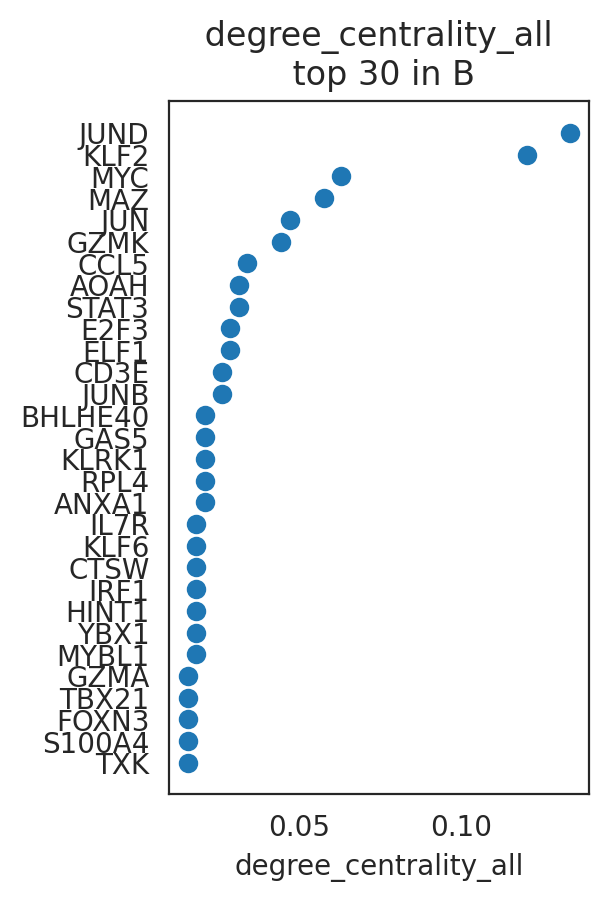

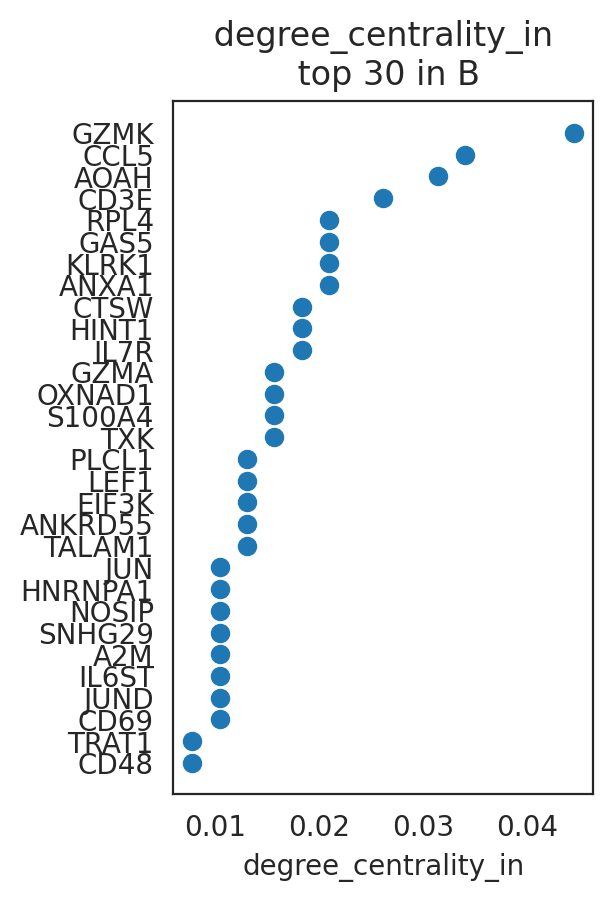

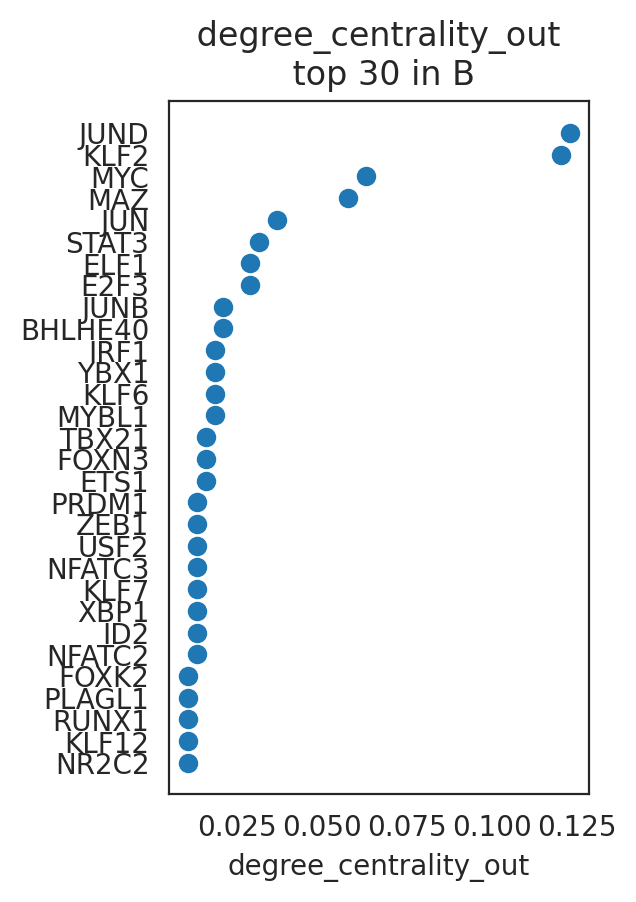

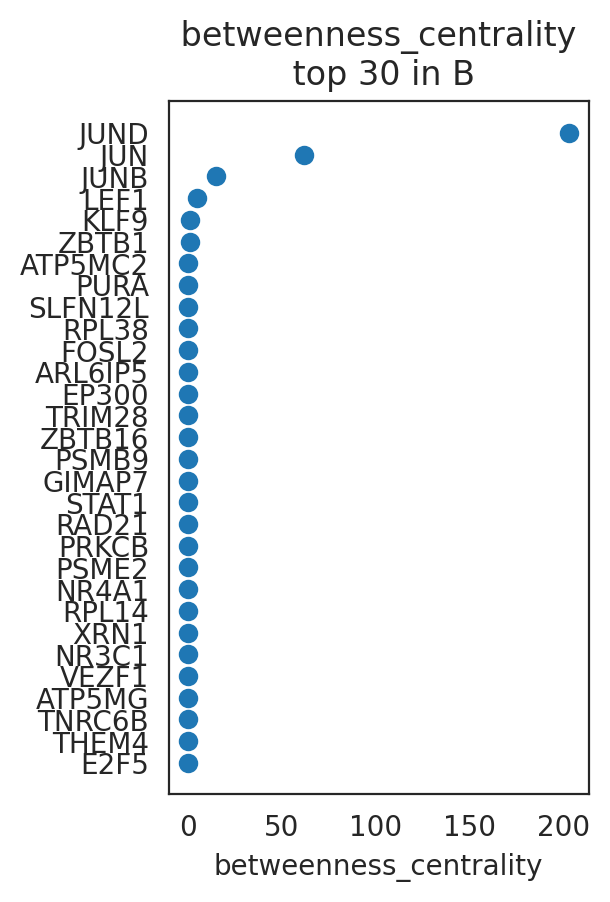

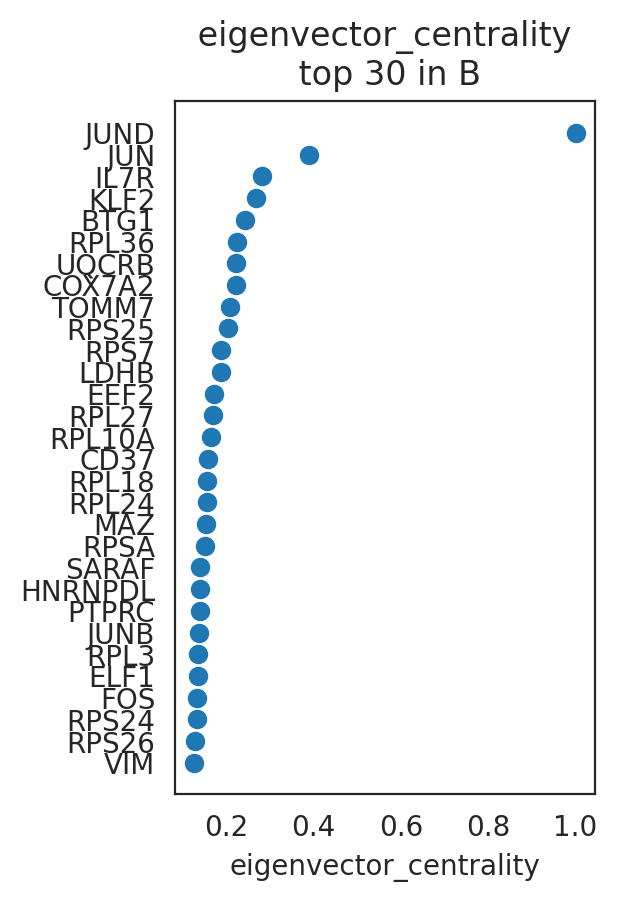

In [67]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="B", n_gene=30,save=f"{save_folder}/ranked_score")

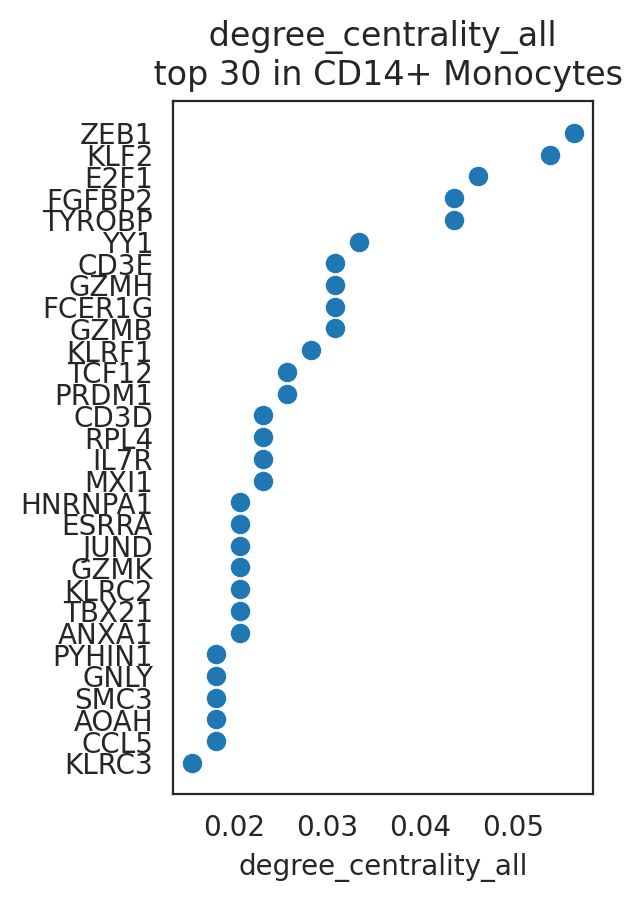

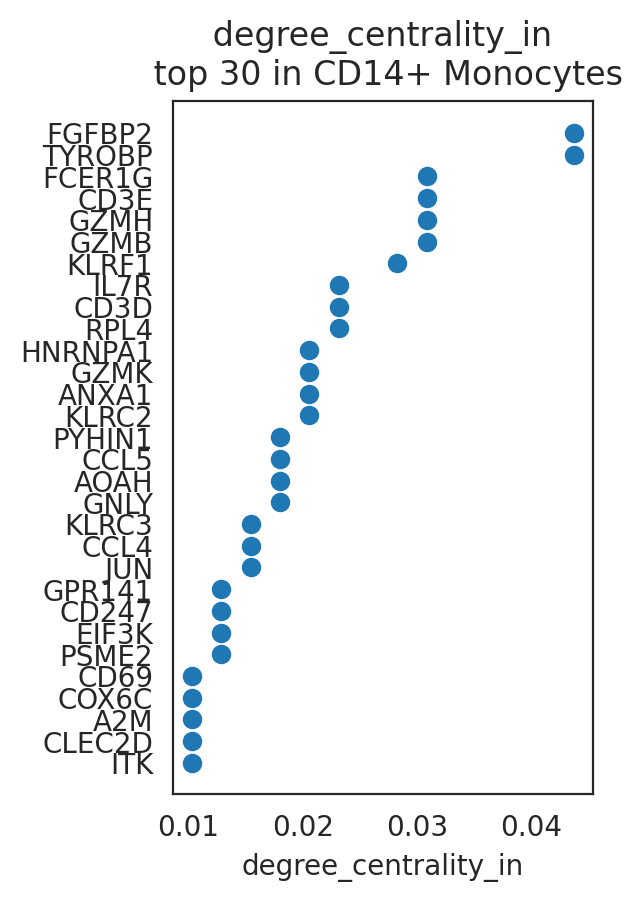

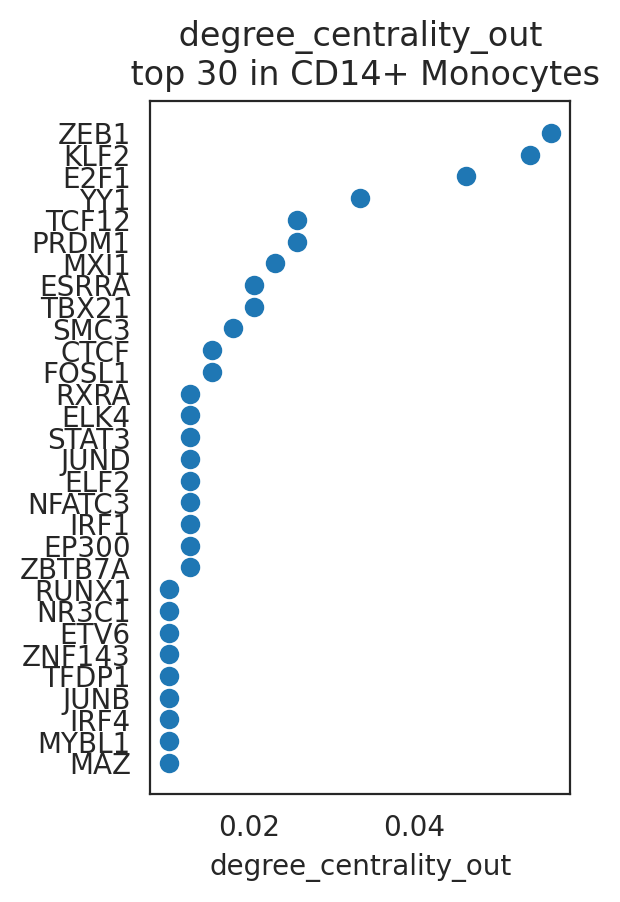

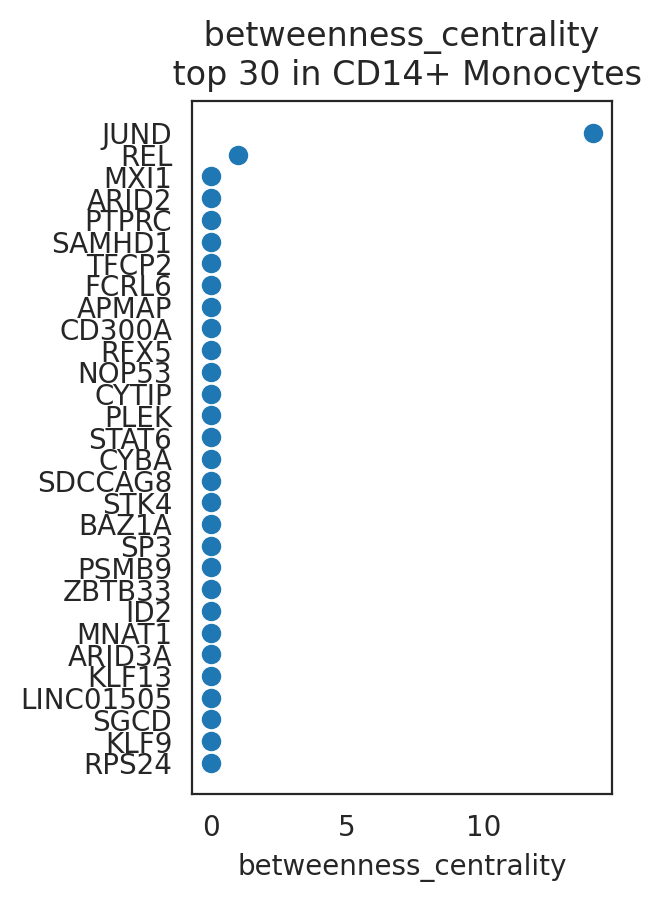

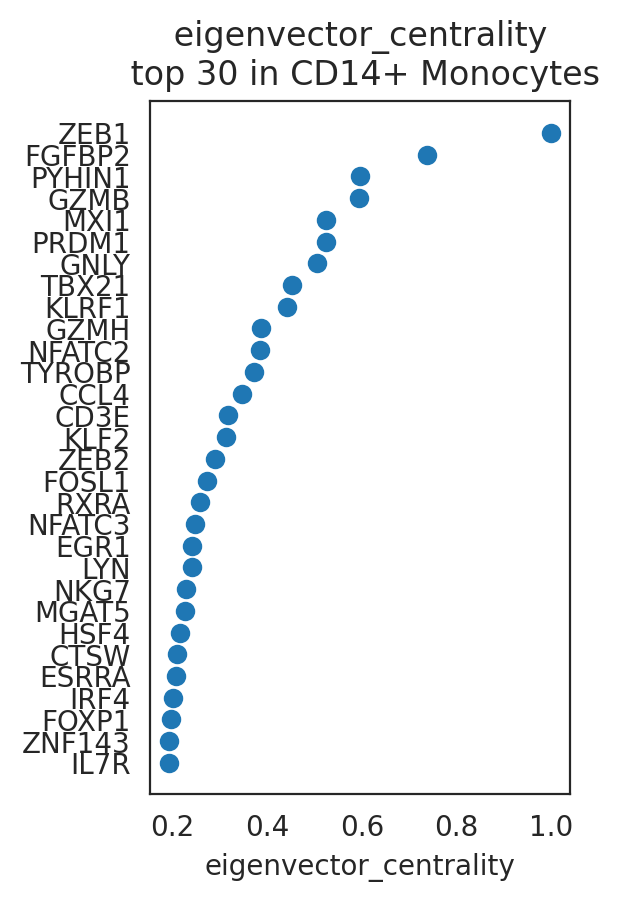

In [68]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="CD14+ Monocytes", n_gene=30,save=f"{save_folder}/ranked_score")

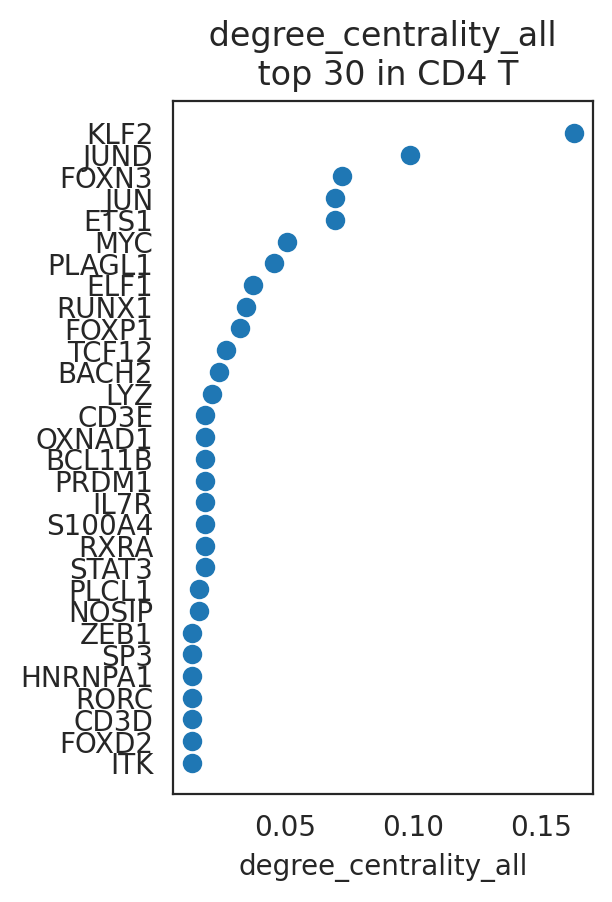

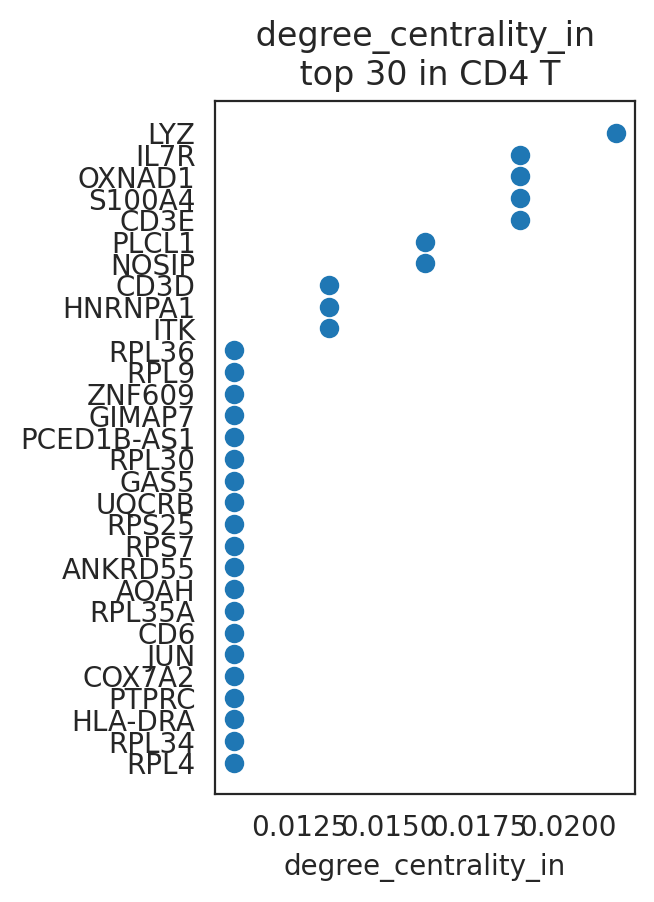

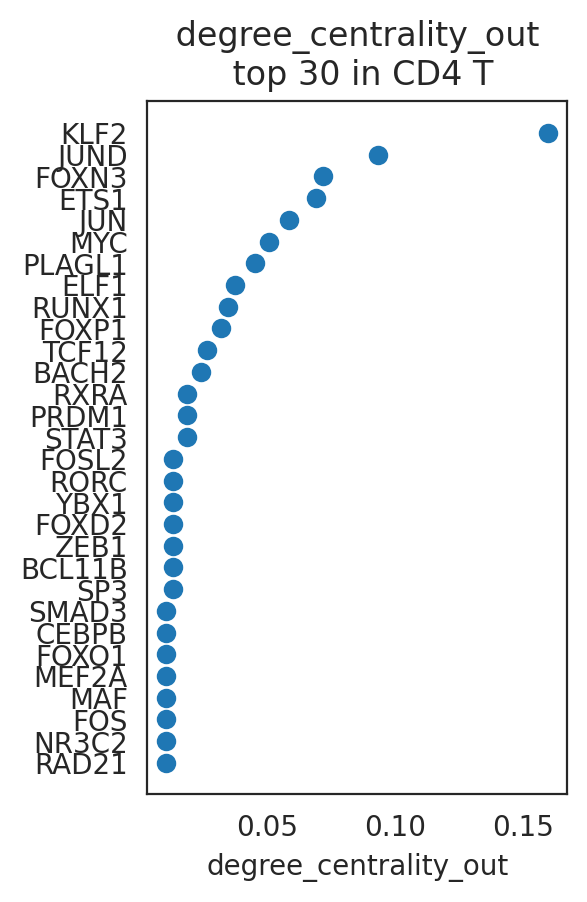

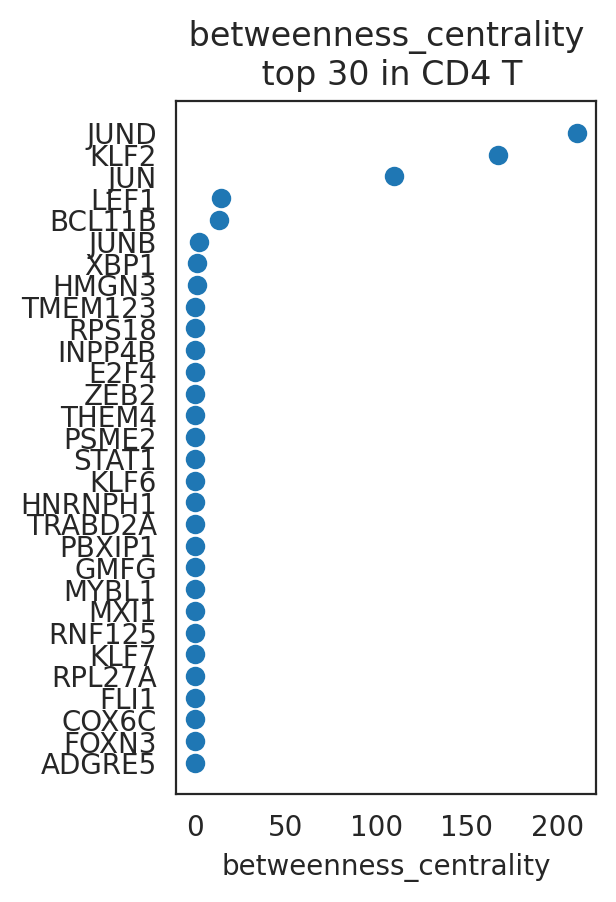

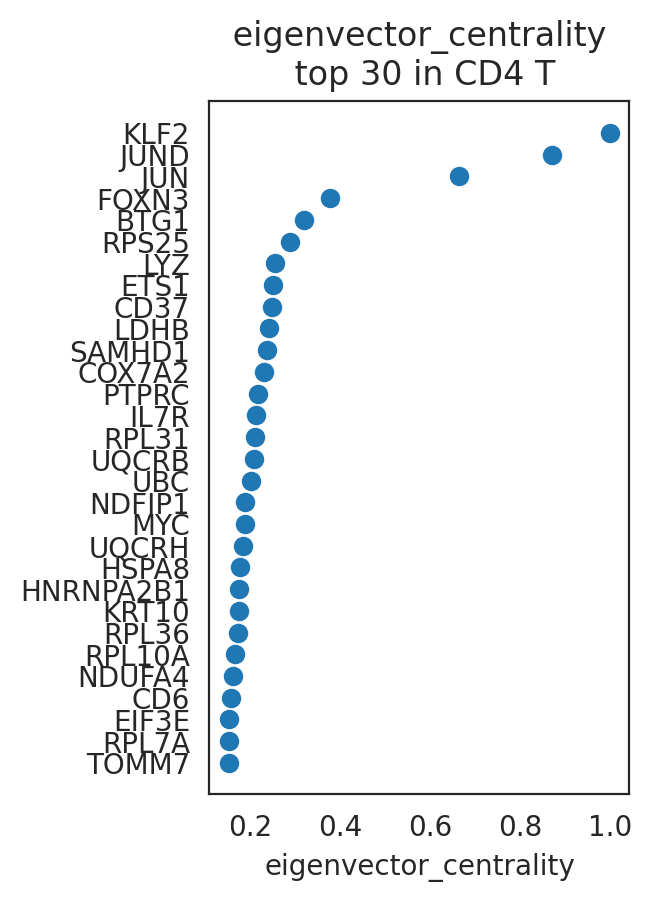

In [69]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="CD4 T", n_gene=30,save=f"{save_folder}/ranked_score")

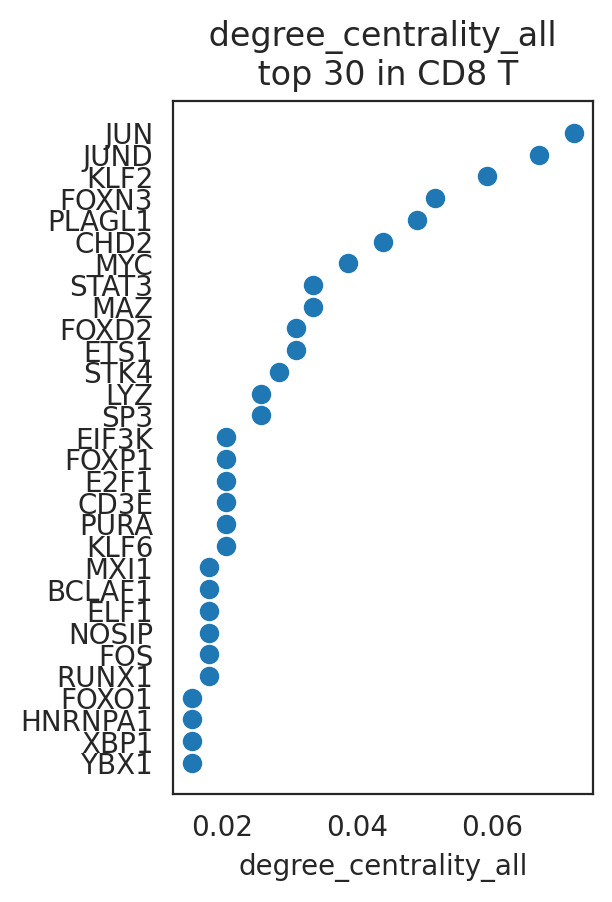

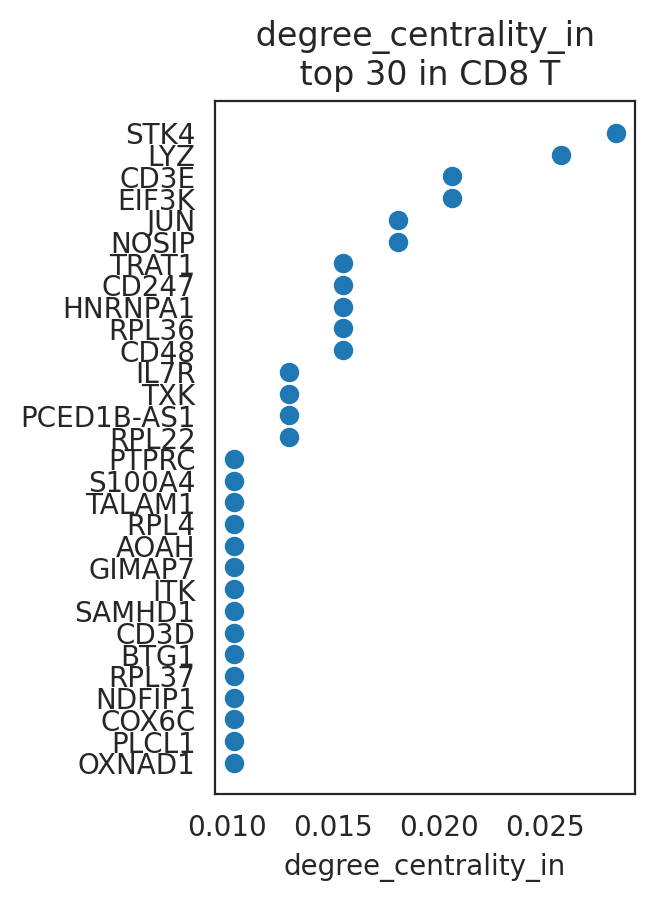

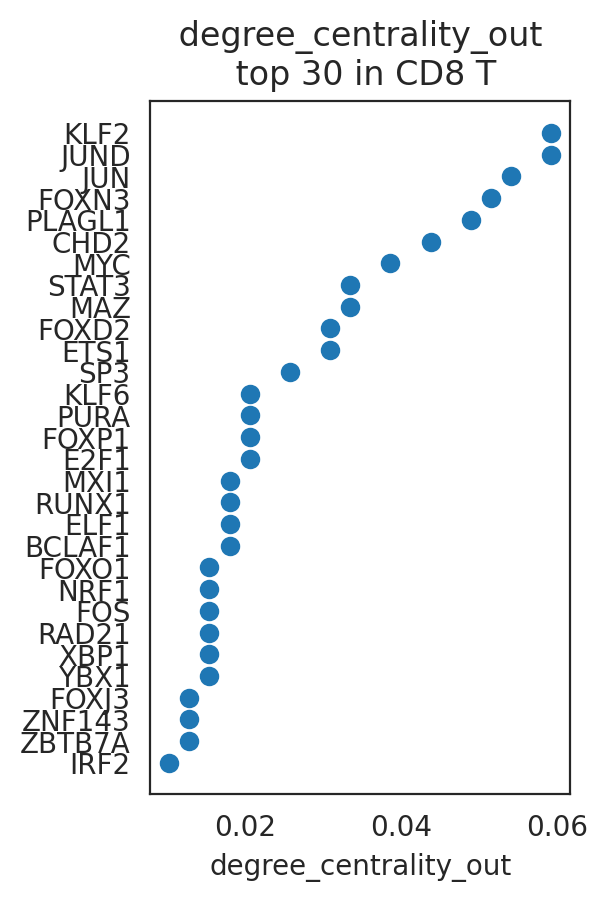

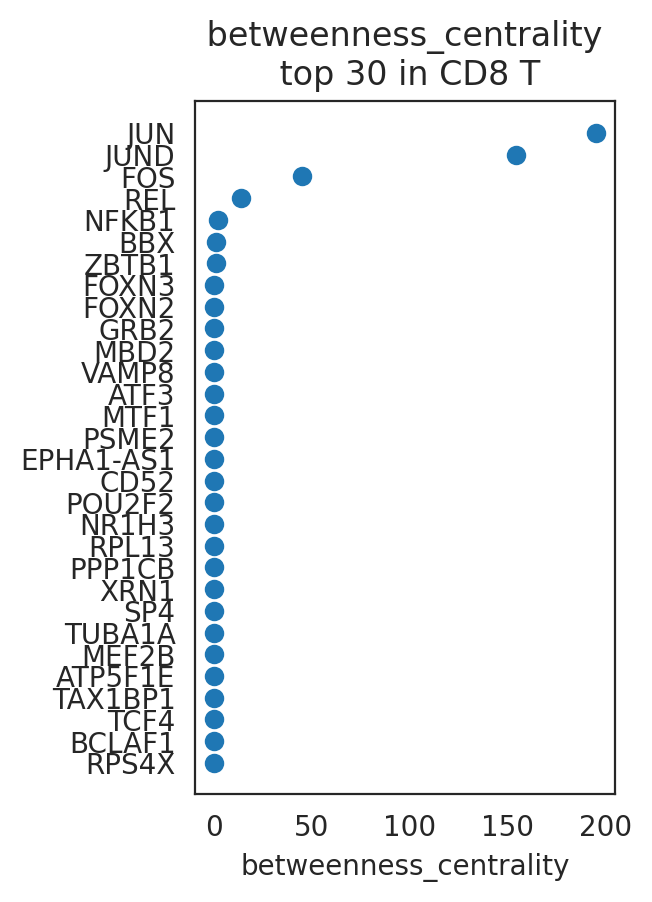

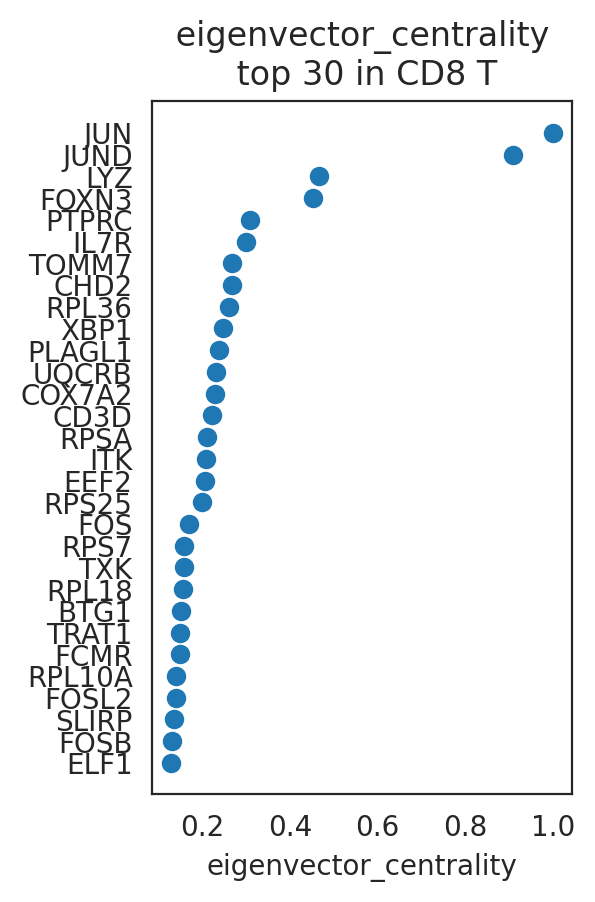

In [70]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="CD8 T", n_gene=30,save=f"{save_folder}/ranked_score")

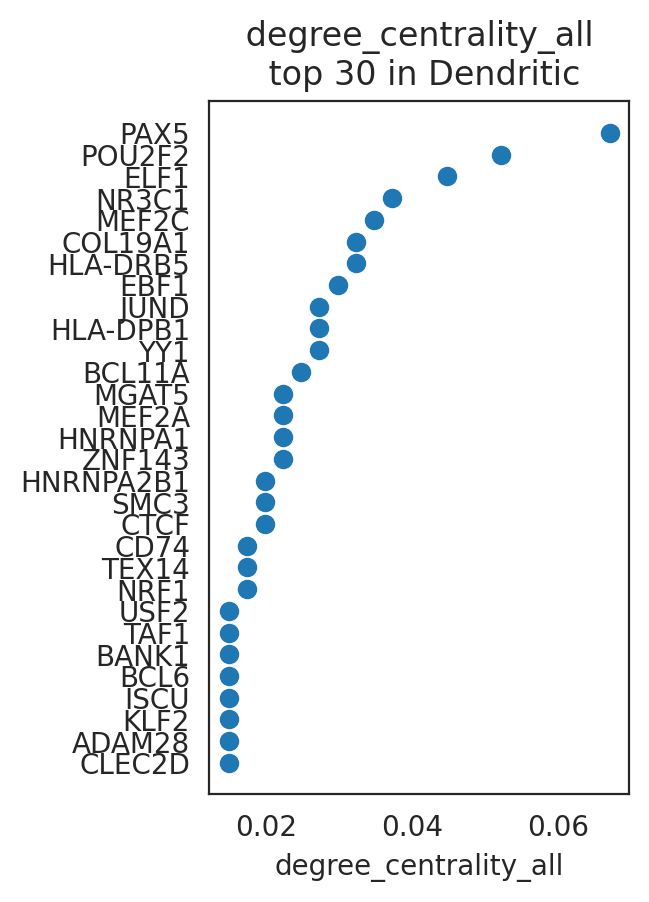

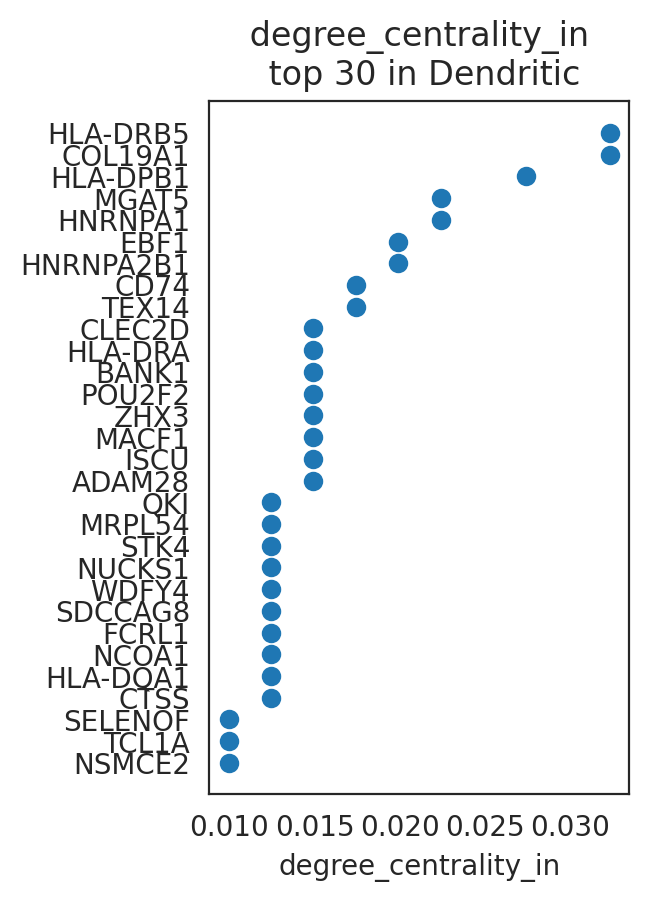

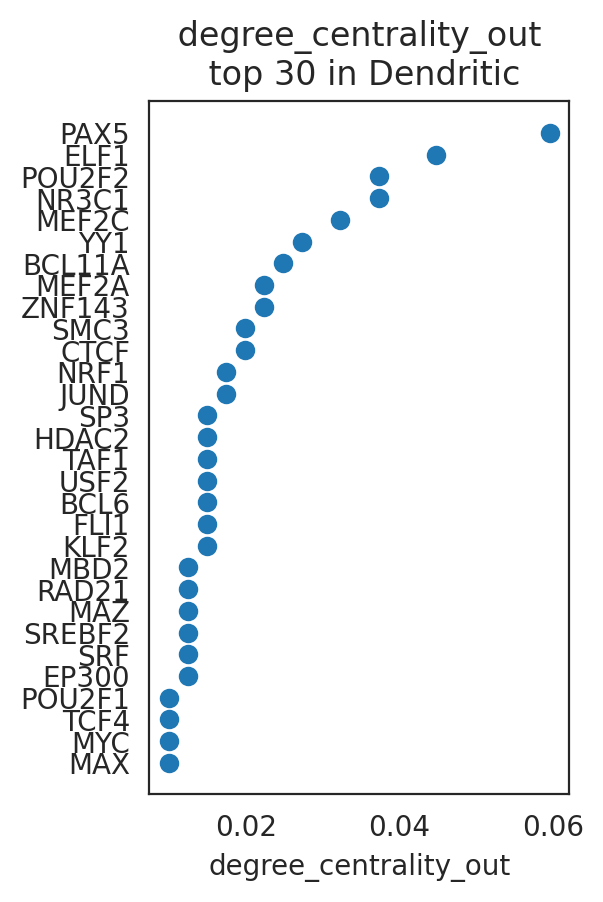

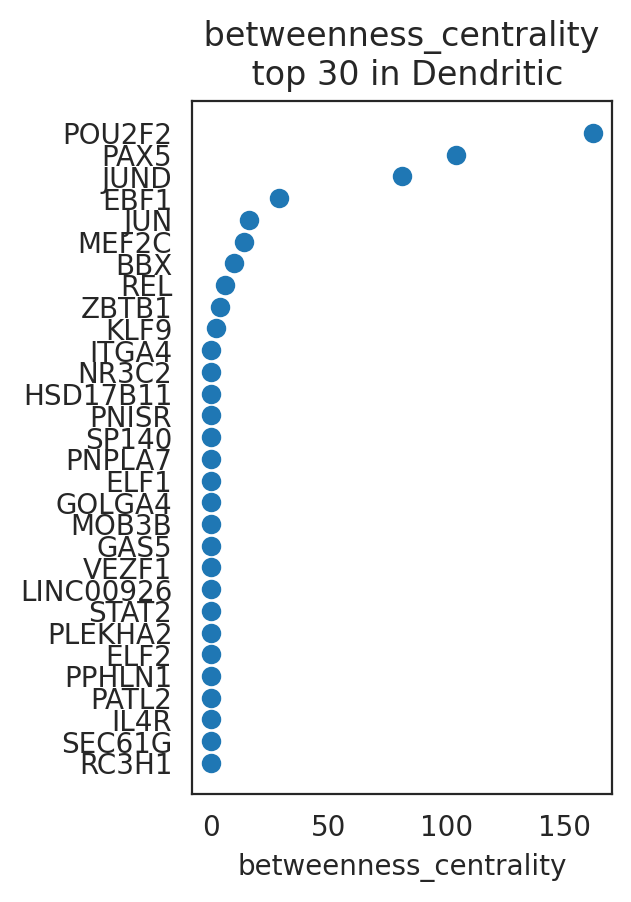

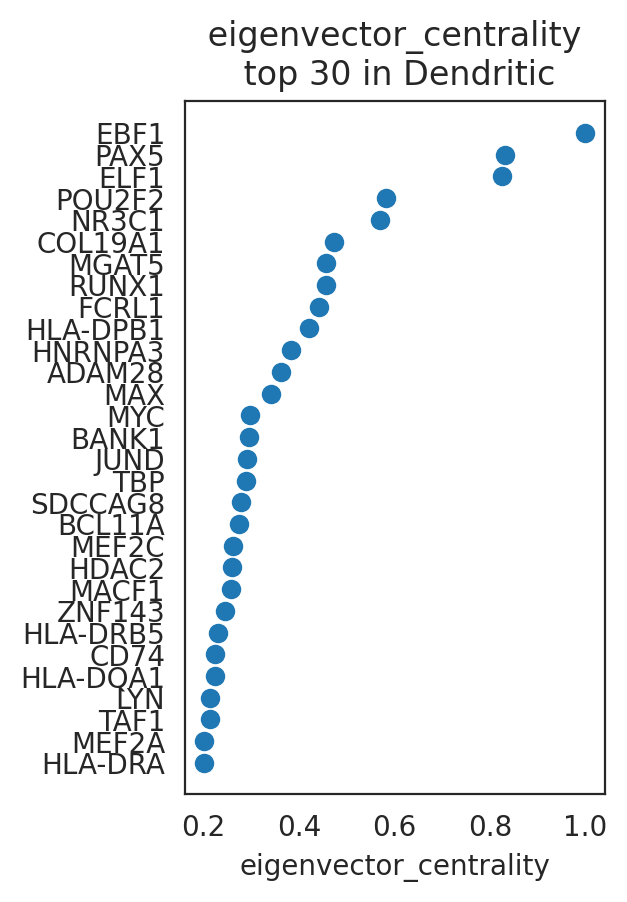

In [71]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="Dendritic", n_gene=30,save=f"{save_folder}/ranked_score")

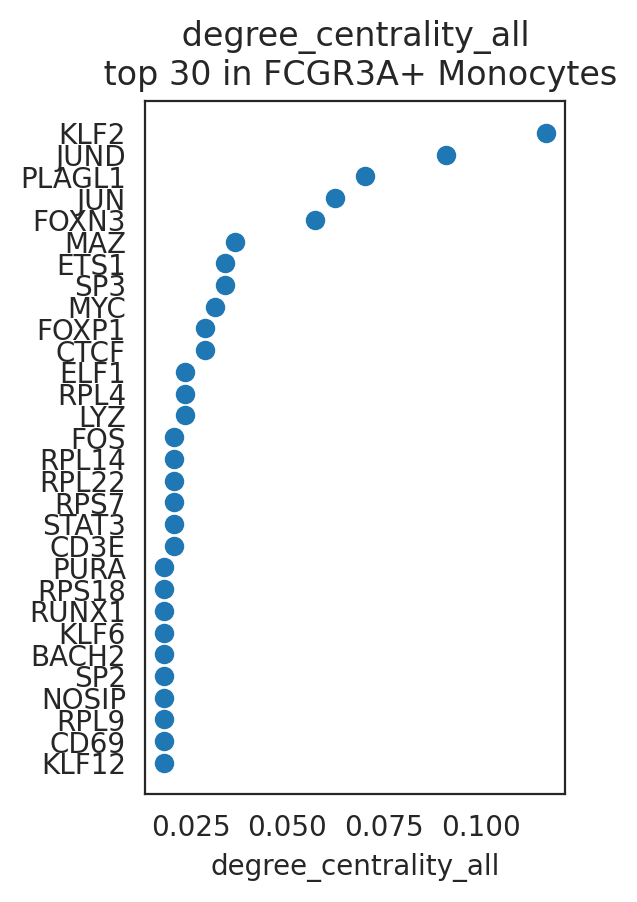

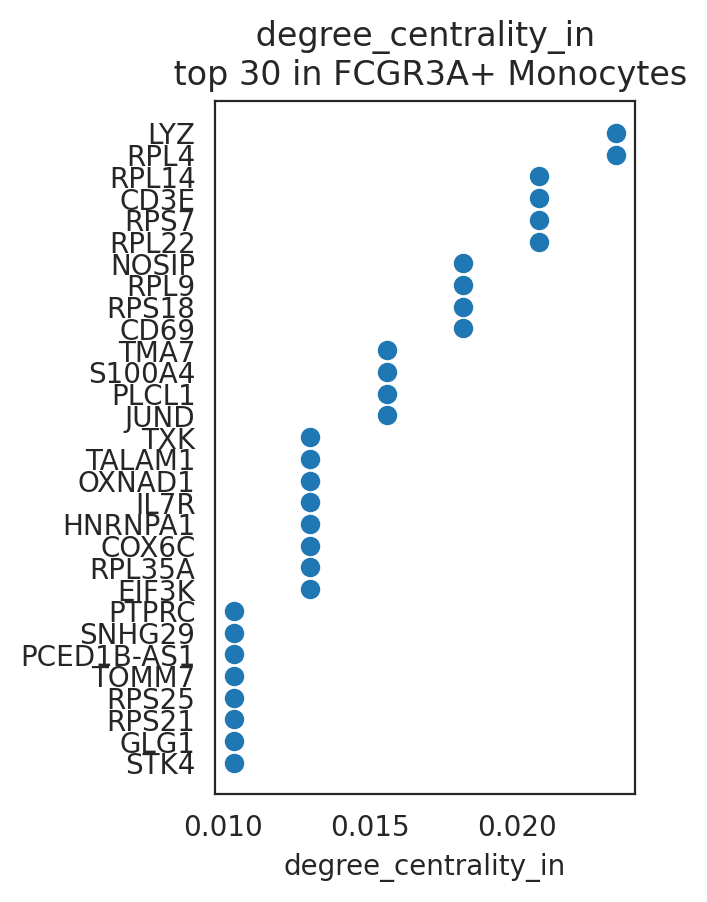

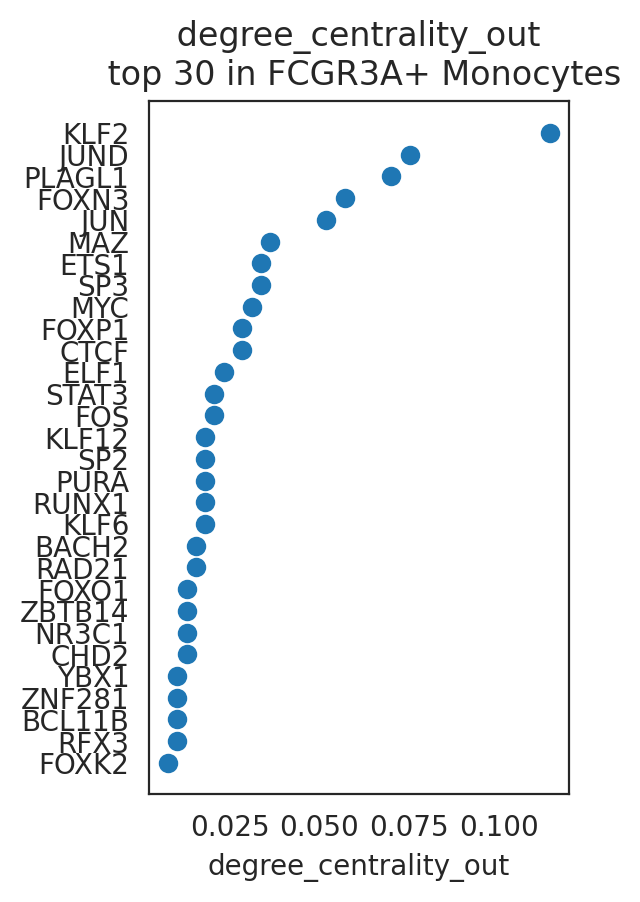

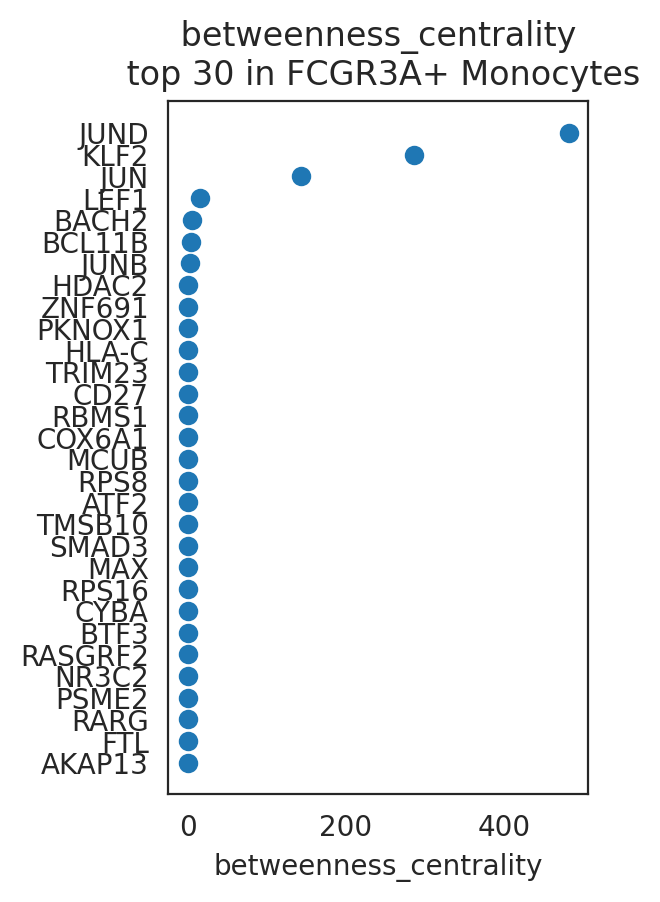

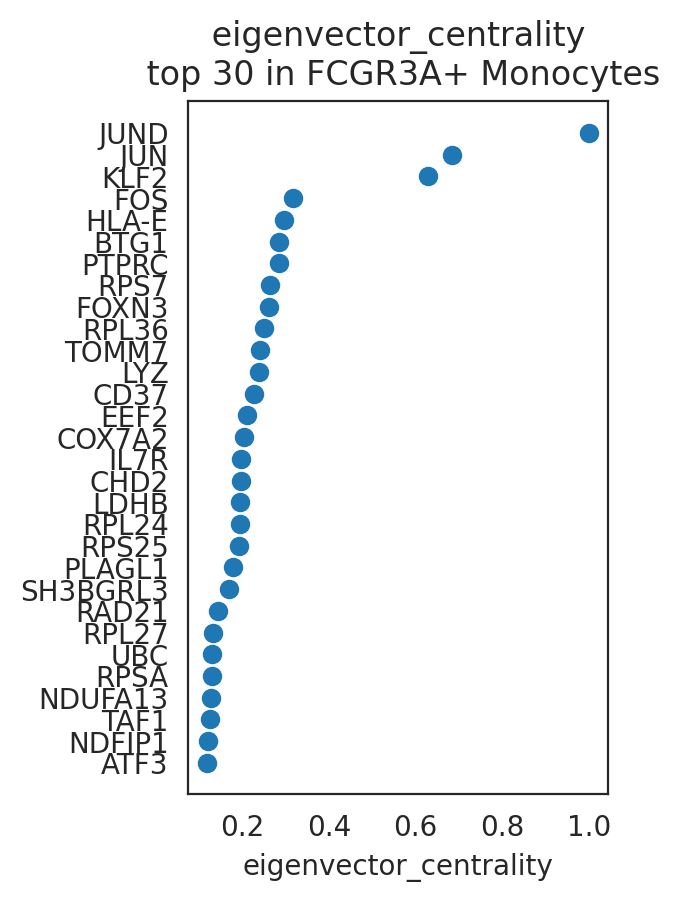

In [72]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="FCGR3A+ Monocytes", n_gene=30,save=f"{save_folder}/ranked_score")

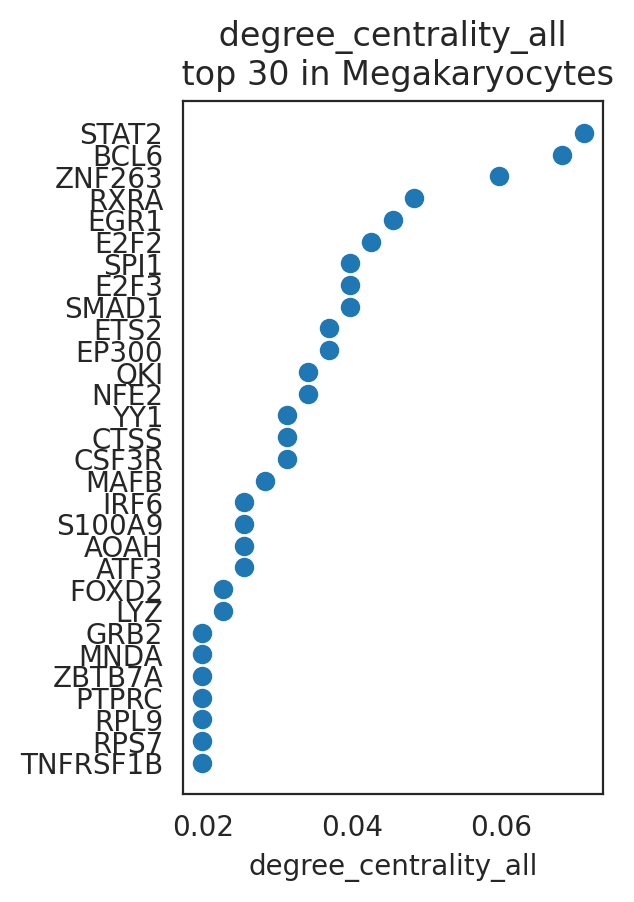

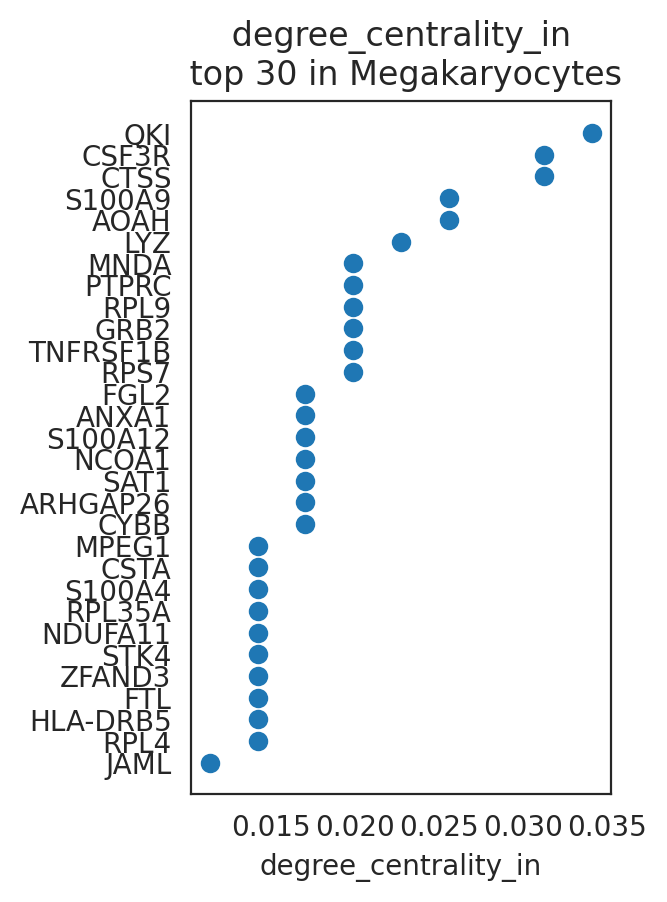

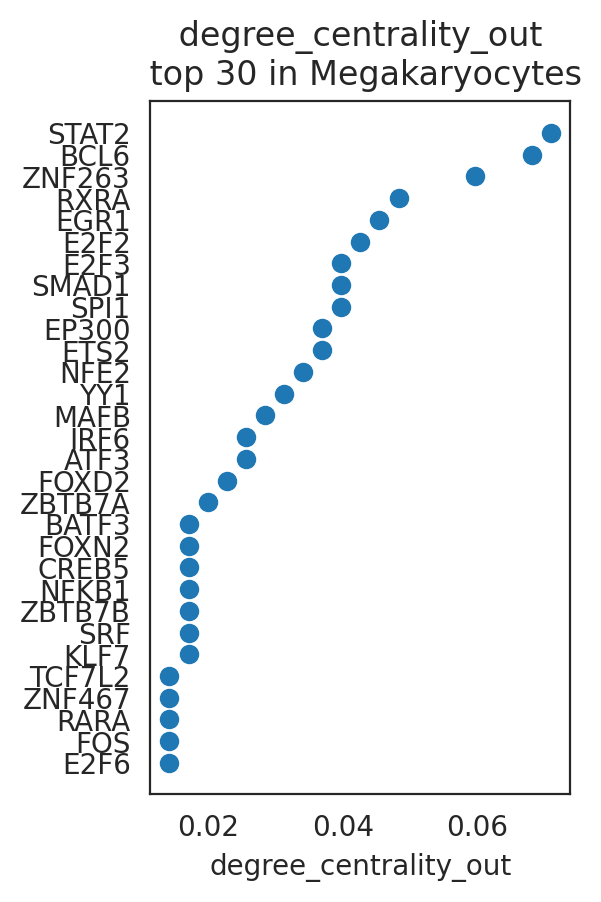

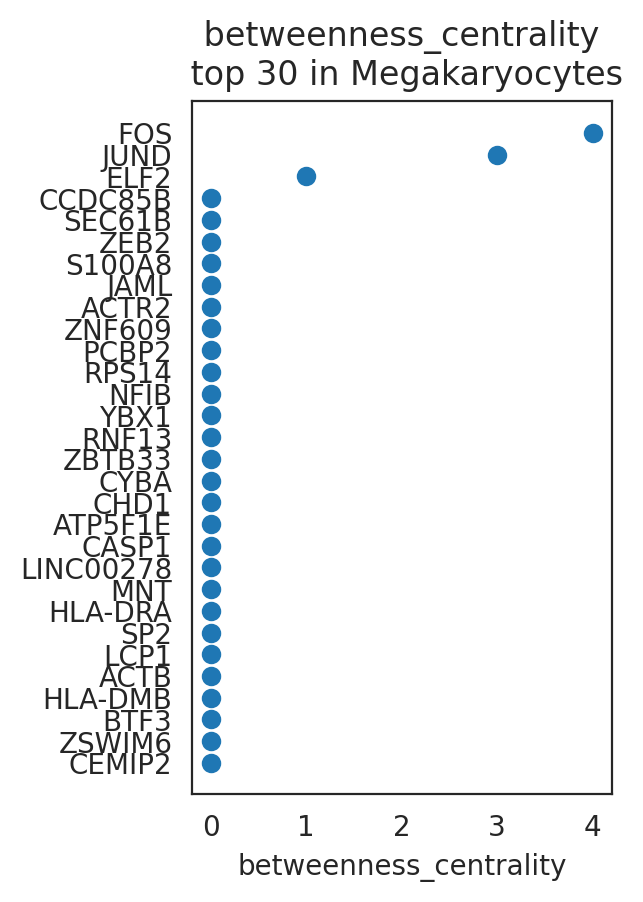

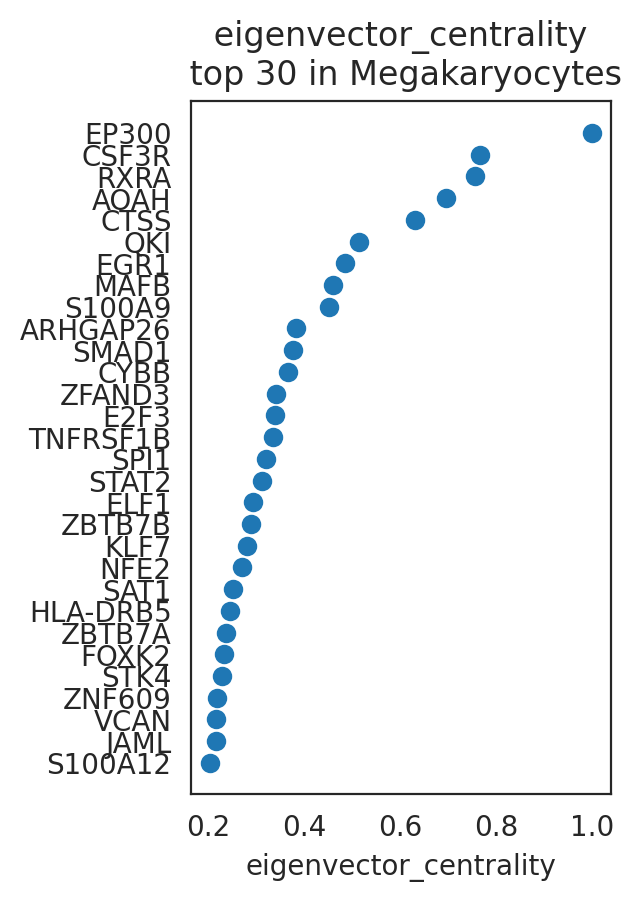

In [73]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="Megakaryocytes", n_gene=30,save=f"{save_folder}/ranked_score")

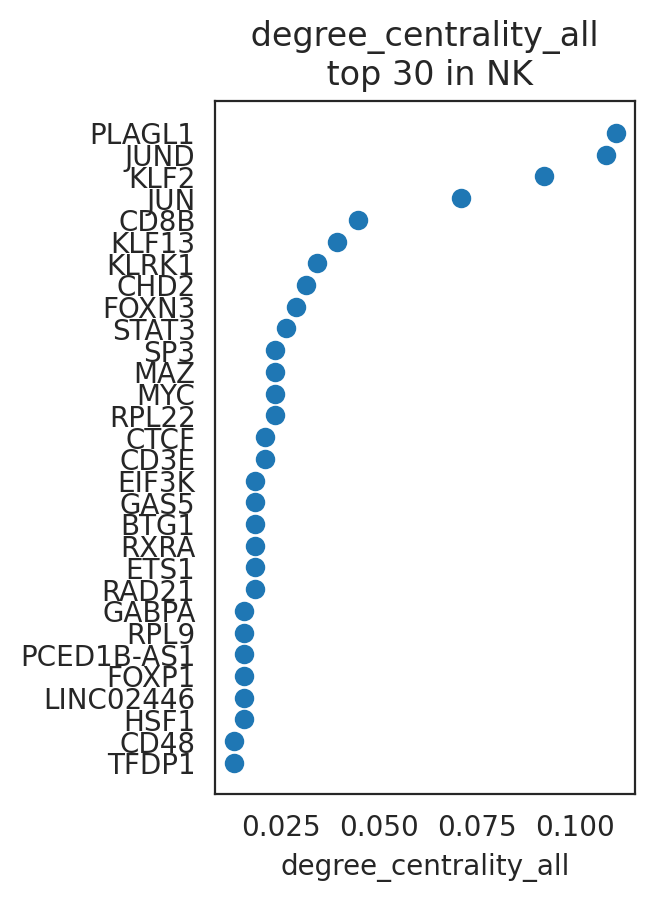

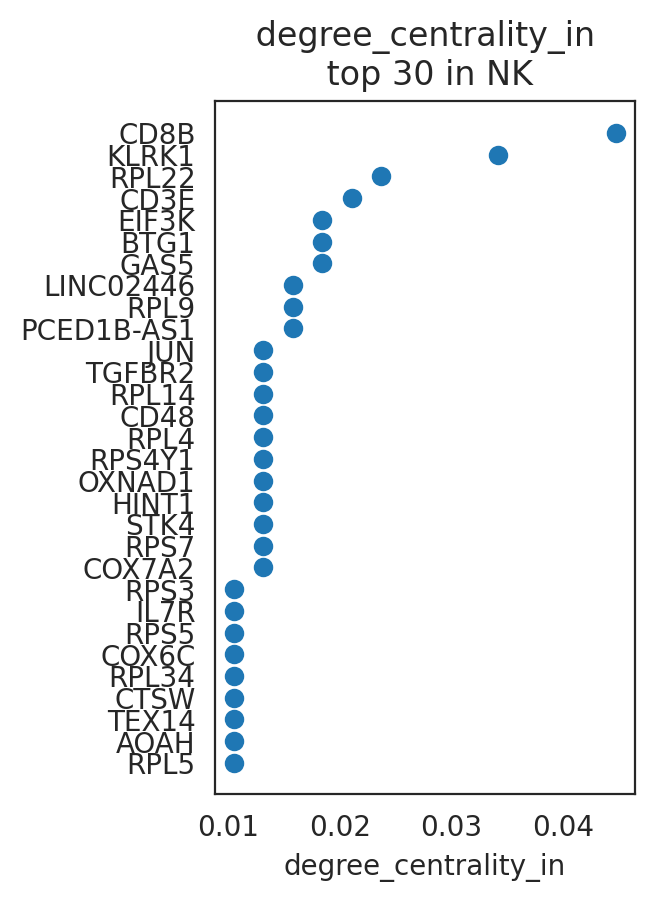

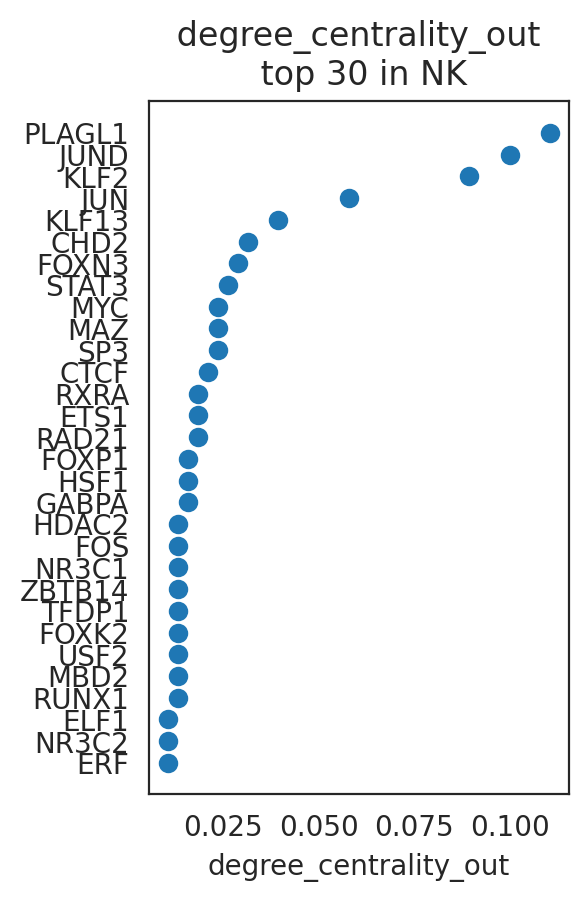

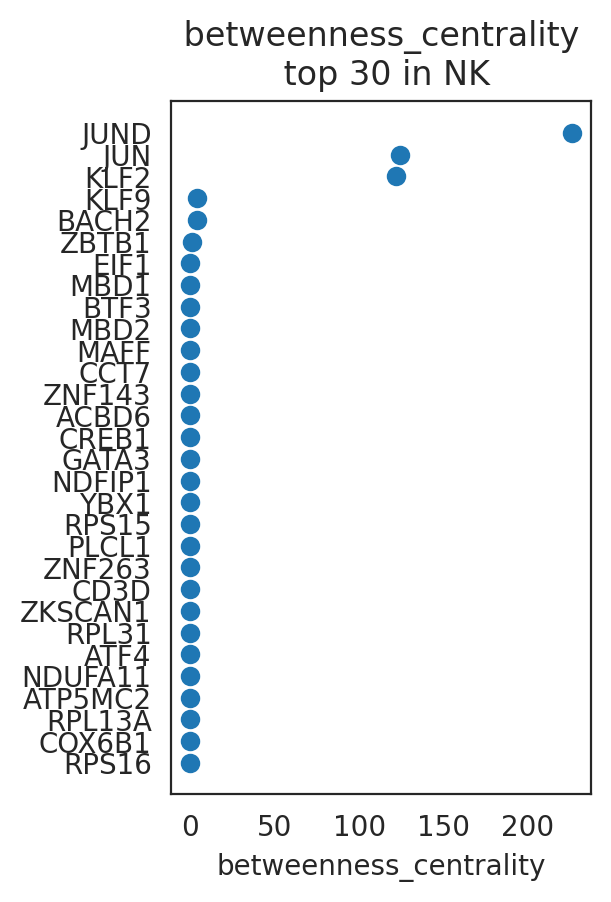

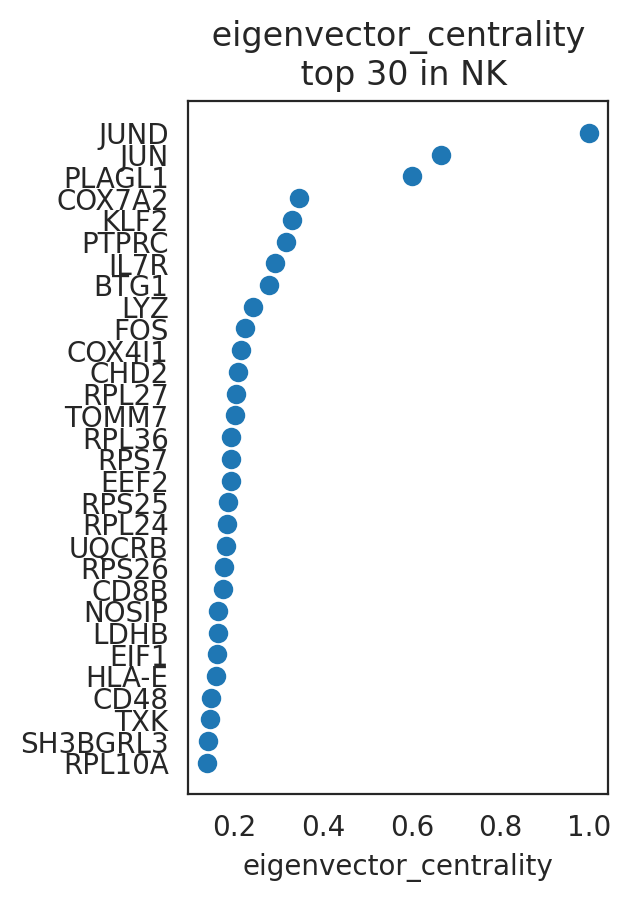

In [74]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="NK", n_gene=30,save=f"{save_folder}/ranked_score")

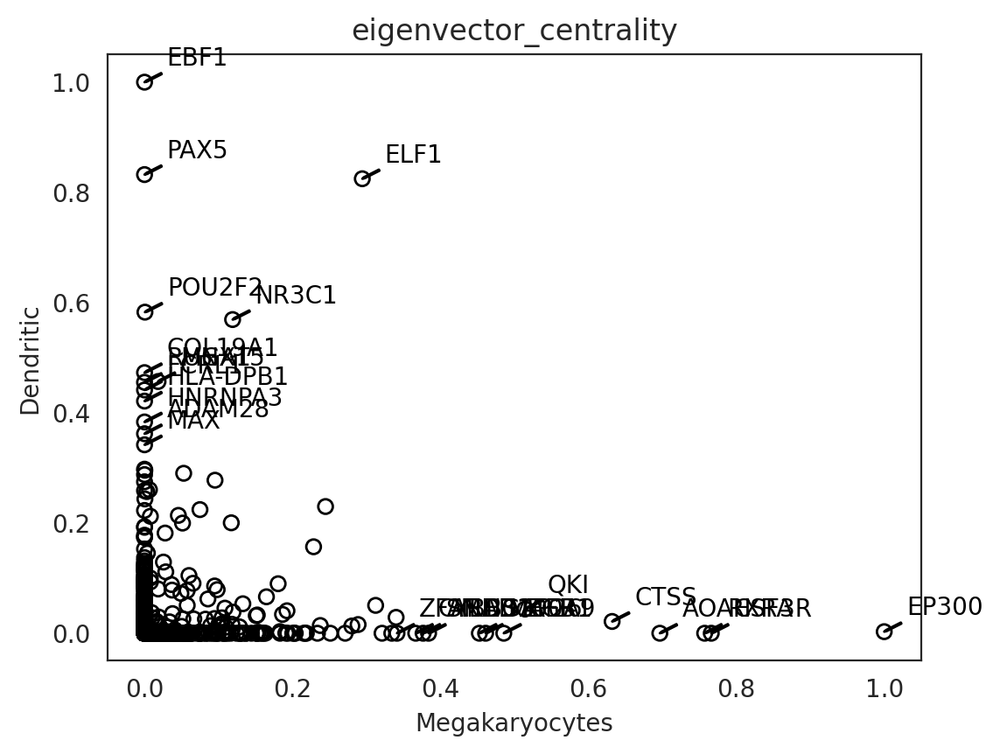

In [75]:
# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="Megakaryocytes", cluster2="Dendritic",
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

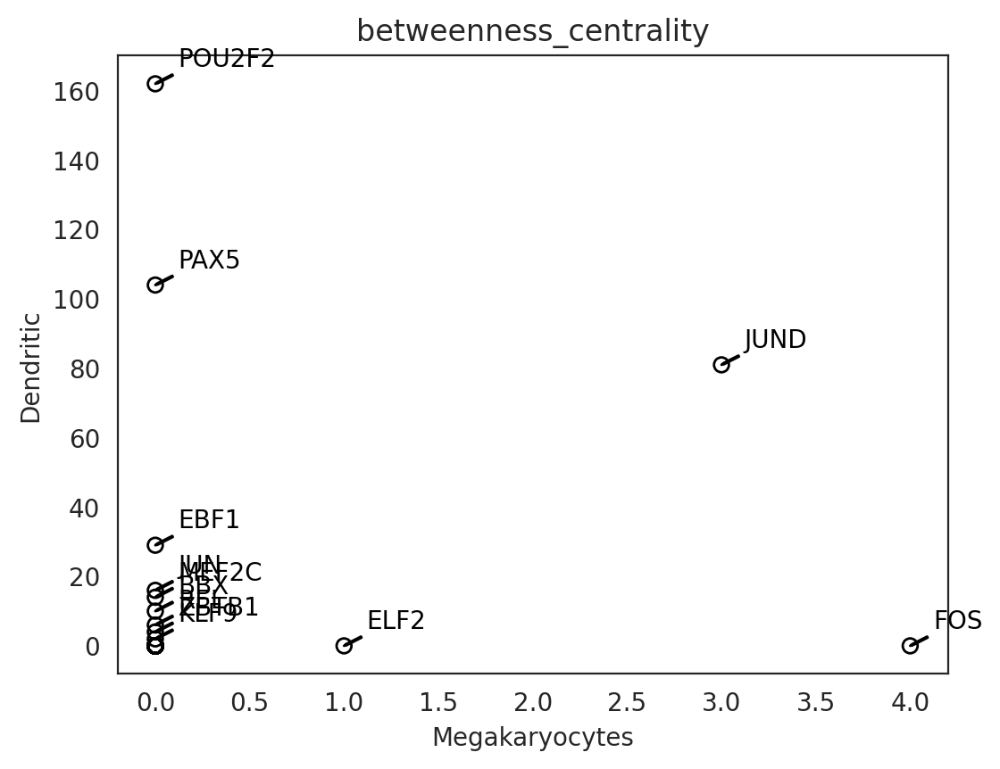

In [78]:
# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="betweenness_centrality",
                               cluster1="Megakaryocytes", cluster2="Dendritic",
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

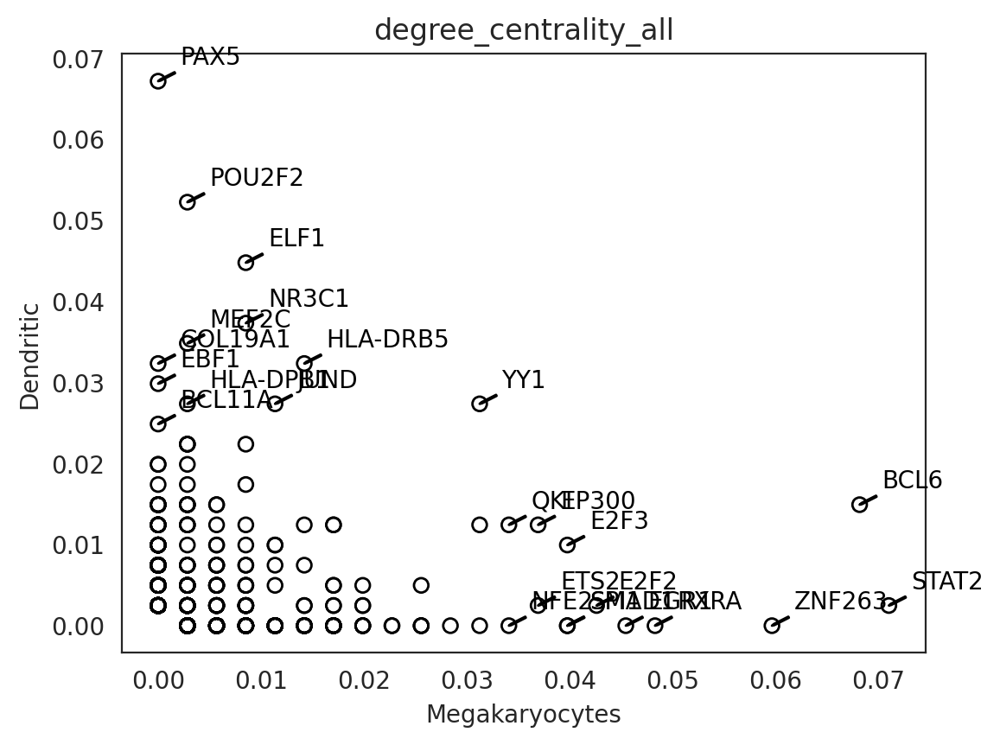

In [79]:
# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="degree_centrality_all",
                               cluster1="Megakaryocytes", cluster2="Dendritic",
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

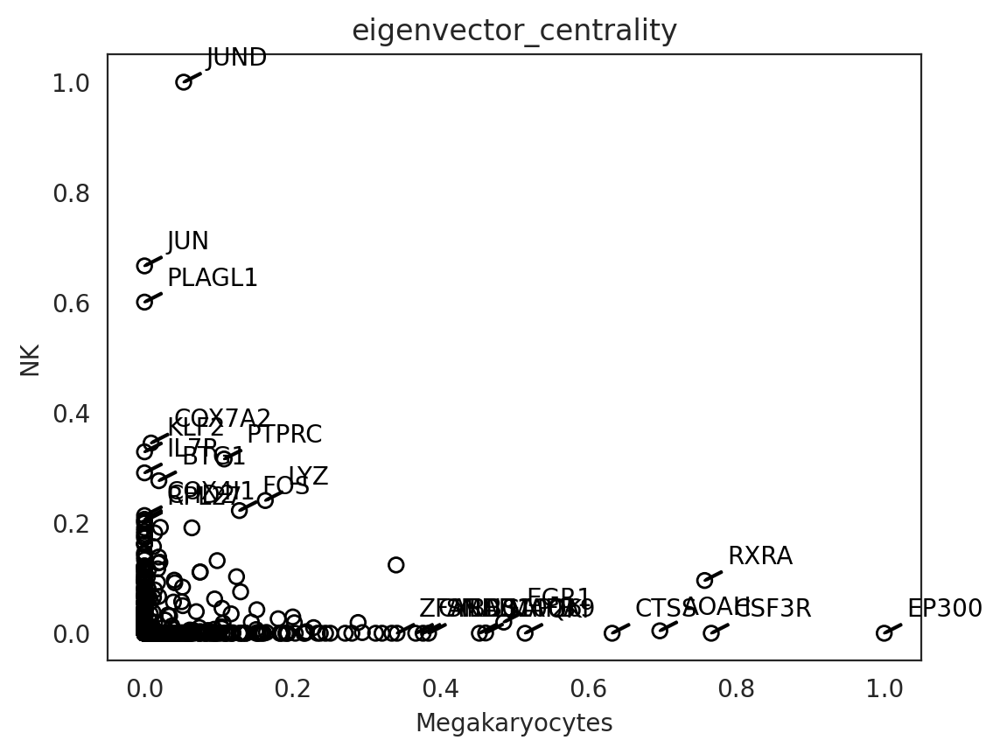

In [80]:
# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="eigenvector_centrality",
                               cluster1="Megakaryocytes", cluster2="NK",
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

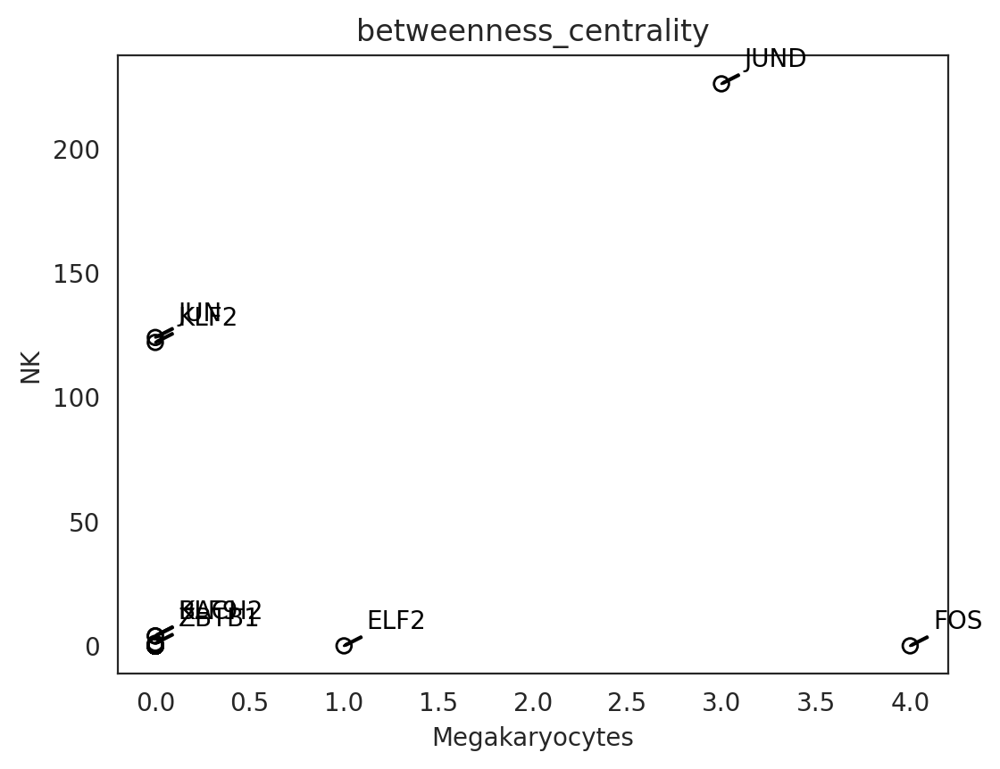

In [81]:
# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="betweenness_centrality",
                               cluster1="Megakaryocytes", cluster2="NK",
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

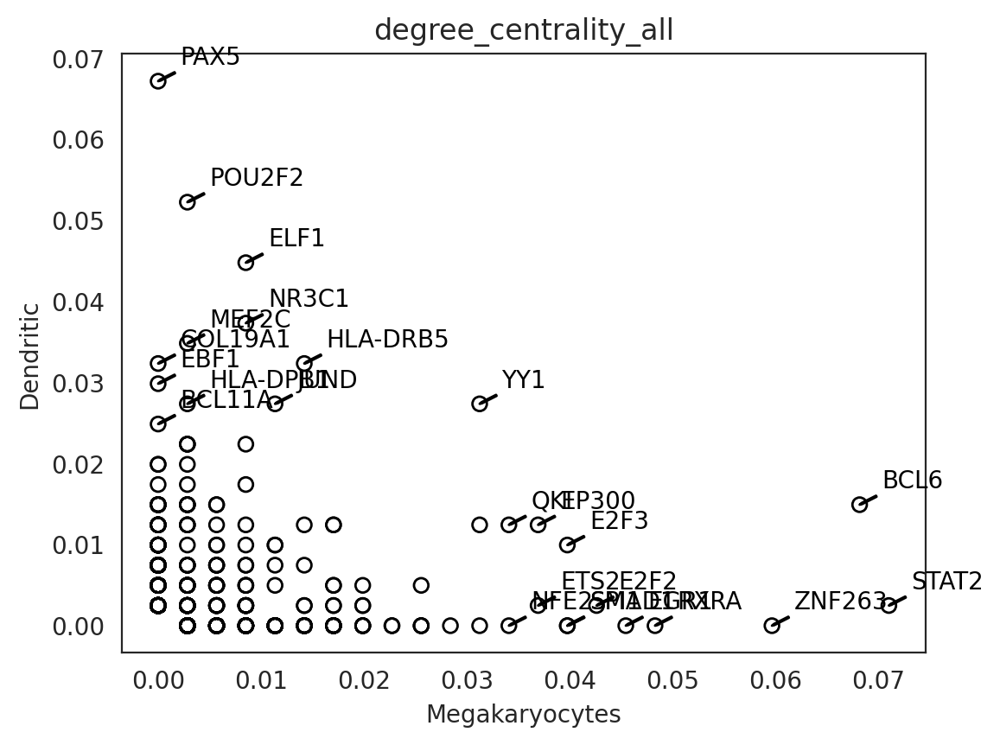

In [82]:
# Compare GRN score between two clusters
links.plot_score_comparison_2D(value="degree_centrality_all",
                               cluster1="Megakaryocytes", cluster2="Dendritic",
                               percentile=98,
                               save=f"{save_folder}/score_comparison")

EP300


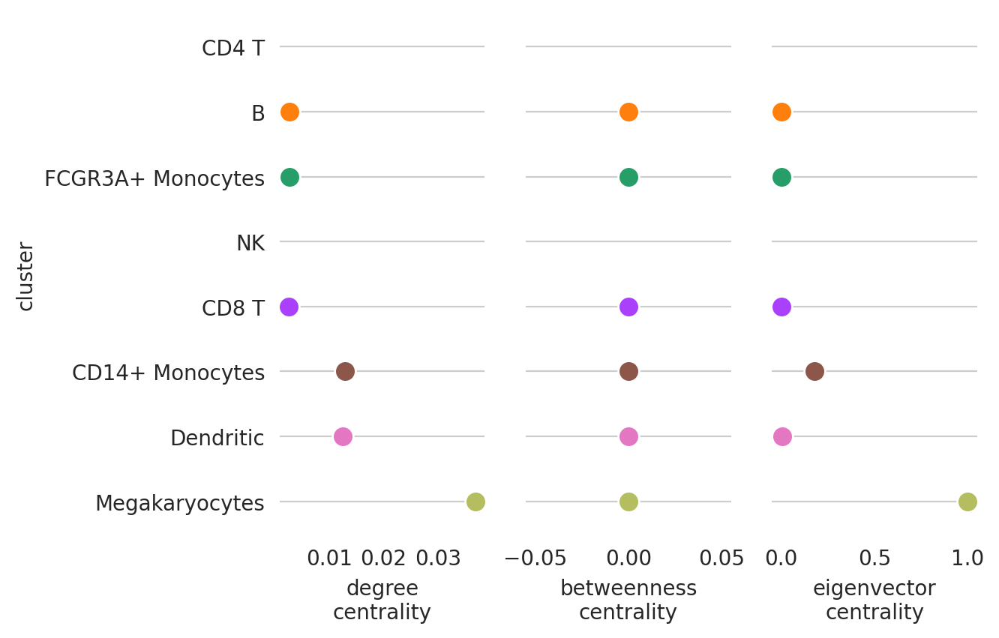

In [83]:
# Visualize EP300 network score dynamics
links.plot_score_per_cluster(goi="EP300", save=f"{save_folder}/network_score_per_gene/")

degree_centrality_all


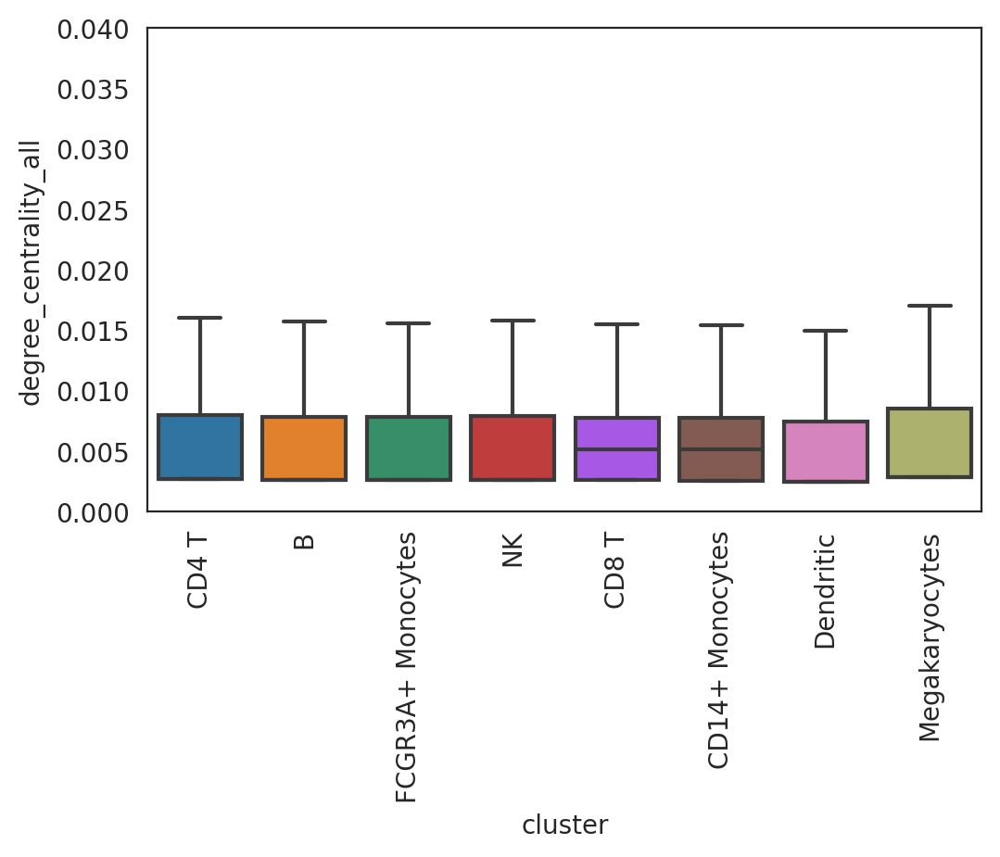

In [84]:
#network analysis, network score distribution
plt.rcParams["figure.figsize"] = [6, 4.5]
# Plot degree_centrality
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0,0.040])
links.plot_score_discributions(values=["degree_centrality_all"],
                               method="boxplot",
                               save=f"{save_folder}",
                              )

eigenvector_centrality


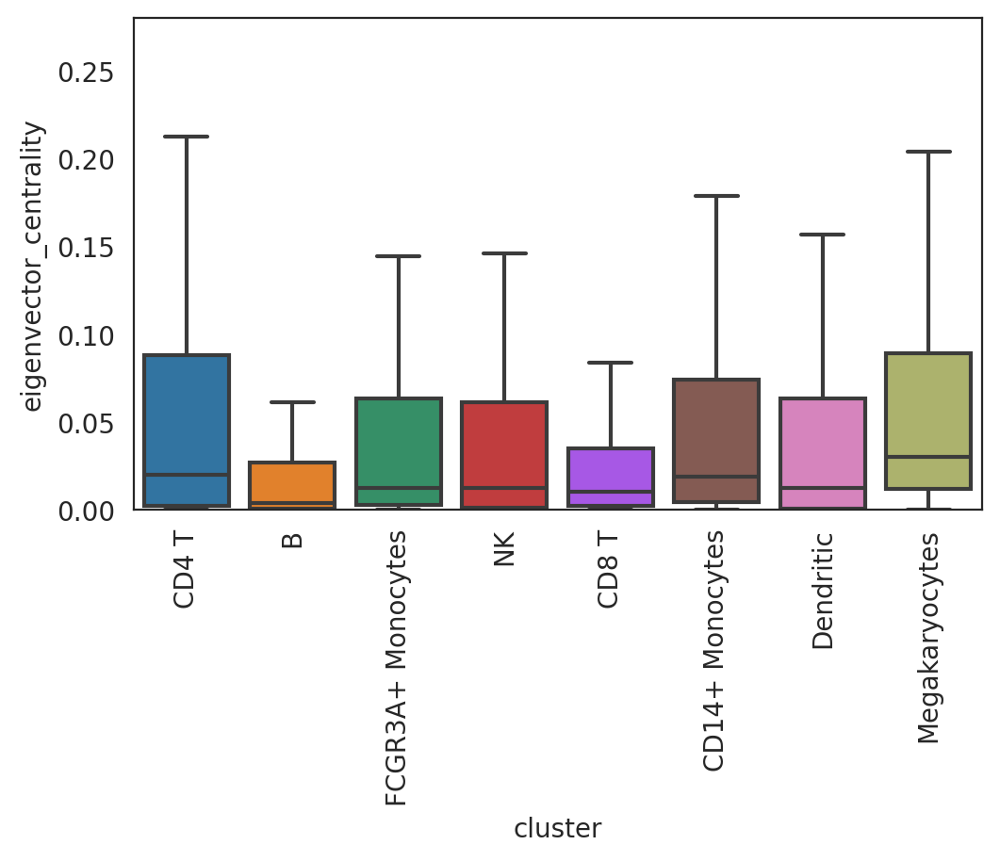

In [85]:
# Plot eigenvector_centrality
plt.subplots_adjust(left=0.15, bottom=0.3)
plt.ylim([0, 0.28])
links.plot_score_discributions(values=["eigenvector_centrality"],
                               method="boxplot",
                               save=f"{save_folder}")


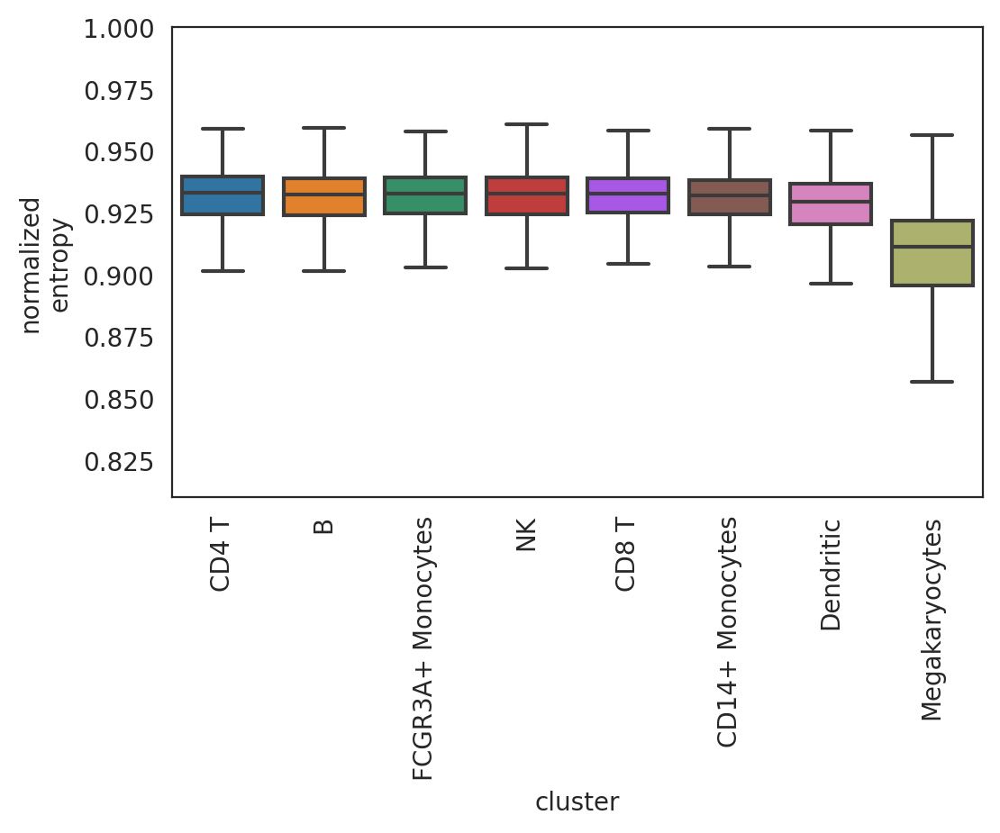

In [86]:
plt.subplots_adjust(left=0.15, bottom=0.3)
links.plot_network_entropy_distributions(save=f"{save_folder}")